# EDA - Elder Home Activity Prediction

## Table of Contents


### Import Environment Modules and Data

In [2]:
### Import Python Modules

## System Modules
import warnings
import yaml
from pathlib import Path

## Data Download Modules
import sqlite3
from urllib.request import urlretrieve


## Essential Modules
import numpy as np
import pandas as pd
from pandas.api.types import is_numeric_dtype
from scipy import sparse

## Graphical Modules
import seaborn as sns
import matplotlib.pyplot as plt
import missingno as msno


## Statistical Tests
import scipy.stats as st
from scipy.stats.mstats import kruskalwallis # Kruskal-Wallis
from scipy.stats import ttest_ind, chi2_contingency
from scipy.stats import MonteCarloMethod
from scipy.stats import entropy

import statsmodels.api as sm
from statsmodels.stats.multicomp import pairwise_tukeyhsd
from statsmodels.stats.weightstats import DescrStatsW
from statsmodels.stats.outliers_influence import variance_inflation_factor  # VIF for correlation among features


## Machine Learning Modules
from sklearn.base import BaseEstimator, TransformerMixin

## Pipeline and Train Test Split
from sklearn.pipeline import Pipeline, FeatureUnion
from sklearn.compose import ColumnTransformer
from sklearn.feature_selection import RFECV 
from sklearn.model_selection import StratifiedKFold, StratifiedGroupKFold, GroupShuffleSplit


## SciKit Learning Preprocessing  
from sklearn.preprocessing import StandardScaler, PolynomialFeatures
from sklearn.preprocessing import OneHotEncoder, OrdinalEncoder, FunctionTransformer
from sklearn.experimental import enable_iterative_imputer  # noqa
from sklearn.impute import SimpleImputer, IterativeImputer

### SciKit Learn ML Models

## Linear Models
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LogisticRegression 


## Tree Based Linear Models
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBClassifier

## Performance Metrics
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
from sklearn.metrics import confusion_matrix, classification_report, ConfusionMatrixDisplay, roc_curve, auc
from sklearn.metrics import mutual_info_score
import shap

### Hyper-parameter Tuning

## GridSearch CV
from sklearn.model_selection import cross_val_score

## Optuna for Hyperparameter Tuning
from optuna.integration import OptunaSearchCV
from optuna.distributions import IntDistribution, FloatDistribution, CategoricalDistribution

### Global Plot Settings

The following code standardize the chart format.

In [3]:
sns.set_style('whitegrid')
plot_size_fig = (12,6)
plot_size_heatmap = (15,15)

### Loading Configuration File

The following code load the configuration file.

In [3]:
# Configuration file path
config_path = "./src/config.yaml"

# Load configuration
try:
    with open(config_path, "r") as file:
        config = yaml.safe_load(file)
except Exception as e:
    print(f'Exception (load configuration): {e}')

### Load Data

The following code create a data folder first and down load the data file into data folder. Data soruce extract from configuration file.

In [4]:
source_path = config['source_path']
print(source_path)

folder_path = Path('./data')
if not folder_path.exists():
        folder_path.mkdir(parents=True)
        print(f'Data folder not exists. Create folder')

file_path = Path(config['db_path'])

if file_path.exists():
    print('File already exist, skip download.')
else:
    try:
        print('Downloading Data File')
        urlretrieve(source_path, file_path)
        print('Download completed')
    except:
        print("Error downloading file. Please check if the file exist at the location:", source_path)
        print("Please also check if Internet connection is present.")

https://techassessment.blob.core.windows.net/aiap21-assessment-data/gas_monitoring.db
File already exist, skip download.


The following code connect the database file and list all the tables.

In [5]:
list_all_tables = "SELECT name FROM sqlite_master WHERE type='table';"

conn = sqlite3.connect(file_path)
cur = conn.cursor()
cur.execute(list_all_tables)
tables_all = cur.fetchall()[0]
tables_all = list(tables_all)
print(tables_all)
conn.close()

['gas_monitoring']


Since there is only one table `gas_monitoring`, the following code will construct SQL query to read the only table.

In [6]:
read_table = 'SELECT * FROM ' + tables_all[0]
print(read_table)

SELECT * FROM gas_monitoring


The following code read the table and convert it to data frame.

In [7]:
conn = sqlite3.connect(config['db_path'])
df = pd.read_sql(read_table, conn)
df.to_csv(config['csv_path'], index=False)
print(df.shape)
conn.close()

(10000, 14)


In [8]:
# give an indication on how large the dataset is
len(df)

10000

## Problem Statement

**As the member of ElderGuard Analytics, our company has collected data from smart home monitoring system deployed in elderly residents' home. Our sensors includes indoor air quality (CO2 Sensors, CO Sensor, Metal Oxide Sensors), environmental conditions (temperature, humidity), HVAC system operations, and lighting patterns throughout different data collection sessions.**   
 
**Our task is to develop predictive models that can enhance care coordination, identify patterns of concern, and provide insights to family members and healthcare providers. The objective is to provide proactive care monitoring and maintain residents' independence.**

**Specifically, we need to build and evaluate prediction models and identify their respective key features of the dataset that categorize the `Activity` level of the residents. We should also identify which features contribute most significantly to the activity level prediction.**


## Data Dictionary

Data Source
- https://techassessment.blob.core.windows.net/aiap21-assessment-data/gas_monitoring.db

| Feature Names | Description  | Data Type | Examples & Remarks |
| ------------- |:------------- | :-----: | :----------------| 
| Time of Day | Time period when measurements were recorded. | string | `morning`, `night` etc|
| Temperature | Indoor air temperature measured in degrees Celsius by environmental sensors installed in the resident's living space. | float | `19.63`, `20.10` etc|
| Humidity | Relative humidity percentage of indoor air indicating moisture levels. | float | `53.83`, `48.42` etc|
| CO2_InfraredSensor | Carbon dioxide concentration readings from an infrared sensor. | float |  `125.49`, `113.50` etc|
| CO2_ElectroChemicalSensor | Carbon dioxide concentration readings from an electrochemical sensor. | float | `571.09`, `613.65` etc |
| MetalOxideSensor_Unit1 | Metal oxide sensor reading for detecting various gases and volatile organic compounds. | float | `478.55`, `515.14` etc |
| MetalOxideSensor_Unit2| Metal oxide sensor reading for detecting various gases and volatile organic compounds.  | float | `735.85`, `744.02` etc |
| MetalOxideSensor_Unit3 | Metal oxide sensor reading for detecting various gases and volatile organic compounds. | float | `497.59`, `720.27` etc |
| MetalOxideSensor_Unit4 | Metal oxide sensor reading for detecting various gases and volatile organic compounds. | float | `565.05`, `600.22` etc|
| CO_GasSensor | Carbon monoxide concentration levels. | string | `medium`, `low` etc|
| Session ID | Unique identifier for each monitoring session.   | integer | `7241`, `9385` etc|
| HVAC Operation Mode | Current heating, ventilation, and air conditioning system operating mode. | string | `ventilation_only`, `off` etc|
| Ambient Light Level | Indoor lighting conditions.  | string | `very_dim`, `None` etc|
| Activity Level | Classified resident activity status based on environmental indicators. | string | `Low Activity`, `High Activity` etc|

## Basic Data Exploration

In [9]:
# Peek on the first 5 rows of the dataset
df.head()

,Time of Day,Temperature,Humidity,CO2_InfraredSensor,CO2_ElectroChemicalSensor,MetalOxideSensor_Unit1,MetalOxideSensor_Unit2,MetalOxideSensor_Unit3,MetalOxideSensor_Unit4,CO_GasSensor,Session ID,HVAC Operation Mode,Ambient Light Level,Activity Level
0,morning,19.63,53.83,125.49,571.09,478.55,735.85,497.59,565.05,medium,7241,off,very_dim,Low Activity
1,morning,19.66,53.69,126.34,575.79,491.96,740.28,NaN,557.08,low,7241,ventilation_only,bright,Low Activity
2,night,20.95,54.12,119.34,556.53,437.50,718.34,NaN,612.62,medium,9385,off,None,Low Activity
3,morning,20.10,50.48,113.50,NaN,515.14,744.02,676.15,600.22,low,7241,eco_mode,very_bright,High Activity
4,morning,19.89,48.42,92.77,613.65,535.66,770.27,720.27,625.73,low,7241,Heating_active,moderate,Low Activity


### Detecting Duplicates

In [10]:
# check if there are any duplicates in the dataset
df.duplicated().sum()

np.int64(120)

**There are 120 duplicates.**

In [11]:
# Show the duplicates for visual inspection
df[df.duplicated(keep=False)].sort_values(by=list(df.columns))

,Time of Day,Temperature,Humidity,CO2_InfraredSensor,CO2_ElectroChemicalSensor,MetalOxideSensor_Unit1,MetalOxideSensor_Unit2,MetalOxideSensor_Unit3,MetalOxideSensor_Unit4,CO_GasSensor,Session ID,HVAC Operation Mode,Ambient Light Level,Activity Level
685,afternoon,16.86,46.12,85.16,590.81,436.11,739.87,705.77,634.27,low,2679,cooling_active,bright,Moderate Activity
4066,afternoon,16.86,46.12,85.16,590.81,436.11,739.87,705.77,634.27,low,2679,cooling_active,bright,Moderate Activity
1827,afternoon,17.33,47.63,82.59,613.07,438.34,757.98,725.52,649.64,extremely low,3418,cooling_active,very_bright,Moderate Activity
3487,afternoon,17.33,47.63,82.59,613.07,438.34,757.98,725.52,649.64,extremely low,3418,cooling_active,very_bright,Moderate Activity
1770,afternoon,18.12,48.85,93.17,612.03,489.97,761.61,NaN,655.67,extremely low,2105,off,very_bright,Low Activity
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6782,night,22.17,54.21,131.98,557.41,415.71,688.52,626.33,569.10,None,1903,ventilation_only,bright,Low Activity
6510,night,22.82,53.12,113.88,546.94,470.60,691.31,628.75,564.82,low,6817,cooling_active,very_bright,Low Activity
9083,night,22.82,53.12,113.88,546.94,470.60,691.31,628.75,564.82,low,6817,cooling_active,very_bright,Low Activity
5490,night,23.09,49.40,114.69,572.40,385.17,680.60,NaN,555.23,high,7395,cooling_active,bright,Low Activity


**There could be two possible reasons for duplications. The first reason is that there are error while processing data causing duplication. In this case, we should remove the duplicates. The second reason is there is a slim possibility that the sensor reading is the same.**

**For now, we will drop the duplicates assuming error data processing. We will revisit this issue if we discover evidence that the duplicates are coincidence.**

In [12]:
# compute the percentage of duplicates in the dataset
duplicates_percentage = df.duplicated().sum() / len(df) * 100
print(f'The number of duplicates is {df.duplicated().sum()}, which is {duplicates_percentage:.2f}% of the entire dataset. ')

The number of duplicates is 120, which is 1.20% of the entire dataset. 


**Since duplicated data is about 1.2% of the entire dataset, we will remove the duplicates as it would not have impacted our analysis or prediction.**

In [13]:
# Remove duplicates
df = df.drop_duplicates()

In [14]:
# check if there are any duplicates in the dataset for confirmation
df.duplicated().sum()

np.int64(0)

In [15]:
# size of the dataset after removing duplicates
len(df)

9880

### Detecting Missing Values

In [16]:
# check if there are any missing values in the dataset
df.isnull().sum()

Time of Day                     0
Temperature                     0
Humidity                        0
CO2_InfraredSensor              0
CO2_ElectroChemicalSensor     705
MetalOxideSensor_Unit1          0
MetalOxideSensor_Unit2          0
MetalOxideSensor_Unit3       2554
MetalOxideSensor_Unit4          0
CO_GasSensor                 1365
Session ID                      0
HVAC Operation Mode             0
Ambient Light Level          2519
Activity Level                  0
dtype: int64

**There are 4 sensors that contain missing values. We will study the missing data later.**

### Data Structure Analysis

In [17]:
# Display the information and data structure of the dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 9880 entries, 0 to 9999
Data columns (total 14 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Time of Day                9880 non-null   object 
 1   Temperature                9880 non-null   float64
 2   Humidity                   9880 non-null   float64
 3   CO2_InfraredSensor         9880 non-null   float64
 4   CO2_ElectroChemicalSensor  9175 non-null   float64
 5   MetalOxideSensor_Unit1     9880 non-null   float64
 6   MetalOxideSensor_Unit2     9880 non-null   float64
 7   MetalOxideSensor_Unit3     7326 non-null   float64
 8   MetalOxideSensor_Unit4     9880 non-null   float64
 9   CO_GasSensor               8515 non-null   object 
 10  Session ID                 9880 non-null   int64  
 11  HVAC Operation Mode        9880 non-null   object 
 12  Ambient Light Level        7361 non-null   object 
 13  Activity Level             9880 non-null   object 
dt

In [18]:
df.head()

,Time of Day,Temperature,Humidity,CO2_InfraredSensor,CO2_ElectroChemicalSensor,MetalOxideSensor_Unit1,MetalOxideSensor_Unit2,MetalOxideSensor_Unit3,MetalOxideSensor_Unit4,CO_GasSensor,Session ID,HVAC Operation Mode,Ambient Light Level,Activity Level
0,morning,19.63,53.83,125.49,571.09,478.55,735.85,497.59,565.05,medium,7241,off,very_dim,Low Activity
1,morning,19.66,53.69,126.34,575.79,491.96,740.28,NaN,557.08,low,7241,ventilation_only,bright,Low Activity
2,night,20.95,54.12,119.34,556.53,437.50,718.34,NaN,612.62,medium,9385,off,None,Low Activity
3,morning,20.10,50.48,113.50,NaN,515.14,744.02,676.15,600.22,low,7241,eco_mode,very_bright,High Activity
4,morning,19.89,48.42,92.77,613.65,535.66,770.27,720.27,625.73,low,7241,Heating_active,moderate,Low Activity


In [19]:
# Get numerical columns names and categorical columns names
numerical_columns = df.select_dtypes(include=['number']).columns
categorical_columns = df.select_dtypes(include=['object']).columns
temporal_columns = df.select_dtypes(include=['datetime']).columns

# Print the numerical and categorical columns
print("Numerical columns:", numerical_columns)
print("Categorical columns:", categorical_columns)
print("Temporal columns:", temporal_columns)

Numerical columns: Index(['Temperature', 'Humidity', 'CO2_InfraredSensor',
       'CO2_ElectroChemicalSensor', 'MetalOxideSensor_Unit1',
       'MetalOxideSensor_Unit2', 'MetalOxideSensor_Unit3',
       'MetalOxideSensor_Unit4', 'Session ID'],
      dtype='object')
Categorical columns: Index(['Time of Day', 'CO_GasSensor', 'HVAC Operation Mode',
       'Ambient Light Level', 'Activity Level'],
      dtype='object')
Temporal columns: Index([], dtype='object')


### Data Anomaly Analysis for Numerical Columns

In [20]:
# anomaly analysis for numerical columns
df[numerical_columns].describe()

,Temperature,Humidity,CO2_InfraredSensor,CO2_ElectroChemicalSensor,MetalOxideSensor_Unit1,MetalOxideSensor_Unit2,MetalOxideSensor_Unit3,MetalOxideSensor_Unit4,Session ID
count,9880.000000,9880.000000,9880.000000,9175.000000,9880.000000,9880.000000,7326.000000,9880.00000,9880.000000
mean,42.799506,51.123413,110.334979,578.367964,470.449518,728.327546,681.471289,612.05048,5416.231478
std,74.718352,20.686215,25.129207,22.669115,51.384743,43.452912,60.242382,42.87548,2586.357049
min,14.940000,-49.660000,-14.670000,408.600000,286.830000,554.280000,457.810000,412.79000,1374.000000
25%,18.990000,47.660000,99.030000,559.280000,439.722500,707.967500,658.400000,585.63500,3074.000000
50%,20.530000,51.285000,113.060000,578.930000,468.840000,726.710000,680.190000,609.13000,5214.000000
75%,23.130000,53.850000,124.022500,595.260000,493.980000,746.572500,704.495000,635.57000,7395.000000
max,298.930000,199.590000,236.010000,637.900000,632.890000,902.210000,905.150000,736.11000,9658.000000


**There are anomaly, for the sensor `Temperature`, `Humidity` and `CO2_InfraredSensor`. The max of the temperature is `298` which is not possible. We suspect that this could be Kelvin to Celsius conversion issue. For humidity, it should range from 0 to 100. Anything outside this range is sensor error.  There should be no CO2 that is below zero. This also indicate as sensor error.**

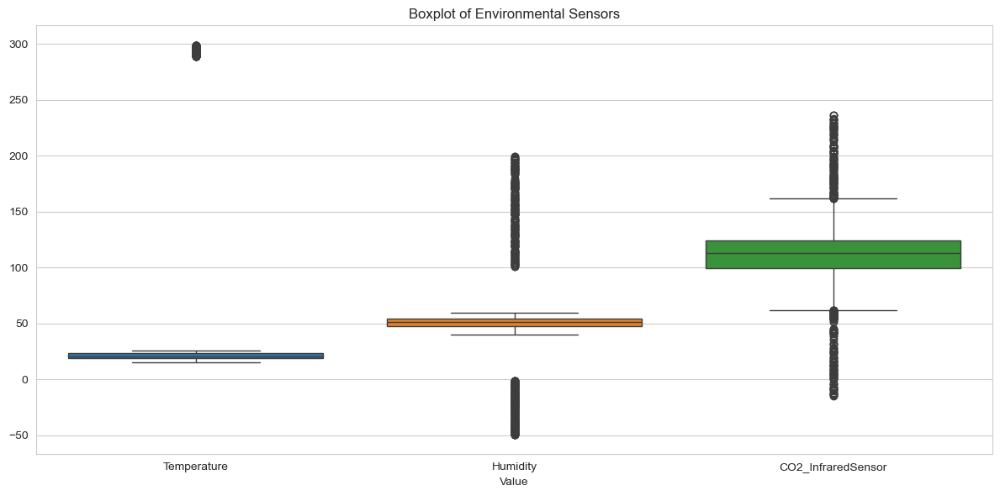

In [21]:
# boxplot the distribution of the problem data
fig, ax = plt.subplots(figsize=plot_size_fig)  

sns.boxplot(data=df[['Temperature','Humidity','CO2_InfraredSensor']], ax=ax)

ax.set_title('Boxplot of Environmental Sensors')
ax.set_xlabel('Value')

plt.tight_layout()
plt.show()

- **Box plot analysis shows that there are a bunch of temperature between 270 and 300. This could confirm our suspicion that it is due to conversion error from Kelvin to Celsius.**
- **For `Humidity`, those outliers that is less and 0 and above 100 are confirm sensor errors. We will set to `np.nan`.**
- **For `CO2_infraredSensor`, we will fixed those sensor error that return less than 0 by setting to `np.nan`.**


In [22]:
# List temperature between 250 and 400
df[(df['Temperature'] > 250) & (df['Temperature'] < 400)]


,Time of Day,Temperature,Humidity,CO2_InfraredSensor,CO2_ElectroChemicalSensor,MetalOxideSensor_Unit1,MetalOxideSensor_Unit2,MetalOxideSensor_Unit3,MetalOxideSensor_Unit4,CO_GasSensor,Session ID,HVAC Operation Mode,Ambient Light Level,Activity Level
8,afternoon,292.59,47.92,74.10,624.58,564.75,798.29,753.47,674.28,extremely low,7241,maintenance_mode,very_bright,Low Activity
23,morning,292.40,54.37,115.14,574.75,496.94,742.15,NaN,638.83,low,1826,ventilation_only,very_bright,Moderate Activity
37,afternoon,293.66,49.30,72.23,NaN,383.95,761.69,718.53,635.70,low,7241,eco_mode,very_bright,Moderate Activity
49,afternoon,293.59,51.07,92.64,619.54,421.56,749.11,704.69,628.91,low,7241,eco_mode,None,Low_Activity
64,evening,295.06,45.25,124.91,576.13,483.46,719.69,676.75,595.01,medium,2679,maintenance_mode,very_bright,Low Activity
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9963,afternoon,294.79,44.75,79.87,558.68,512.18,761.98,716.79,663.59,low,2586,eco_mode,very_bright,ModerateActivity
9967,afternoon,294.75,45.52,83.66,563.99,526.75,758.68,NaN,666.72,low,2586,cooling_active,bright,High Activity
9969,night,294.40,54.01,110.34,550.65,503.14,722.77,668.96,607.85,low,6817,cooling_active,bright,Low Activity
9976,night,294.14,57.61,136.81,561.46,446.62,703.95,663.04,578.16,low,4761,maintenance_mode,bright,Low Activity


**These 804 temperature could be due to conversion failure. We will convert to Celsius from Kevin.**

#### Data Quality Remediation

- **Convert 804 temperature data that range from 250 to 400 into Celsius.**
- **Set as NA for humidity that is below 0 and above 100.**
- **CO2 IR sensor that is below 0 will be set to NA.**
- **Please note that after remediation, we should investigate the CO2 IR sensor readings as it does not fall into a normal ppm range.**

### Data Structure Anomaly Analysis for Categorical Columns

In [23]:
categorical_columns

Index(['Time of Day', 'CO_GasSensor', 'HVAC Operation Mode',
       'Ambient Light Level', 'Activity Level'],
      dtype='object')

In [24]:
# check the unique values of the Time of Day column
df['Time of Day'].unique()

array(['morning', 'night', 'afternoon', 'evening'], dtype=object)

**We can use one-hot encoding as it is cyclical. We can also consider using sine/cosine, which could produce more accurate prediction, however, as we need to interpret and extract the important features, we will use one-hot encoded.**

In [25]:
# check the unique values of the CO_GasSensor column
df['CO_GasSensor'].unique()

array(['medium', 'low', 'extremely low', None, 'high', 'extremely high'],
      dtype=object)

**This can be ordinal. However, we need to set `None` as `np.nan`.**

In [26]:
# check the unique values of the HVAC Operation Mode column
df['HVAC Operation Mode'].unique()

array(['off', 'ventilation_only', 'eco_mode', 'Heating_active',
       'heating_active', 'maintenance_mode', 'cooling_active', 'Eco_Mode',
       'Cooling_Active', 'MAINTENANCE_MODE', 'Eco_mode', 'HEATING_ACTIVE',
       'COOLING_ACTIVE', 'VENTILATION_ONLY', 'Ventilation_Only',
       'Heating_Active', 'Off', 'ECO_MODE', 'Ventilation_only', 'OFF',
       'Maintenance_mode', 'Maintenance_Mode', 'Cooling_active'],
      dtype=object)

**There is obvious letter case issue. We will convert all to capitalized. After that we can use One-hot encoding.**

In [27]:
# check the unique values of the Ambient Light Level column
df['Ambient Light Level'].unique()

array(['very_dim', 'bright', None, 'very_bright', 'moderate', 'dim'],
      dtype=object)

**We could use ordinal encoding for this feature. However,we need to set `None` as `np.nan`.**

In [28]:
# check the unique values of the Activity Level column
df['Activity Level'].unique()

array(['Low Activity', 'High Activity', 'Moderate Activity',
       'ModerateActivity', 'Low_Activity', 'LowActivity'], dtype=object)

**There should be only 3 category, `Low Activity`, `High Activity` and `Moderate Activity`. The rest is spelling error.**

**We need to rename `ModerateActivity` to `Moderate Activity` and `Low_Activity` & `LowActivity` to `Low Activity`.**

In [29]:
target = config['target_column']
target

'Activity Level'

**This is the target. We will be using multi-class classification.**

### Data Anomaly Analysis for Temporal Columns

**No temporal columns, but identify some cyclical feature `Time of Day` that could be one-hot encoded.**

### Summary Action for Data Cleaning

- **Convert 804 temperature data that range from 250 to 400 into Celsius.**
- **For temperature we will set additional limit that will remove impossible temperature such as temperature lower than -30 degree and temperature above 60 degree. There is no such temperature for now, but we include it for future as guard rails.** 
- **Set as NA for humidity that is below 0 and above 100.**
- **CO2 sensor that is below 0 will be set to NA.**
- **Convert `HVAC Operation Mode` categories into lower case.**
- **Convert `None` to `np.nan` for `CO_GasSensor` and `Ambient Light Level`.**
- **We need to rename `ModerateActivity` to `Moderate Activity` and `Low_Activity` & `LowActivity` to `Low Activity`.**

**Please note that after remediation, we should investigate the CO2 IR sensor readings as it does not fall into a normal ppm range.**

## Data Cleaning For EDA

### Fixing Numerical Anomaly

In [30]:
def clean_sensor_df(df):
    """    Clean the sensor dataframe by applying the following transformations:
    1. Convert temperature from Kelvin to Celsius for values between 200 and 400.
    2. Set impossible temperature values to NaN (e.g., below -30°C or above 60°C).
    3. Set humidity values outside the range of 0-100 to NaN.
    4. Set CO₂ (Infrared Sensor) values less than or equal to 0 to NaN.

    Parameters:
    df (pd.DataFrame): The input DataFrame containing sensor data with columns 'Temperature',
                          'Humidity', and 'CO2_InfraredSensor'. 
    Returns:
    pd.DataFrame: The cleaned DataFrame with the same columns, but with the specified transformations applied.
    Raises:
    ValueError: If the DataFrame does not contain the required columns.
    TypeError: If the columns are not numeric.  
    """
    # Ensure the DataFrame has the expected columns
    required_columns = ['Temperature', 'Humidity', 'CO2_InfraredSensor']
    for col in required_columns:
        if col not in df.columns:
            raise ValueError(f"Missing required column: {col}")
    # Check if the columns are numeric
    for col in required_columns:
        if not pd.api.types.is_numeric_dtype(df[col]):
            raise TypeError(f"Column {col} must be numeric.")   

    # 1. Temperature: convert Kelvin-looking rows, then remove impossible ones
    kelvin_mask = df['Temperature'].between(200, 400)
    df.loc[kelvin_mask, 'Temperature'] = df.loc[kelvin_mask, 'Temperature'] - 273.15
    
    # 2. Set impossible temperature values to NaN
    # This is based on the assumption that temperature should be within a reasonable range for indoor environments
    # For example, we can set temperatures below -30°C or above 60°C to NaN
    df.loc[(df['Temperature'] < -30) | (df['Temperature'] > 60), 'Temperature'] = np.nan
    
    # 3. Humidity: keep 0-100, NA the rest
    df.loc[(df['Humidity'] < 0) | (df['Humidity'] > 100), 'Humidity'] = np.nan
    
    # 4. CO₂ (IR): NA negatives;
    # if sensor are indoors, we might expect higher CO₂ levels
    df.loc[df['CO2_InfraredSensor'] <= 0, 'CO2_InfraredSensor'] = np.nan
    
    return df

In [31]:
df = clean_sensor_df(df)

### Fixing Categorical Errors

In [32]:
def clean_categorical_features_df(df):
    """    Clean the categorical features in the DataFrame by applying the following transformations:
    1. Convert 'HVAC Operation Mode' to lower case.
    2. Convert 'None' to np.nan for 'CO_GasSensor' and 'Ambient Light Level'.
    Parameters:
    df (pd.DataFrame): The input DataFrame containing sensor data with columns 'HVAC Operation Mode',
                          'CO_GasSensor', and 'Ambient Light Level'.
    Returns:                        
    pd.DataFrame: The cleaned DataFrame with the specified transformations applied.
    Raises:
    ValueError: If the DataFrame does not contain the required columns.
    TypeError: If the columns are not of string type.
    """
    # Ensure the DataFrame has the expected columns
    required_columns = ['HVAC Operation Mode', 'CO_GasSensor', 'Ambient Light Level']
    for col in required_columns:
        if col not in df.columns:
            raise ValueError(f"Missing required column: {col}") 
    
    # Convert columns to string if they are not already
    for col in required_columns:
        if not pd.api.types.is_string_dtype(df[col]):
            try:
                df[col] = df[col].astype(str)
            except Exception as e:
                raise TypeError(f"Column {col} cannot be converted to string type: {e}")    
            
    # Check if the columns are of string type
    for col in required_columns:
        if not pd.api.types.is_string_dtype(df[col]):
            raise TypeError(f"Column {col} must be of string type.")

    # 1. Convert HVAC Operation Mode to lower case
    df['HVAC Operation Mode'] = df['HVAC Operation Mode'].str.lower()
    
    # 2. Convert None to np.nan for CO_GasSensor and Ambient Light Level
    df['CO_GasSensor'] = df['CO_GasSensor'].replace('None', np.nan)
    df['Ambient Light Level'] = df['Ambient Light Level'].replace('None', np.nan)

    # 3. Rename ModerateActivity to Moderate Activity and Low_Activity & LowActivity to Low Activity
    df['Activity Level'] = df['Activity Level'].replace('ModerateActivity', 'Moderate Activity')
    df['Activity Level'] = df['Activity Level'].replace('Low_Activity', 'Low Activity')
    df['Activity Level'] = df['Activity Level'].replace('LowActivity', 'Low Activity')
    
    return df

In [33]:
df = clean_categorical_features_df(df)

### Investigating CO2 IR Anomaly

**Checking with subject matter expert (ChatGPT), we confirm that the range of 0.1 to 236 is not normal as in outdoors, it should be 400ppm and above. For indoors it should be around 600 - 1200ppm.**

**Comparing against `CO2_ElectroChemicalSensor`, we find that the different is there although the standard deviation is quite similar. This lead us to believe that the `CO2_InfraredSensor` is due to conversion issue.**

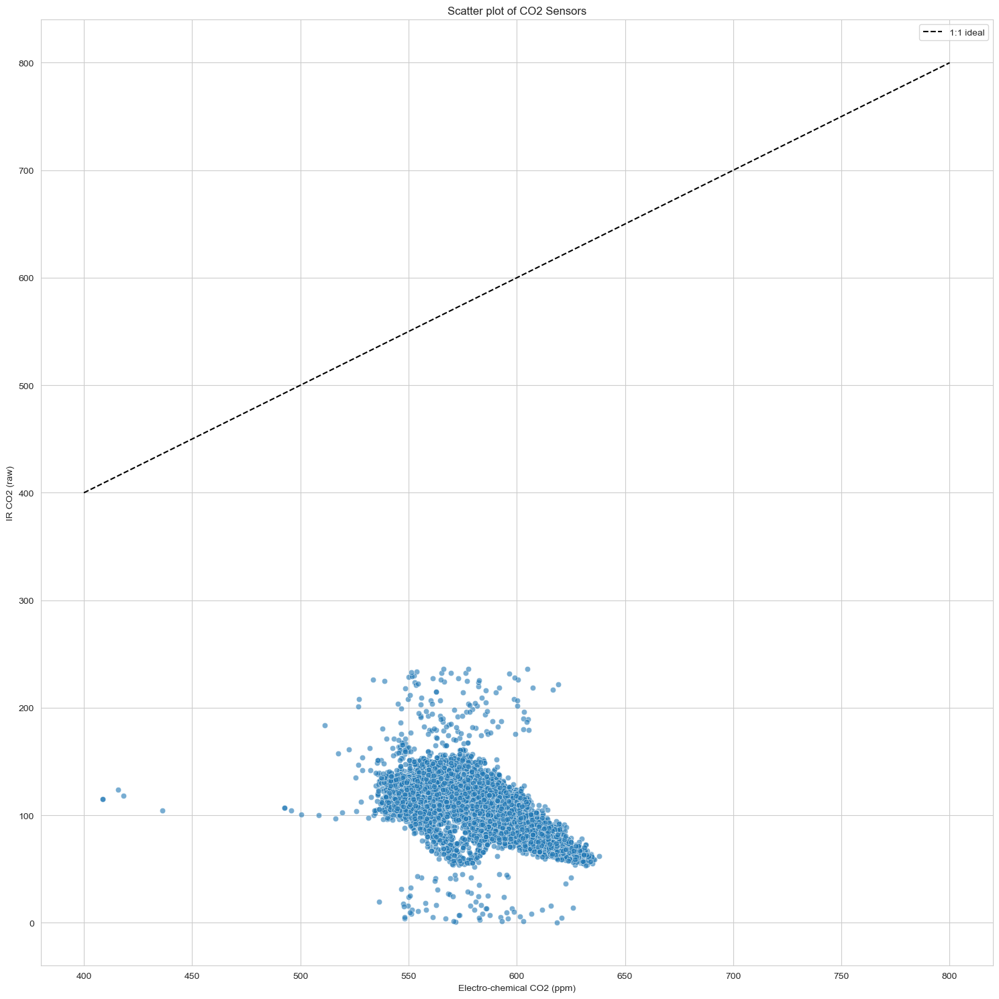

In [34]:
# boxplot the distribution of the problem data
fig, ax = plt.subplots(figsize=plot_size_heatmap)  

sns.scatterplot(data=df, x='CO2_ElectroChemicalSensor', y='CO2_InfraredSensor', alpha=0.6)
sns.lineplot(x=[400, 800], y=[400, 800], linestyle='--', color='k', label='1:1 ideal')

ax.set_xlabel('Electro-chemical CO2 (ppm)')
ax.set_ylabel('IR CO2 (raw)')
ax.set_title('Scatter plot of CO2 Sensors')

plt.tight_layout()
plt.show()

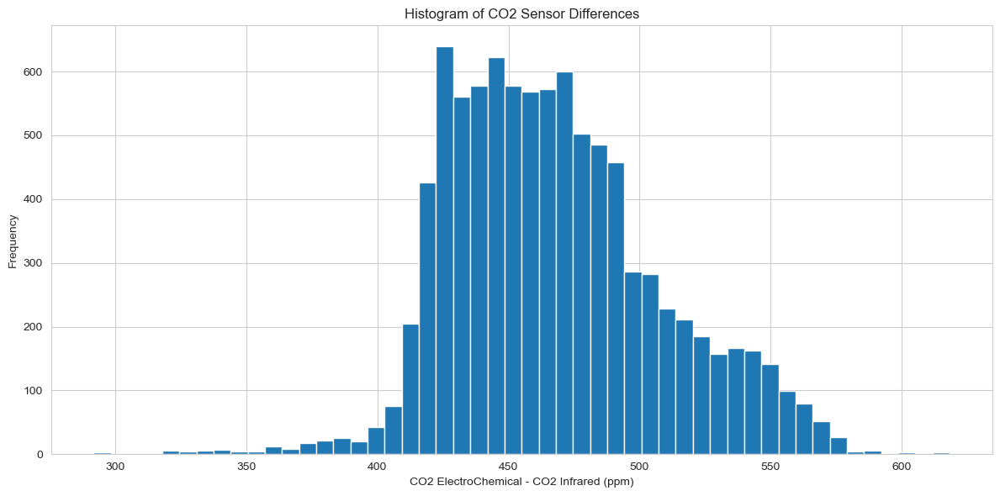

In [35]:
co2_diff = df['CO2_ElectroChemicalSensor'] - df['CO2_InfraredSensor']

# boxplot the distribution of the problem data
fig, ax = plt.subplots(figsize=plot_size_fig)  

co2_diff.hist(bins=50)

plt.xlabel('CO2 ElectroChemical - CO2 Infrared (ppm)')
plt.ylabel('Frequency')
plt.title('Histogram of CO2 Sensor Differences')

plt.tight_layout()
plt.show()

In [36]:
summary = (df
           .groupby('Session ID')[['CO2_ElectroChemicalSensor','CO2_InfraredSensor']]
           .agg(['mean','std','min','max']))
display(summary.head())

CO2_ElectroChemicalSensor                             \
                                mean        std     min     max   
Session ID                                                        
1374                      595.100572  11.374621  575.17  629.26   
1458                      546.012171   5.201693  531.97  557.43   
1482                      613.778158  12.555788  584.63  635.94   
1826                      582.177047  11.002132  558.43  610.50   
1903                      565.933668   9.719878  549.86  593.68   

           CO2_InfraredSensor                            
                         mean        std    min     max  
Session ID                                               
1374               110.191882  23.564583   7.36  236.01  
1458               116.925280  24.411410   9.35  229.30  
1482                87.644691  26.055844  53.23  222.03  
1826               108.396763  21.853406   7.42  209.14  
1903               116.919541  25.060867   4.20  203.56

**Base on the first charts above, we notice that the distribution of IR CO2 is between 0 and 236. The second chart tell us that CO2 IR is consistently lower than CO2 EC. But the distribution is not erratic or abnormal. This confirm our suspicion that it could be due to the sensor failed to convert to ppm and it is still in binary format (0 - 255). The mean of CO2 IR is also consistently lower based on the table.**

**Based on the assumption above, we have strong reason to believe that the data we have for CO2 IR is in raw binary format. For some reason, the sensor failed to convert into ppm.**

**To remediate this problem, we need to confirm the correlation first.**

In [37]:
CO2_df = df[['CO2_ElectroChemicalSensor', 'CO2_InfraredSensor']].copy()
CO2_df.corr()

,CO2_ElectroChemicalSensor,CO2_InfraredSensor
CO2_ElectroChemicalSensor,1.000000,-0.468668
CO2_InfraredSensor,-0.468668,1.000000


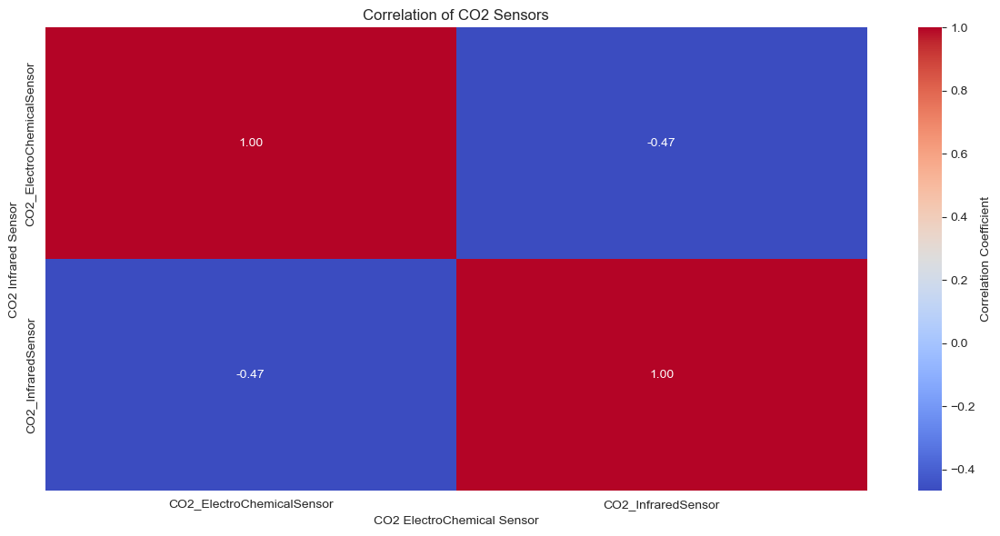

In [38]:
# boxplot the correlation of CO2 sensors
fig, ax = plt.subplots(figsize=plot_size_fig)  

sns.heatmap(
    CO2_df.corr(), annot=True, fmt='.2f', cmap='coolwarm', ax=ax,
    cbar_kws={'label': 'Correlation Coefficient'}
)

plt.xlabel('CO2 ElectroChemical Sensor')
plt.ylabel('CO2 Infrared Sensor')
plt.title('Correlation of CO2 Sensors')

plt.tight_layout()
plt.show()

**We confirm that both sensors are negatively correlated. To remediate the problem of anomaly of CO2 IR sensor, we perform a small linear regression prediction using `CO2_InfraredSensor` and `CO2_ElectroChemicalSensor`. We will use CO2 EC to predict CO2 IR. A new column called `CO2_IR_calibrated` will be created.**

In [39]:
def Rescale_CO2_IR(df: pd.DataFrame) -> pd.DataFrame:
        """    Rescale the CO2 Infrared Sensor values to match the CO2 ElectroChemical Sensor values.
        This function uses linear regression to find the best fit line between the two sensors.
        
        Parameters:
        df (pd.DataFrame): The input DataFrame containing CO2 sensor data with columns 'CO2_InfraredSensor' and 'CO2_ElectroChemicalSensor'.
        
        Returns:
        pd.DataFrame: The DataFrame with an additional column 'CO2_IR_calibrated' containing the calibrated CO2 Infrared Sensor values.
        """
        from sklearn.linear_model import LinearRegression
        
        # use only rows that have both sensors
        mask = df[['CO2_InfraredSensor', 'CO2_ElectroChemicalSensor']].notna().all(axis=1)

        X = df.loc[mask, ['CO2_InfraredSensor']].values          # shape (n_samples, 1)
        y = df.loc[mask, 'CO2_ElectroChemicalSensor'].to_numpy() # shape (n_samples,)

        lr = LinearRegression().fit(X, y)
        a, b = lr.coef_[0], lr.intercept_

        print(f"ppm = {lr.coef_[0]:.2f} * IR_raw + {lr.intercept_:.1f}")
        df['CO2_IR_calibrated'] = a * df['CO2_InfraredSensor'] + b

        return df

In [40]:
df = Rescale_CO2_IR(df)
df.head()

ppm = -0.43 * IR_raw + 626.3


,Time of Day,Temperature,Humidity,CO2_InfraredSensor,CO2_ElectroChemicalSensor,MetalOxideSensor_Unit1,MetalOxideSensor_Unit2,MetalOxideSensor_Unit3,MetalOxideSensor_Unit4,CO_GasSensor,Session ID,HVAC Operation Mode,Ambient Light Level,Activity Level,CO2_IR_calibrated
0,morning,19.63,53.83,125.49,571.09,478.55,735.85,497.59,565.05,medium,7241,off,very_dim,Low Activity,571.991004
1,morning,19.66,53.69,126.34,575.79,491.96,740.28,NaN,557.08,low,7241,ventilation_only,bright,Low Activity,571.623266
2,night,20.95,54.12,119.34,556.53,437.50,718.34,NaN,612.62,medium,9385,off,NaN,Low Activity,574.651694
3,morning,20.10,50.48,113.50,NaN,515.14,744.02,676.15,600.22,low,7241,eco_mode,very_bright,High Activity,577.178269
4,morning,19.89,48.42,92.77,613.65,535.66,770.27,720.27,625.73,low,7241,heating_active,moderate,Low Activity,586.146743


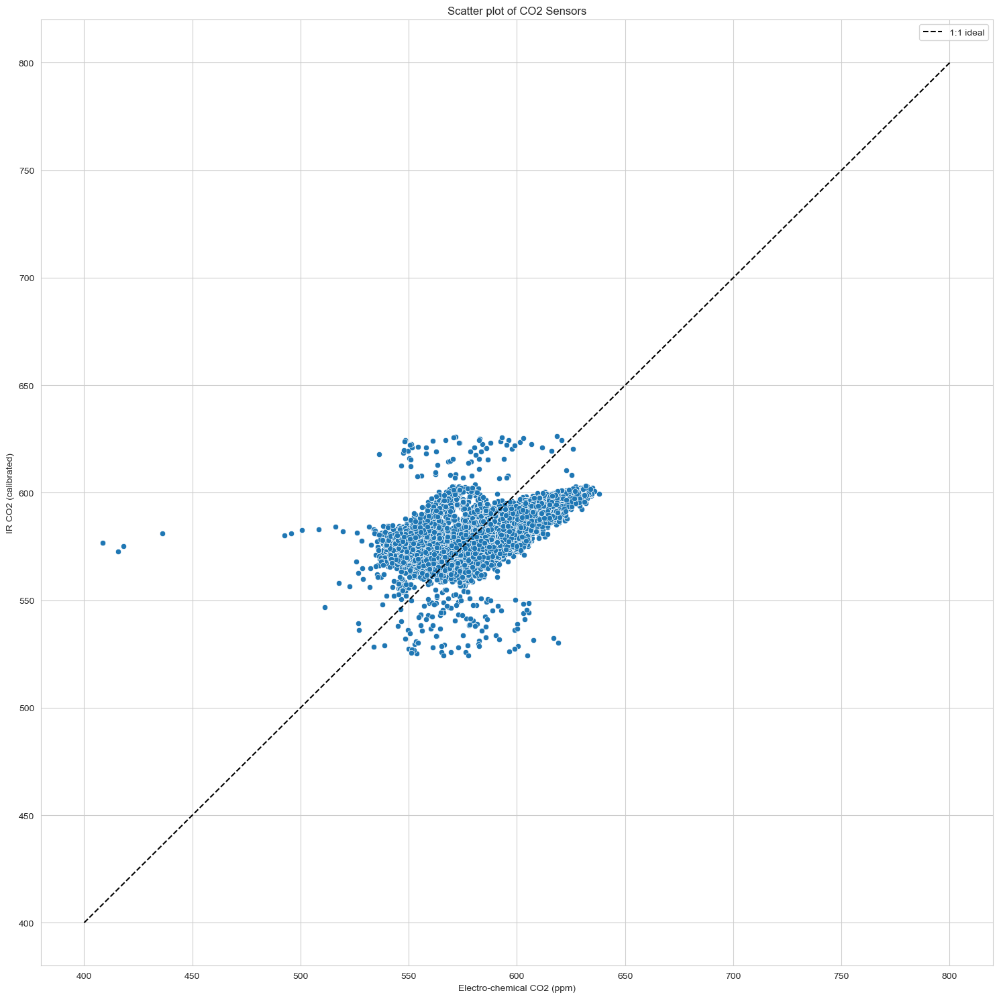

In [41]:
# boxplot the distribution of the CO2 sensor data
fig, ax = plt.subplots(figsize=plot_size_heatmap)  

sns.scatterplot(data=df, x='CO2_ElectroChemicalSensor', y='CO2_IR_calibrated')
sns.lineplot(x=[400, 800], y=[400, 800], linestyle='--', color='k', label='1:1 ideal')

ax.set_xlabel('Electro-chemical CO2 (ppm)')
ax.set_ylabel('IR CO2 (calibrated)')
ax.set_title('Scatter plot of CO2 Sensors')

plt.tight_layout()
plt.show()

In [42]:
# get numerical columns names
numerical_columns = df.select_dtypes(include=['number']).columns
numerical_columns

Index(['Temperature', 'Humidity', 'CO2_InfraredSensor',
       'CO2_ElectroChemicalSensor', 'MetalOxideSensor_Unit1',
       'MetalOxideSensor_Unit2', 'MetalOxideSensor_Unit3',
       'MetalOxideSensor_Unit4', 'Session ID', 'CO2_IR_calibrated'],
      dtype='object')

In [43]:
# get categorical columns names
categorical_columns = df.select_dtypes(include=['object']).columns
categorical_columns

Index(['Time of Day', 'CO_GasSensor', 'HVAC Operation Mode',
       'Ambient Light Level', 'Activity Level'],
      dtype='object')

In [44]:
# get temporal columns names
temporal_columns = df.select_dtypes(include=['datetime64[ns]']).columns
temporal_columns

Index([], dtype='object')

## Missing Value Analysis 

In [45]:
# check if there are any missing values in the dataset
df.isnull().sum()

Time of Day                     0
Temperature                     0
Humidity                      503
CO2_InfraredSensor             22
CO2_ElectroChemicalSensor     705
MetalOxideSensor_Unit1          0
MetalOxideSensor_Unit2          0
MetalOxideSensor_Unit3       2554
MetalOxideSensor_Unit4          0
CO_GasSensor                 1365
Session ID                      0
HVAC Operation Mode             0
Ambient Light Level          2519
Activity Level                  0
CO2_IR_calibrated              22
dtype: int64

**We have more missing data as we have set `Humidity` to `np.nan` if it is below 0 and above 100. We also set CO2 IR for those sensor below 0 as NA. The same will applies to the calibrated CO2 IR sensor.** 

In [46]:
missing_percentage = (df.isnull().sum() / len(df) * 100).sort_values(ascending=False)
display(missing_percentage)

MetalOxideSensor_Unit3       25.850202
Ambient Light Level          25.495951
CO_GasSensor                 13.815789
CO2_ElectroChemicalSensor     7.135628
Humidity                      5.091093
CO2_IR_calibrated             0.222672
CO2_InfraredSensor            0.222672
MetalOxideSensor_Unit2        0.000000
MetalOxideSensor_Unit1        0.000000
Time of Day                   0.000000
Temperature                   0.000000
Session ID                    0.000000
MetalOxideSensor_Unit4        0.000000
HVAC Operation Mode           0.000000
Activity Level                0.000000
dtype: float64

**`MetalOxideSensor_Unit3` and `Ambient Light Level` has the most missing data (approx. 25%). This is followed by `CO_GasSensor` with has 13% missing data.**

In [47]:
columns_with_missing_values = df.columns[df.isnull().any()].tolist()
print(f'The columns with missing values are: {columns_with_missing_values}')

The columns with missing values are: ['Humidity', 'CO2_InfraredSensor', 'CO2_ElectroChemicalSensor', 'MetalOxideSensor_Unit3', 'CO_GasSensor', 'Ambient Light Level', 'CO2_IR_calibrated']


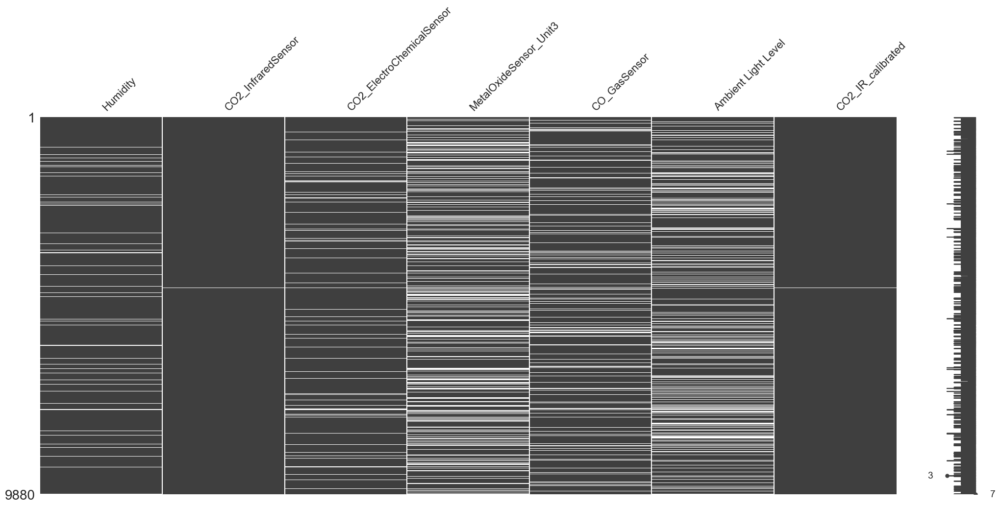

In [48]:
msno.matrix(df[columns_with_missing_values])
plt.show()

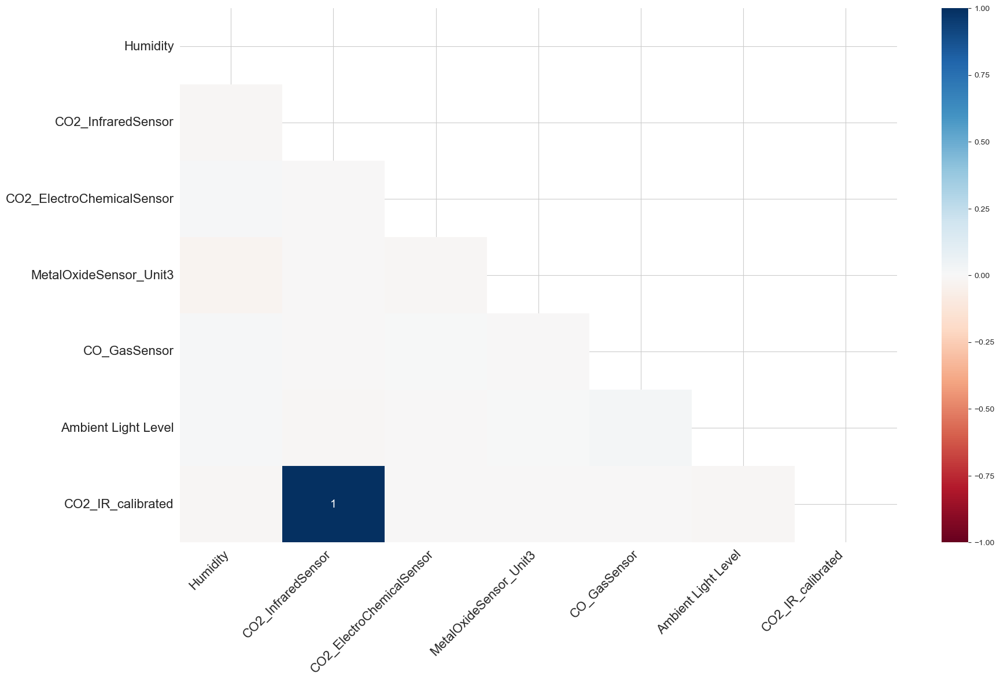

In [49]:
msno.heatmap(df[columns_with_missing_values])
plt.show()

In [50]:
# Step 1: Correlation of missing flags
missing_flags = df[columns_with_missing_values].isnull().astype(int)
corr_matrix = missing_flags.corr()
corr_matrix

,Humidity,CO2_InfraredSensor,CO2_ElectroChemicalSensor,MetalOxideSensor_Unit3,CO_GasSensor,Ambient Light Level,CO2_IR_calibrated
Humidity,1.000000,-0.010941,0.009136,-0.024217,0.012685,0.013476,-0.010941
CO2_InfraredSensor,-0.010941,1.000000,-0.004753,-0.003370,-0.006469,-0.007928,1.000000
CO2_ElectroChemicalSensor,0.009136,-0.004753,1.000000,-0.008302,0.001822,-0.000673,-0.004753
MetalOxideSensor_Unit3,-0.024217,-0.003370,-0.008302,1.000000,-0.007273,0.000442,-0.003370
CO_GasSensor,0.012685,-0.006469,0.001822,-0.007273,1.000000,0.022869,-0.006469
Ambient Light Level,0.013476,-0.007928,-0.000673,0.000442,0.022869,1.000000,-0.007928
CO2_IR_calibrated,-0.010941,1.000000,-0.004753,-0.003370,-0.006469,-0.007928,1.000000


**All the features are not correlated with each other except with `CO2_InfraredSensor` and `CO2_IR_calibrated`.**

In [51]:
missing_df = df[columns_with_missing_values + [target]].copy()
missing_df.head()

,Humidity,CO2_InfraredSensor,CO2_ElectroChemicalSensor,MetalOxideSensor_Unit3,CO_GasSensor,Ambient Light Level,CO2_IR_calibrated,Activity Level
0,53.83,125.49,571.09,497.59,medium,very_dim,571.991004,Low Activity
1,53.69,126.34,575.79,NaN,low,bright,571.623266,Low Activity
2,54.12,119.34,556.53,NaN,medium,NaN,574.651694,Low Activity
3,50.48,113.50,NaN,676.15,low,very_bright,577.178269,High Activity
4,48.42,92.77,613.65,720.27,low,moderate,586.146743,Low Activity


In [52]:
# ---------- helper ----------------------------------------------------------
def cramers_v(confusion: pd.DataFrame) -> float:
    """Cramér's V for contingency tables of any shape."""
    chi2, *_ = chi2_contingency(confusion, correction=False)
    n = confusion.values.sum()
    r, k = confusion.shape               # rows, columns
    return np.sqrt(chi2 / (n * (min(r, k) - 1)))



Analyzing missingness for Humidity ...


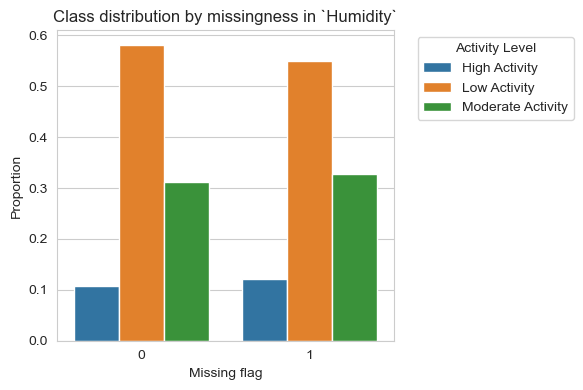

Activity Level,High Activity,Low Activity,Moderate Activity
Humidity_missing_flag,,,
0,1015,5445,2917
1,61,277,165


χ² test: chi2 = 1.925, dof = 2, p = 0.3820
Cramér’s V = 0.014
→ No evidence of association (p ≥ 0.05); missingness looks MCAR w.r.t. the target.
------------------------------------------------------------

Analyzing missingness for CO2_InfraredSensor ...
⚠️  Some cells have <5 observations; χ² approximation may be inaccurate.
    • Consider collapsing rare classes or using Fisher’s exact test.


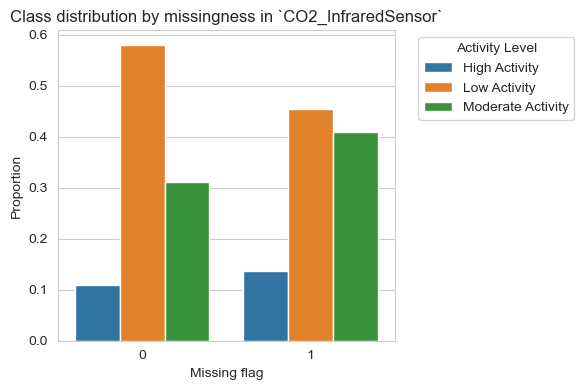

Activity Level,High Activity,Low Activity,Moderate Activity
CO2_InfraredSensor_missing_flag,,,
0,1073,5712,3073
1,3,10,9


χ² test: chi2 = 1.411, dof = 2, p = 0.4939
Cramér’s V = 0.012
→ No evidence of association (p ≥ 0.05); missingness looks MCAR w.r.t. the target.
------------------------------------------------------------

Analyzing missingness for CO2_ElectroChemicalSensor ...


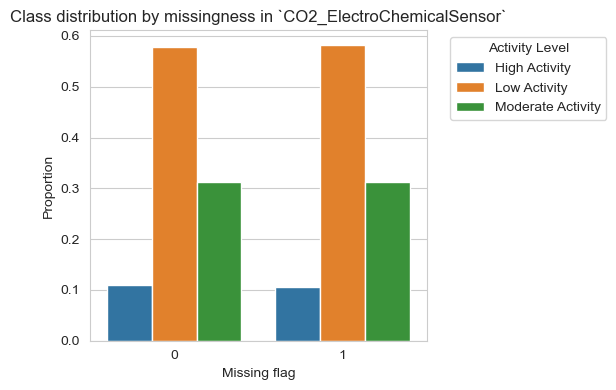

Activity Level,High Activity,Low Activity,Moderate Activity
CO2_ElectroChemicalSensor_missing_flag,,,
0,1001,5312,2862
1,75,410,220


χ² test: chi2 = 0.052, dof = 2, p = 0.9743
Cramér’s V = 0.002
→ No evidence of association (p ≥ 0.05); missingness looks MCAR w.r.t. the target.
------------------------------------------------------------

Analyzing missingness for MetalOxideSensor_Unit3 ...


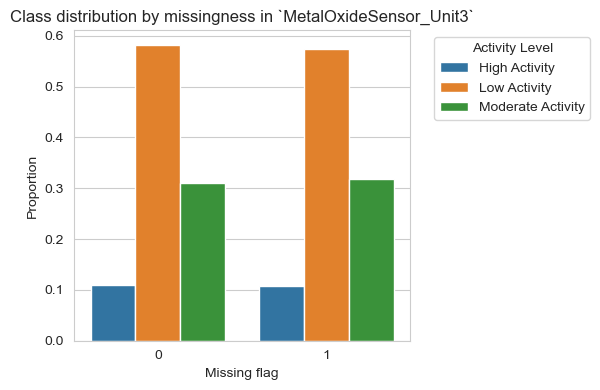

Activity Level,High Activity,Low Activity,Moderate Activity
MetalOxideSensor_Unit3_missing_flag,,,
0,800,4258,2268
1,276,1464,814


χ² test: chi2 = 0.738, dof = 2, p = 0.6914
Cramér’s V = 0.009
→ No evidence of association (p ≥ 0.05); missingness looks MCAR w.r.t. the target.
------------------------------------------------------------

Analyzing missingness for CO_GasSensor ...


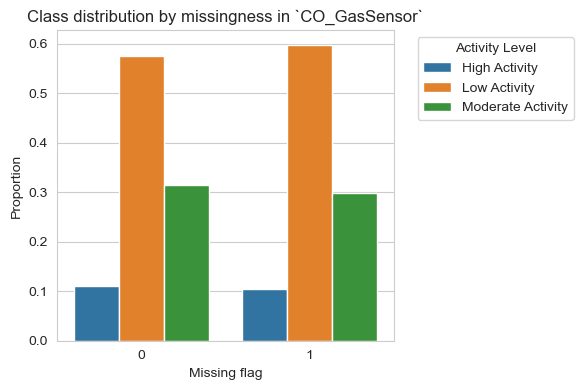

Activity Level,High Activity,Low Activity,Moderate Activity
CO_GasSensor_missing_flag,,,
0,934,4907,2674
1,142,815,408


χ² test: chi2 = 2.088, dof = 2, p = 0.3521
Cramér’s V = 0.015
→ No evidence of association (p ≥ 0.05); missingness looks MCAR w.r.t. the target.
------------------------------------------------------------

Analyzing missingness for Ambient Light Level ...


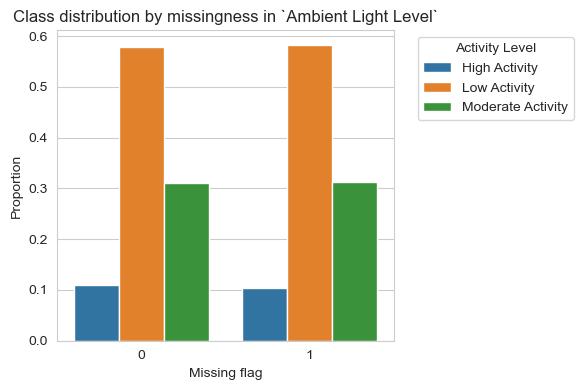

Activity Level,High Activity,Low Activity,Moderate Activity
Ambient Light Level_missing_flag,,,
0,812,4256,2293
1,264,1466,789


χ² test: chi2 = 0.587, dof = 2, p = 0.7456
Cramér’s V = 0.008
→ No evidence of association (p ≥ 0.05); missingness looks MCAR w.r.t. the target.
------------------------------------------------------------

Analyzing missingness for CO2_IR_calibrated ...
⚠️  Some cells have <5 observations; χ² approximation may be inaccurate.
    • Consider collapsing rare classes or using Fisher’s exact test.


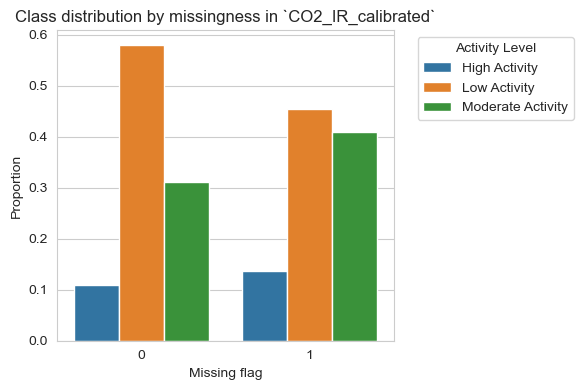

Activity Level,High Activity,Low Activity,Moderate Activity
CO2_IR_calibrated_missing_flag,,,
0,1073,5712,3073
1,3,10,9


χ² test: chi2 = 1.411, dof = 2, p = 0.4939
Cramér’s V = 0.012
→ No evidence of association (p ≥ 0.05); missingness looks MCAR w.r.t. the target.
------------------------------------------------------------


In [53]:
# ---------- loop ------------------------------------------------------------
alpha = 0.05                             # significance threshold

for each_col in columns_with_missing_values:
    missing_flag = each_col + '_missing_flag'
    missing_df[missing_flag] = missing_df[each_col].isna().astype(int)

    print(f"\nAnalyzing missingness for {each_col} ...")

    # 1) build 2 × K contingency table
    contingency = pd.crosstab(
        missing_df[missing_flag],
        missing_df[target],              # target is categorical / multi-class
        dropna=False                     # keep all classes
    )

    # warn if any expected count < 5 (χ² assumptions)
    if (contingency.apply(pd.to_numeric, errors='coerce') < 5).any().any():
        print("⚠️  Some cells have <5 observations; "
              "χ² approximation may be inaccurate.\n"
              "    • Consider collapsing rare classes or using Fisher’s exact test.")

    # 2) χ² test & effect size
    chi2, p_value, dof, expected = chi2_contingency(contingency, correction=False)
    v = cramers_v(contingency)

    # 3) visual: class proportion bar-plot
    prop_df = (contingency
               .div(contingency.sum(axis=1), axis=0)       # row-wise %
               .stack()                                     # tidy
               .rename('prop') # type: ignore
               .reset_index())

    plt.figure(figsize=(6, 4))
    sns.barplot(data=prop_df,
                x=missing_flag, y='prop', hue=target)
    plt.title(f'Class distribution by missingness in `{each_col}`')
    plt.ylabel('Proportion')
    plt.xlabel('Missing flag')
    plt.legend(title=target, bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()

    # 4) report
    display(contingency)

    print(f"χ² test: chi2 = {chi2:.3f}, dof = {dof}, p = {p_value:.4f}")
    print(f"Cramér’s V = {v:.3f}")

    if p_value < alpha: # type: ignore
        print(f"→ Missingness in `{each_col}` is **significantly associated** with `{target}` "
              f"(p < {alpha}).")
        strength = ("weak" if v < 0.1 else
                    "moderate" if v < 0.3 else
                    "strong")
        print(f"   Association strength: {strength} (V = {v:.3f}).")
        print("   Likely MAR or MNAR - keep the flag and/or use models that exploit it.")
    else:
        print(f"→ No evidence of association (p ≥ {alpha}); missingness looks MCAR w.r.t. the target.")

    print("-" * 60)

In [54]:
alpha = 0.05          # significance level

for each_col in columns_with_missing_values:
    miss_flag = each_col + '_missing_flag'
    missing_df[miss_flag] = missing_df[each_col].isna().astype(int)

    # 2 x K table
    table = pd.crosstab(missing_df[miss_flag], missing_df[target])
    k = table.shape[1]                         # number of classes

    if k == 2:                                # ------- binary target -------
        odds, p_value = st.fisher_exact(table.values)   # exact
        test_name = "Fisher exact (2x2)"
    else:                                     # ------- multi-class ----------
        res = st.chi2_contingency(
            table.values, correction=False,
            method=MonteCarloMethod(n_resamples=10_000)
        )
        p_value = res.pvalue # type: ignore - simulated exact p-value
        test_name = "Monte-Carlo Chi-Square (2xK)"

    # effect-size
    v = cramers_v(table)                      # as in previous reply

    print(f"{test_name}: p = {p_value:.4f}, V = {v:.3f}")
    if float(p_value) < alpha: # type: ignore
        print(f"→ Missingness in `{each_col}` IS associated with `{target}`.")
    else:
        print(f"→ No evidence of association (likely MCAR w.r.t. target).")
    print("-"*60)


Monte-Carlo Chi-Square (2xK): p = 0.3773, V = 0.014
→ No evidence of association (likely MCAR w.r.t. target).
------------------------------------------------------------
Monte-Carlo Chi-Square (2xK): p = 0.4851, V = 0.012
→ No evidence of association (likely MCAR w.r.t. target).
------------------------------------------------------------
Monte-Carlo Chi-Square (2xK): p = 0.9752, V = 0.002
→ No evidence of association (likely MCAR w.r.t. target).
------------------------------------------------------------
Monte-Carlo Chi-Square (2xK): p = 0.6913, V = 0.009
→ No evidence of association (likely MCAR w.r.t. target).
------------------------------------------------------------
Monte-Carlo Chi-Square (2xK): p = 0.3529, V = 0.015
→ No evidence of association (likely MCAR w.r.t. target).
------------------------------------------------------------
Monte-Carlo Chi-Square (2xK): p = 0.7510, V = 0.008
→ No evidence of association (likely MCAR w.r.t. target).
-----------------------------------

**The statistics above confirm that our missing values are MCAR.**

### Imputation Strategy

In [55]:
display(missing_percentage)

MetalOxideSensor_Unit3       25.850202
Ambient Light Level          25.495951
CO_GasSensor                 13.815789
CO2_ElectroChemicalSensor     7.135628
Humidity                      5.091093
CO2_IR_calibrated             0.222672
CO2_InfraredSensor            0.222672
MetalOxideSensor_Unit2        0.000000
MetalOxideSensor_Unit1        0.000000
Time of Day                   0.000000
Temperature                   0.000000
Session ID                    0.000000
MetalOxideSensor_Unit4        0.000000
HVAC Operation Mode           0.000000
Activity Level                0.000000
dtype: float64

In [56]:
df[columns_with_missing_values].describe()

,Humidity,CO2_InfraredSensor,CO2_ElectroChemicalSensor,MetalOxideSensor_Unit3,CO2_IR_calibrated
count,9377.000000,9858.000000,9175.000000,7326.000000,9858.000000
mean,50.885339,110.601223,578.367964,681.471289,578.432374
std,3.952886,24.515598,22.669115,60.242382,10.606247
min,39.610000,0.100000,408.600000,457.810000,524.176447
25%,47.920000,99.292500,559.280000,658.400000,572.615076
50%,51.320000,113.115000,578.930000,680.190000,577.344832
75%,53.720000,124.047500,595.260000,704.495000,583.324897
max,59.770000,236.010000,637.900000,905.150000,626.238807


- **`CO2_InfraredSensor` and `CO2_IR_calibrated` has less 1% of missing data. We can use mean imputation.**
- **`CO2_ElectroChemicalSensor` and `Humidity` each has 7% and 5% of missing data respectively. The safer bet is the use median imputation, although the difference between mean and median is not that great.**

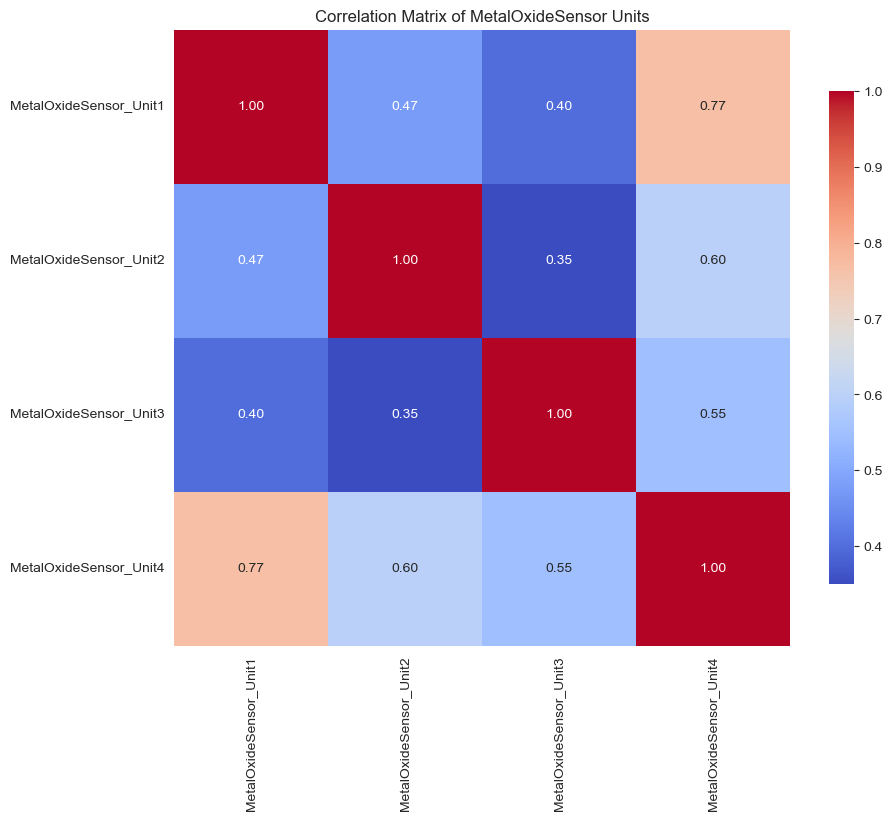

In [57]:
metal_oxide_sensors = ['MetalOxideSensor_Unit1', 'MetalOxideSensor_Unit2', 'MetalOxideSensor_Unit3', 'MetalOxideSensor_Unit4']
# Check correlation between MetalOxideSensor columns
correlation_matrix = df[metal_oxide_sensors].corr()
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', square=True, cbar_kws={"shrink": .8})
plt.title('Correlation Matrix of MetalOxideSensor Units')
plt.show()  

In [58]:
display(correlation_matrix)

,MetalOxideSensor_Unit1,MetalOxideSensor_Unit2,MetalOxideSensor_Unit3,MetalOxideSensor_Unit4
MetalOxideSensor_Unit1,1.000000,0.474402,0.398420,0.768272
MetalOxideSensor_Unit2,0.474402,1.000000,0.349591,0.598118
MetalOxideSensor_Unit3,0.398420,0.349591,1.000000,0.545612
MetalOxideSensor_Unit4,0.768272,0.598118,0.545612,1.000000


| Pair            | ρ (Pearson) | Interpretation              |
| --------------- | ----------- | --------------------------- |
| Unit 3 ↔ Unit 4 | **0.55**    | Moderate–strong linear link |
| Unit 3 ↔ Unit 1 | 0.40        | Moderate link               |
| Unit 3 ↔ Unit 2 | 0.35        | Weak–moderate link          |


**The correlation chart above shows that all the metal oxide sensor are correlated moderately. The rules of thumb is that if the correlation is 0.30 and above, it usually carries useful predictive signal for regression-style imputers. Multiple moderately correlated predictors often outperform a single strong one.**

**The conclusion is that we can use regressor to fill sensor 3 and it may contain information that is between than mean or median.**


In [59]:
df['Ambient Light Level'].value_counts()

Ambient Light Level
very_bright    2815
bright         2160
moderate       1245
dim             715
very_dim        426
Name: count, dtype: int64

In [60]:
df['CO_GasSensor'].value_counts()

CO_GasSensor
low               4292
medium            2661
extremely low     1096
high               395
extremely high      71
Name: count, dtype: int64

There are few strategies:

- **Convert NA as a `missing` group. For ordinal categories, it can be place the the top or bottom of the group. Tree-based model can capture it. However, we need to convert to one-hot encoding if we were to use linear model.**
- **The second strategy is to ignore the missing group but add a missing flag column. This is to avoid the assumption of `missing` as the highest or lowest strength**
- **The third strategy is to impute with the most frequent group.**

**For now, we will adopt the first strategy where we use `missing` as a group in the ordinal hierarchy. We will add a missing flag since we do not have many columns. If we discover a strong monotonic strength in either `CO_GasSensor` or `Ambient Light Level`, we may adopt the second strategy.**

| Features | Imputation Strategy | Explanation |
| --- | --- | --- |
| `CO2_InfraredSensor` | Mean | Missing data less than 1% | 
| `CO2_IR_calibrated` | Mean | Missing data less than 1% |
| `Humidity` | Median | Missing data less than 10%, missing flag added |
| `CO2_ElectroChemicalSensor` | Median | Missing data less than 10%, missing flag added |
| `MetalOxideSensor_Unit3` | Iterative Imputer (RF Regressor) | MetalOxideSensor are highly correlated with each other, see above. Missing flag added. |
| `CO_GasSensor` | Convert NAN to `missing` | `missing` as part of ordinal group. Use OH for linear model. Add missing flag. |
| `Ambient Light Level` | Convert NAN to `missing` | `missing` as part of ordinal group. Use OH for linear model. Add missing flag.|

In [61]:
# ------------------------------------------------------------------
# 0.  Make a working copy (keep the raw data untouched)
# ------------------------------------------------------------------
df_raw = df.copy()

# ------------------------------------------------------------------
# 1.  Simple numeric imputations
# ------------------------------------------------------------------
mean_cols   = ["CO2_InfraredSensor", "CO2_IR_calibrated"]          # ≈0 % missing
median_cols = ["Humidity", "CO2_ElectroChemicalSensor"]            # 5–7 % missing

for c in mean_cols:
    df[c] = df[c].fillna(df[c].mean())

for c in median_cols:
    df[c] = df[c].fillna(df[c].median())

# Optional: add missing-value flags (cheap insurance)
for c in median_cols:
    df[c + "_missing_flag"] = df_raw[c].isna().astype(int)

# ------------------------------------------------------------------
# 2.  Model-based imputation for MetalOxideSensor_Unit3 (≈26 % NaN)
# ------------------------------------------------------------------
from sklearn.experimental import enable_iterative_imputer  # noqa
from sklearn.impute import IterativeImputer
from sklearn.ensemble import RandomForestRegressor

mox_units = ["MetalOxideSensor_Unit1", "MetalOxideSensor_Unit2",
             "MetalOxideSensor_Unit3", "MetalOxideSensor_Unit4"]

it_imp = IterativeImputer(
    estimator=RandomForestRegressor(
        n_estimators=100, max_depth=10, random_state=42, n_jobs=-1
    ),
    max_iter=10,
    random_state=42,
    initial_strategy="median"
)

df[mox_units] = it_imp.fit_transform(df[mox_units])

# Flag for diagnostics (optional)
df["MetalOxideSensor_Unit3_missing_flag"] = df_raw["MetalOxideSensor_Unit3"].isna().astype(int)

# ------------------------------------------------------------------
# 3.  Ordered categorical columns
# ------------------------------------------------------------------
ordered_maps = {
    "CO_GasSensor": [
        "extremely low", "low", "medium", "high", "extremely high", "missing"
    ],
    "Ambient Light Level": [
        "very_dim", "dim", "moderate", "bright", "very_bright", "missing"
    ]
}

for col, cats in ordered_maps.items():
    # fill NaN with explicit 'missing' label
    df[col] = (df[col]
               .fillna("missing")
               .astype(pd.CategoricalDtype(categories=cats, ordered=True)))
    
# Optional: add missing-value flags (cheap insurance)
for col in ordered_maps.keys():
    df[col + "_missing_flag"] = df_raw[col].isna().astype(int)


# ------------------------------------------------------------------
# 4.  Nominal categorical (no missing values)
# ------------------------------------------------------------------
nominal_cols = ["Time of Day", "HVAC Operation Mode", "Activity Level"]
df[nominal_cols] = df[nominal_cols].astype("category")

# ------------------------------------------------------------------
# 5.  Session ID (identifier) – leave as is or cast to string
# ------------------------------------------------------------------
df["Session ID"] = df["Session ID"].astype("category")   # optional

# ------------------------------------------------------------------
# 6.  Done – df is ready for feature analysis
# ------------------------------------------------------------------
print(df.isna().sum().sort_values(ascending=False).head())

Time of Day                  0
Temperature                  0
Humidity                     0
CO2_InfraredSensor           0
CO2_ElectroChemicalSensor    0
dtype: int64


In [62]:
df.isnull().sum()

Time of Day                               0
Temperature                               0
Humidity                                  0
CO2_InfraredSensor                        0
CO2_ElectroChemicalSensor                 0
MetalOxideSensor_Unit1                    0
MetalOxideSensor_Unit2                    0
MetalOxideSensor_Unit3                    0
MetalOxideSensor_Unit4                    0
CO_GasSensor                              0
Session ID                                0
HVAC Operation Mode                       0
Ambient Light Level                       0
Activity Level                            0
CO2_IR_calibrated                         0
Humidity_missing_flag                     0
CO2_ElectroChemicalSensor_missing_flag    0
MetalOxideSensor_Unit3_missing_flag       0
CO_GasSensor_missing_flag                 0
Ambient Light Level_missing_flag          0
dtype: int64

In [63]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 9880 entries, 0 to 9999
Data columns (total 20 columns):
 #   Column                                  Non-Null Count  Dtype   
---  ------                                  --------------  -----   
 0   Time of Day                             9880 non-null   category
 1   Temperature                             9880 non-null   float64 
 2   Humidity                                9880 non-null   float64 
 3   CO2_InfraredSensor                      9880 non-null   float64 
 4   CO2_ElectroChemicalSensor               9880 non-null   float64 
 5   MetalOxideSensor_Unit1                  9880 non-null   float64 
 6   MetalOxideSensor_Unit2                  9880 non-null   float64 
 7   MetalOxideSensor_Unit3                  9880 non-null   float64 
 8   MetalOxideSensor_Unit4                  9880 non-null   float64 
 9   CO_GasSensor                            9880 non-null   category
 10  Session ID                              9880 non-null

In [64]:
df.shape

(9880, 20)

## Target Analysis

In [65]:
target

'Activity Level'

In [66]:
def plot_categorical_column(df: pd.DataFrame, column_name: str, rare_threshold: float = 0.01): # 0.01 (1%) is the default threshold for rare values
    """
    Display the statistics of the column
    Countplot of the column sorted by the value counts with highest value counts on top (horizontal view)
    Value counts sorted by the value counts with weights in percentage
    """
    # Display the column name
    print('========================================')
    print(column_name)
    print('--------------------------------')

    # Display the statistics of the column
    print(f'{column_name} describe:')
    print(df[column_name].describe())


    print('--------------------------------')
    # countplot of the column sorted by the value counts with highest value counts on top
    fig, ax = plt.subplots(figsize=plot_size_fig)  

    sns.set_style("whitegrid")
    sns.countplot(data=df, y=column_name, order=df[column_name].value_counts().index)

    ax.set_title(f'Count of {column_name}')
    ax.set_xlabel('Count')
    ax.set_ylabel(column_name)
    ax.set_xticks(ax.get_xticks(), ax.get_xticklabels(), rotation = 90) # type: ignore

    plt.tight_layout()
    plt.show()

    # Display the value counts with percentage
    value_counts = df[column_name].value_counts(dropna=False)
    value_counts_percentage = value_counts/len(df[column_name])
    value_count_rare_df = pd.DataFrame({
        "value_count"   : value_counts,
        "percent" : value_counts_percentage
    })
    value_count_rare_df["is_rare"] = value_count_rare_df["percent"] < rare_threshold

    print('--------------------------------')
    print(f'Rare threshold of {rare_threshold * 100}%')
    print(value_count_rare_df)
    print('========================================')

Activity Level
--------------------------------
Activity Level describe:
count             9880
unique               3
top       Low Activity
freq              5722
Name: Activity Level, dtype: object
--------------------------------


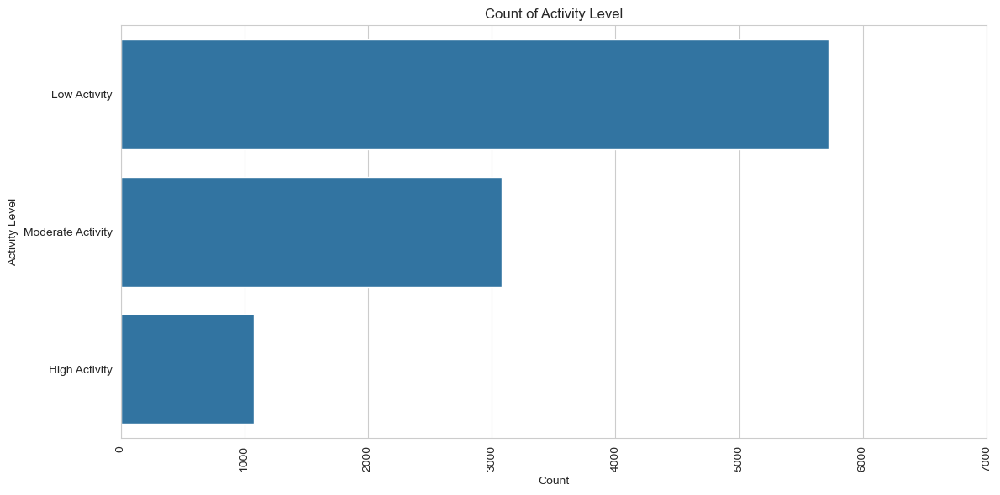

--------------------------------
Rare threshold of 1.0%
                   value_count   percent  is_rare
Activity Level                                   
Low Activity              5722  0.579150    False
Moderate Activity         3082  0.311943    False
High Activity             1076  0.108907    False


In [67]:
plot_categorical_column(df, target)

### Imbalance Target Analysis

In [68]:
def imbalance_report(y, n_splits=5):
    """
    Quick imbalance + drift check.

    Parameters
    ----------
    y : pd.Series
        Target labels.
    time_col : pd.Series or None
        Datetime-like column (or any discrete grouping key) for drift plot.
    period : str
        Pandas offset alias to aggregate the drift plot
        ('D' = day, 'M' = month, etc.).
    n_splits : int
        How many folds to test for minority-class support.
    """

    
    # --- core stats ---------------------------------------------------------
    vc = y.value_counts()
    p  = vc / len(y)                          # class proportions
    
    inv_herfindahl = 1 / (p**2).sum()         # **correct inverse-Herfindahl**
    maj_baseline   = p.max()
    H_bits         = entropy(vc, base=2)
    
    print("\nClass counts:\n", vc, "\n")
    print(f"Imbalance ratio         : {vc.max()/vc.min():.2f}:1")
    print(f"Majority-class baseline : {maj_baseline:.3f}")
    print(f"Shannon entropy         : {H_bits:.2f} bits "
          f"(max {np.log2(len(vc)):.2f})")
    print(f"Inverse-Herfindahl      : {inv_herfindahl:.2f} / {len(vc)} classes\n")
    
    # --- minority support per CV fold --------------------------------------
    skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)
    minority_class = vc.idxmin()
    mins = [(y.iloc[test] == minority_class).sum()
            for _, test in skf.split(np.zeros(len(y)), y)]
    print(f"Minority samples per {n_splits}-fold CV:", mins, "\n")
    


In [69]:
imbalance_report(df[target])


Class counts:
 Activity Level
Low Activity         5722
Moderate Activity    3082
High Activity        1076
Name: count, dtype: int64 

Imbalance ratio         : 5.32:1
Majority-class baseline : 0.579
Shannon entropy         : 1.33 bits (max 1.58)
Inverse-Herfindahl      : 2.25 / 3 classes

Minority samples per 5-fold CV: [np.int64(215), np.int64(215), np.int64(216), np.int64(215), np.int64(215)] 



| subject | data | explanation |
|---|---|-----|
| Imbalance ratio | **≈ 5.32 : 1** | *Mild-to-moderate imbalance.* Consider class weights or SMOTE-NC, but not dire. (calculation = 5722/1076) |
| Majority-class accuracy | **0.579** | If we predict only `Low Activity`, we have accuracy of 58%. (5722/9880) Any model must beat 58 % accuracy; better use **macro-F1** or log-loss as main metric. |
| Shannon Entropy | **≈ 1.23 bits (max 1.58)** | Our labels carry about 84% of the maximum uncertainty, class is imbalance but not severely. (1.23/1.58) In normal even class with 1/3, entropy is 100. 84% shows quite random, not so imbalanced.|
| Inverse-Herfindahl | **≈ 2.25 / 3 classes** | Dataset behaves like it contains the equivalent of 2¼ perfectly balanced classes out of 3 — a concise, bounded measure of imbalance. |
| Minority per 5-fold CV | **≥ 215** | Safe: every fold has > 200 “High Activity” rows, so metrics are stable. |

## Feature Analysis (Univariate)

In [70]:
# Get numerical columns names
numerical_columns = df.select_dtypes(include=['number']).columns
numerical_columns

Index(['Temperature', 'Humidity', 'CO2_InfraredSensor',
       'CO2_ElectroChemicalSensor', 'MetalOxideSensor_Unit1',
       'MetalOxideSensor_Unit2', 'MetalOxideSensor_Unit3',
       'MetalOxideSensor_Unit4', 'CO2_IR_calibrated', 'Humidity_missing_flag',
       'CO2_ElectroChemicalSensor_missing_flag',
       'MetalOxideSensor_Unit3_missing_flag', 'CO_GasSensor_missing_flag',
       'Ambient Light Level_missing_flag'],
      dtype='object')

In [71]:
numerical_features = numerical_columns[:9]
numerical_features

Index(['Temperature', 'Humidity', 'CO2_InfraredSensor',
       'CO2_ElectroChemicalSensor', 'MetalOxideSensor_Unit1',
       'MetalOxideSensor_Unit2', 'MetalOxideSensor_Unit3',
       'MetalOxideSensor_Unit4', 'CO2_IR_calibrated'],
      dtype='object')

In [72]:
def plot_numerical_column(df: pd.DataFrame, each_column: str):
    """    Feature Analysis of Numerical Columns
    """
    print('========================================')
    print('Feature Analysis of', each_column)
    print('========================================')

    # plot the distribution of the column
    fig, ax = plt.subplots(figsize=plot_size_fig) 
    sns.histplot(data=df, x=each_column, kde=True)
    
    ax.set_title(f'Distribution of {each_column}')
    ax.set_xlabel(each_column)
    ax.set_ylabel('Frequency')
    plt.tight_layout()
    plt.show()


    # plot the boxplot of the column
    fig, ax = plt.subplots(figsize=plot_size_fig)  
    sns.boxplot(data=df, x=each_column, ax=ax)
    ax.set_title(f'Boxplot of {each_column}')
    ax.set_xlabel(each_column)
    plt.tight_layout()
    plt.show()

    # Display the statistics of the column
    print('--------------------------------')
    print(' Statistics of', each_column)
    print('--------------------------------')
    print(df[each_column].describe())

    # compute IQR Range
    print('--------------------------------')
    q1 = df[each_column].quantile(0.25)
    q3 = df[each_column].quantile(0.75)
    iqr = q3 - q1
    print(f'IQR Range: {q1:.2f} - {q3:.2f} (IQR = {iqr:.2f})')

    # Compute skewness of floor_area_sqm
    print('--------------------------------')
    skewness = df[each_column].skew()
    print(f"Skewness of {each_column}: {skewness:.2f}")
    if skewness > 0.5: # type: ignore[arg-type]
        print("The distribution is positively skewed.")
    elif skewness < -0.5: # type: ignore[arg-type]
        print("The distribution is negatively skewed.")
    else:
        print("The distribution is approximately symmetric.")

    # Compute kurtosis of resale price
    kurtosis = df[each_column].kurt()
    print(f"Kurtosis of {each_column}: {kurtosis:.2f}")
    if kurtosis > 3: # type: ignore[arg-type]
        print("The distribution is leptokurtic.")
    elif kurtosis < 3: # type: ignore[arg-type]
        print("The distribution is platykurtic.")
    else:
        print("The distribution is mesokurtic.")
    


#### Numerical Feature Column: Temperature

Feature Analysis of Temperature


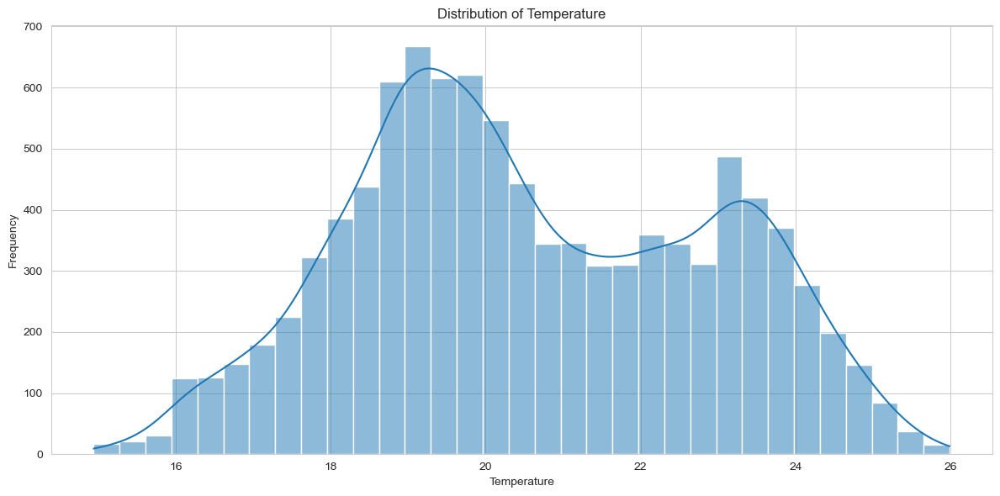

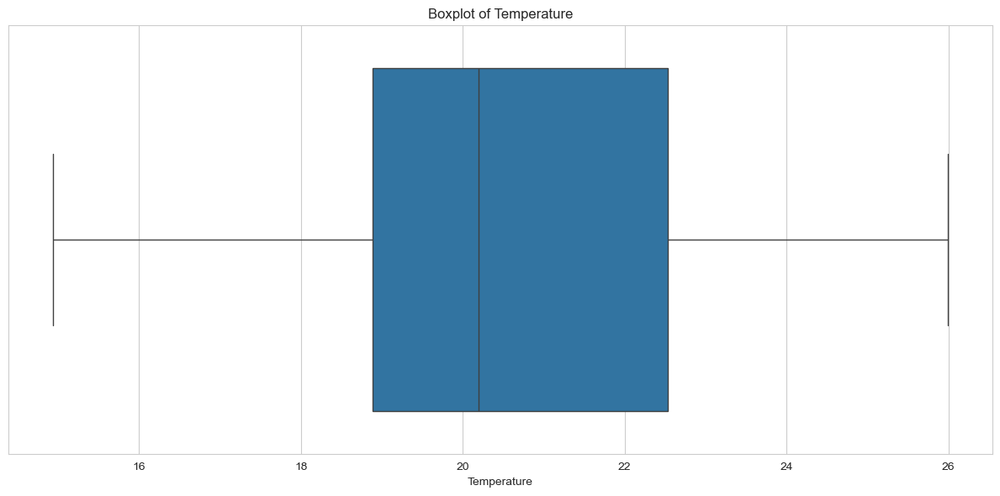

--------------------------------
 Statistics of Temperature
--------------------------------
count    9880.000000
mean       20.571510
std         2.286841
min        14.940000
25%        18.890000
50%        20.200000
75%        22.530000
max        25.990000
Name: Temperature, dtype: float64
--------------------------------
IQR Range: 18.89 - 22.53 (IQR = 3.64)
--------------------------------
Skewness of Temperature: 0.13
The distribution is approximately symmetric.
Kurtosis of Temperature: -0.86
The distribution is platykurtic.


In [73]:
plot_numerical_column(df, 'Temperature')

**While the skewness of `Temperature` is low at 0.13, statistically suggesting an approximately symmetric distribution, visual inspection of the data reveals 2 peaks suggesting a multimodal distribution.**

**Temperature range from minimum of 15 to maximum of 26 degree with an average of 20 degree. We have IQR of (18.9 degree – 22.5 degree) = 3.64. This means that 50% of elder are comfortable between 18.9 to 22.5 degrees.**

**For linear regression models, we will not apply a direct transformation to `Temperature` based on its low overall skewness.**

**Conversely, tree-based models (such as Random Forest or Gradient Boosting) are inherently well-suited to handle multimodal feature distributions without requiring explicit transformations.**

#### Numerical Feature Column: Humidity

Feature Analysis of Humidity


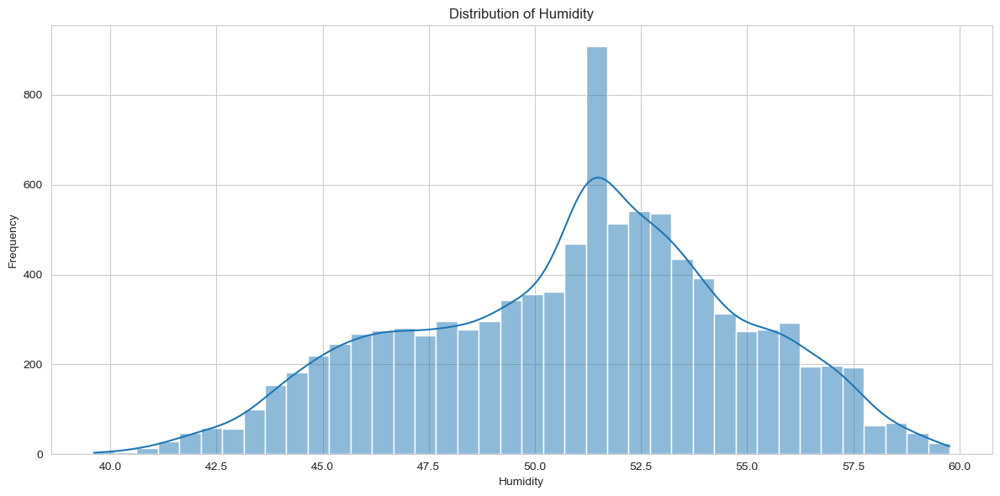

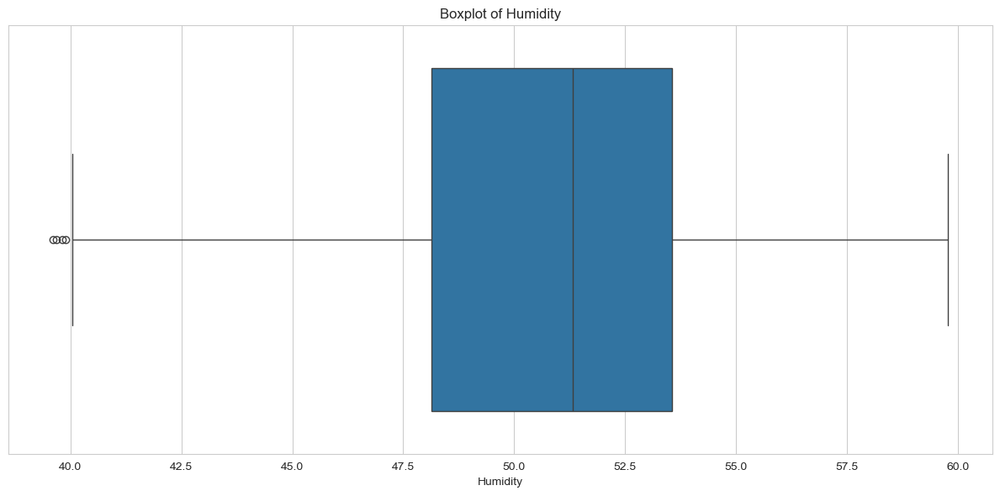

--------------------------------
 Statistics of Humidity
--------------------------------
count    9880.000000
mean       50.907468
std         3.852124
min        39.610000
25%        48.130000
50%        51.320000
75%        53.560000
max        59.770000
Name: Humidity, dtype: float64
--------------------------------
IQR Range: 48.13 - 53.56 (IQR = 5.43)
--------------------------------
Skewness of Humidity: -0.24
The distribution is approximately symmetric.
Kurtosis of Humidity: -0.52
The distribution is platykurtic.


In [74]:
plot_numerical_column(df, 'Humidity')

**Skewness of `Humidity` is low at -0.22, suggesting a very slight left skewed distribution. Visually there is also a slight bump on the left shoulder. There are few outliers on the left. Humidity range from 47.92 - 53.72 (IQR = 5.80)**

#### Numerical Feature Column: CO2_InfraredSensor

Feature Analysis of CO2_InfraredSensor


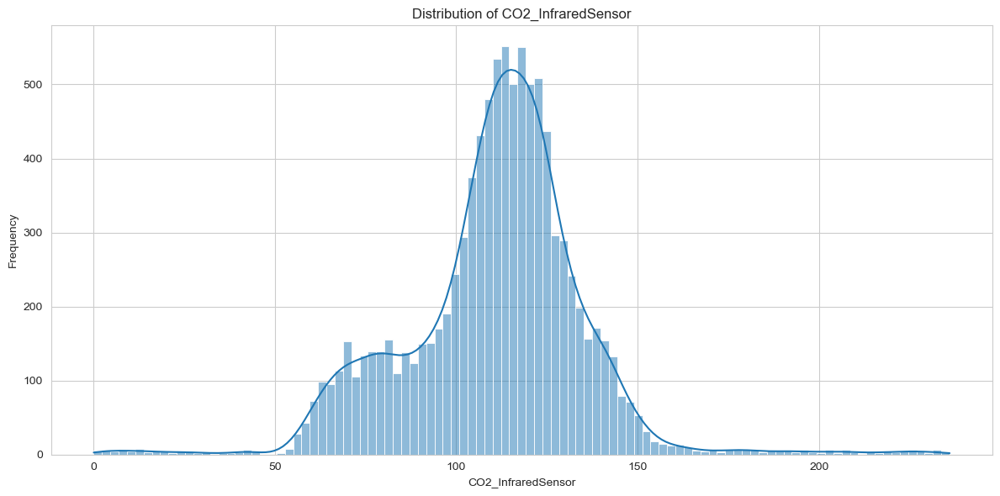

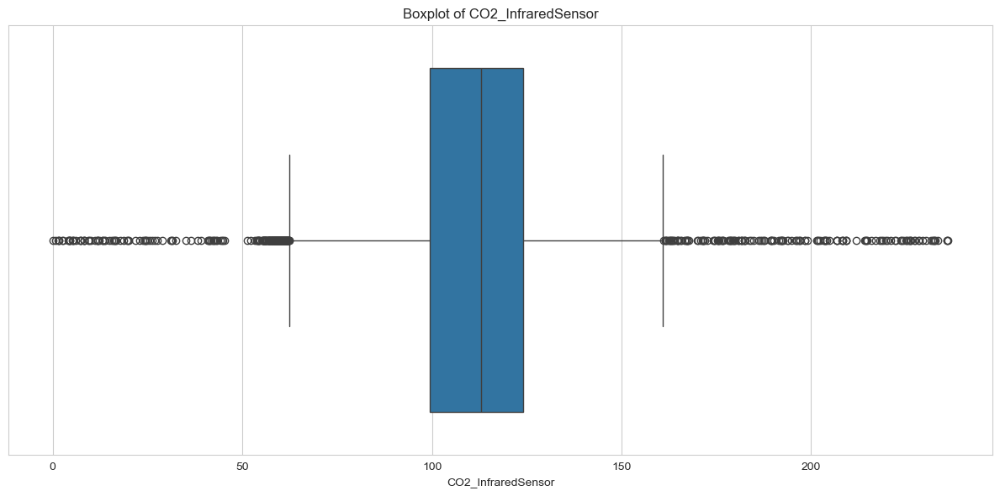

--------------------------------
 Statistics of CO2_InfraredSensor
--------------------------------
count    9880.000000
mean      110.601223
std        24.488285
min         0.100000
25%        99.365000
50%       113.060000
75%       124.022500
max       236.010000
Name: CO2_InfraredSensor, dtype: float64
--------------------------------
IQR Range: 99.37 - 124.02 (IQR = 24.66)
--------------------------------
Skewness of CO2_InfraredSensor: -0.05
The distribution is approximately symmetric.
Kurtosis of CO2_InfraredSensor: 3.13
The distribution is leptokurtic.


In [75]:
plot_numerical_column(df, 'CO2_InfraredSensor')

**This is the ordinal CO2 IR sensor data that is not to scale. Skewness of `CO2_InfraredSensor` is low at -0.05, suggesting a very slight left skewed distribution. Inter-quantile range from 99.29 - 124.05 (IQR = 24.75). There are many outliers on the both sides. We will explore the calibrated data further.**

#### Numerical Feature Column: CO2_IR_calibrated

Feature Analysis of CO2_IR_calibrated


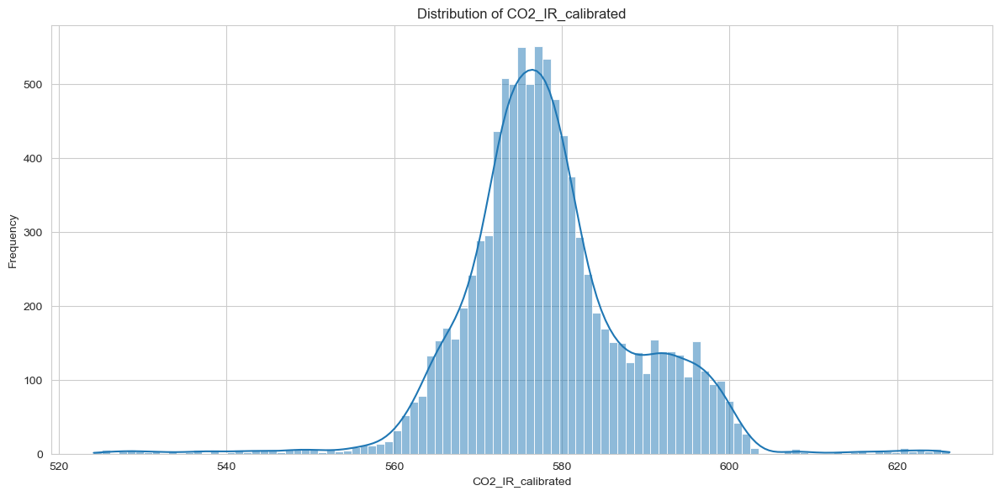

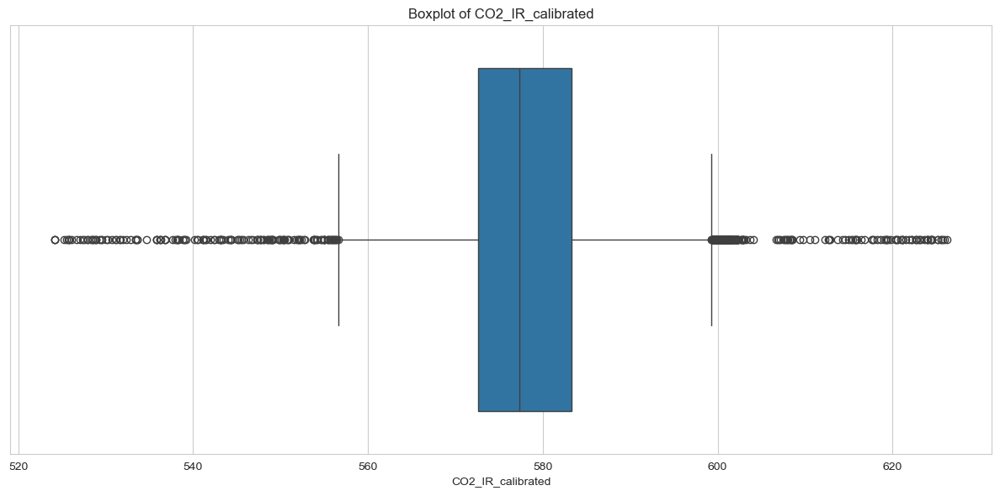

--------------------------------
 Statistics of CO2_IR_calibrated
--------------------------------
count    9880.000000
mean      578.432374
std        10.594431
min       524.176447
25%       572.625892
50%       577.368627
75%       583.293531
max       626.238807
Name: CO2_IR_calibrated, dtype: float64
--------------------------------
IQR Range: 572.63 - 583.29 (IQR = 10.67)
--------------------------------
Skewness of CO2_IR_calibrated: 0.05
The distribution is approximately symmetric.
Kurtosis of CO2_IR_calibrated: 3.13
The distribution is leptokurtic.


In [76]:
plot_numerical_column(df, 'CO2_IR_calibrated')

**The distribution is symmetric (skewness = 0.05) with many outliers on both tail ends. More investigation is required for the outliers. IQR range from 572.63 - 583.29 (IQR = 10.67).**

#### Numerical Feature Column: CO2_ElectroChemicalSensor

Feature Analysis of CO2_ElectroChemicalSensor


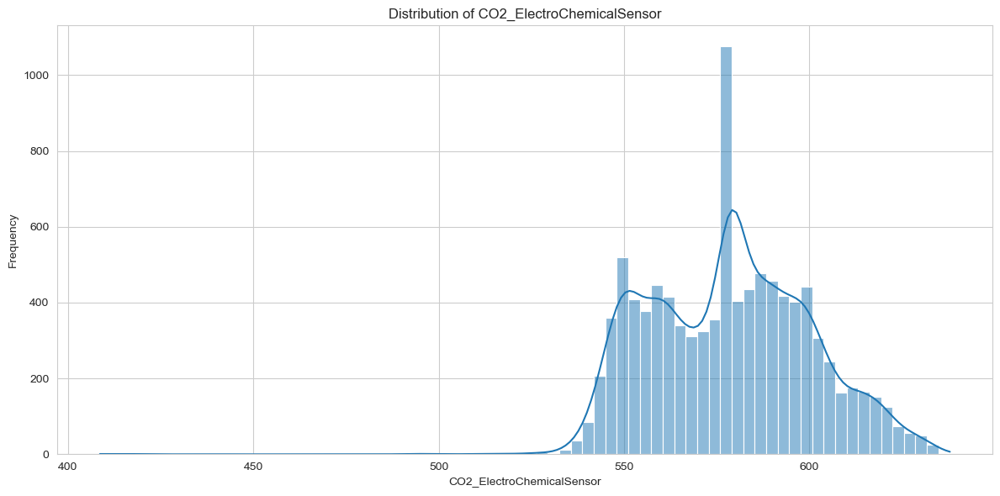

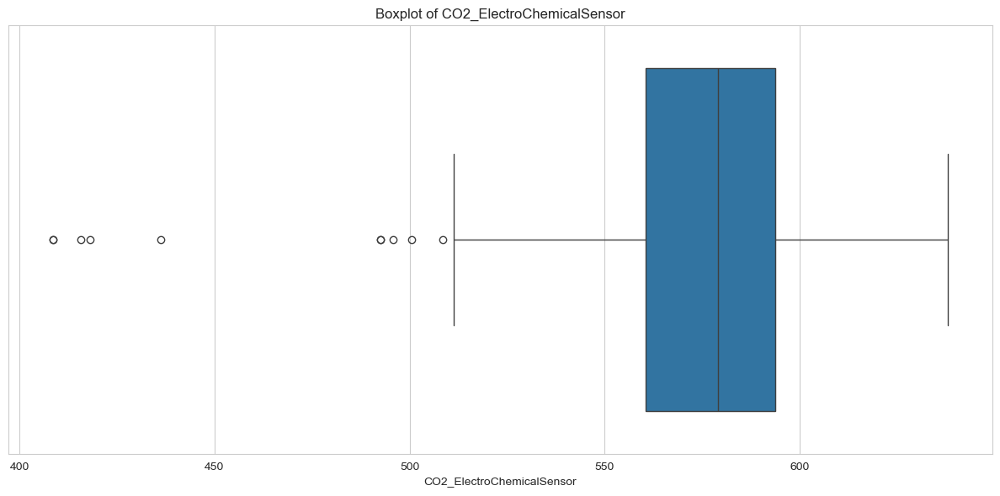

--------------------------------
 Statistics of CO2_ElectroChemicalSensor
--------------------------------
count    9880.000000
mean      578.408069
std        21.845750
min       408.600000
25%       560.400000
50%       578.930000
75%       593.800000
max       637.900000
Name: CO2_ElectroChemicalSensor, dtype: float64
--------------------------------
IQR Range: 560.40 - 593.80 (IQR = 33.40)
--------------------------------
Skewness of CO2_ElectroChemicalSensor: -0.05
The distribution is approximately symmetric.
Kurtosis of CO2_ElectroChemicalSensor: 0.81
The distribution is platykurtic.


In [77]:
plot_numerical_column(df, 'CO2_ElectroChemicalSensor')

**Statistically, the distribution shows a slight left skewed, however, visual inspection reveal that there is a dual peaks suggesting a multimodal distribution. There is also sign of left skewed. IQR Range: 560.40 - 593.80 (IQR = 33.40). The IQR is wider than the CO2 IR sensor. There is only a few outliers on the left of the distribution.**


#### Numerical Feature Column: MetalOxideSensor_Unit1

Feature Analysis of MetalOxideSensor_Unit1


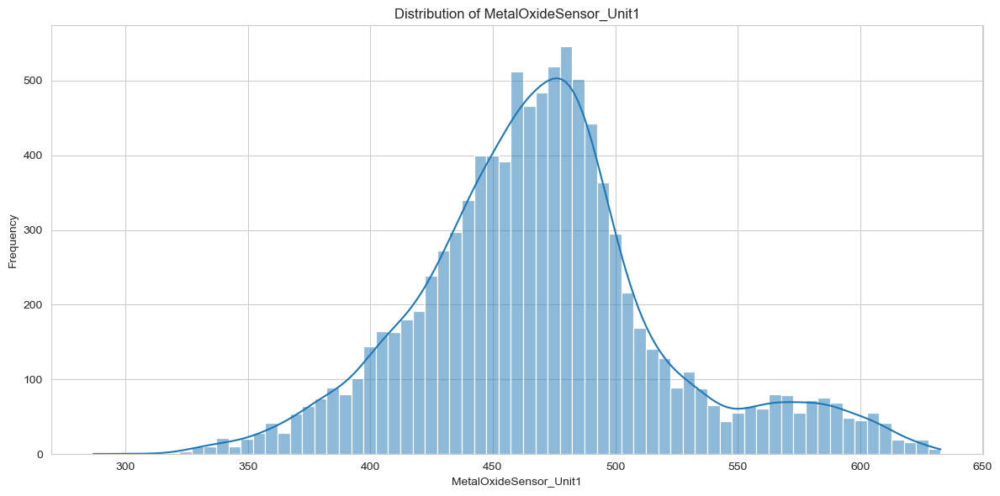

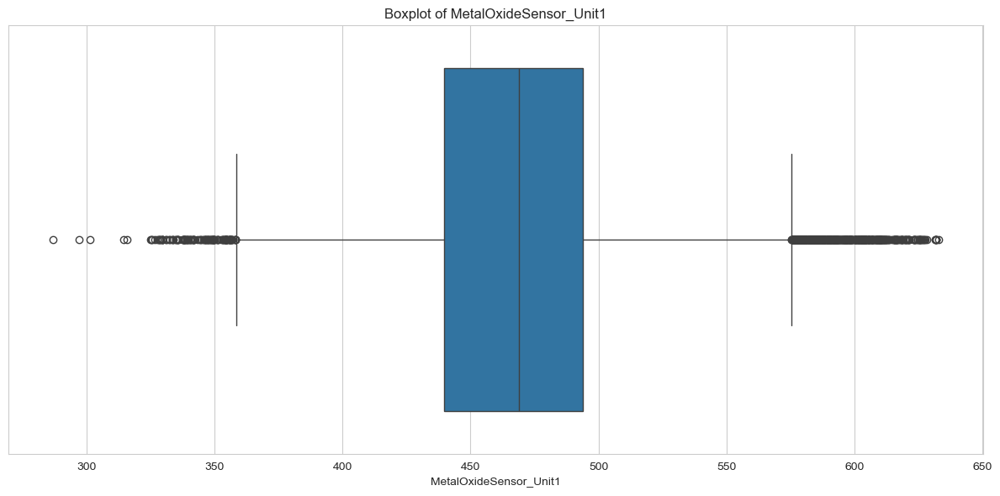

--------------------------------
 Statistics of MetalOxideSensor_Unit1
--------------------------------
count    9880.000000
mean      470.449518
std        51.384743
min       286.830000
25%       439.722500
50%       468.840000
75%       493.980000
max       632.890000
Name: MetalOxideSensor_Unit1, dtype: float64
--------------------------------
IQR Range: 439.72 - 493.98 (IQR = 54.26)
--------------------------------
Skewness of MetalOxideSensor_Unit1: 0.42
The distribution is approximately symmetric.
Kurtosis of MetalOxideSensor_Unit1: 0.68
The distribution is platykurtic.


In [78]:
plot_numerical_column(df, 'MetalOxideSensor_Unit1')

**The statistics suggest a moderately right skewed distribution. Visual inspection shows there is a right shoulder and distribution is thicker on the right tail than the left tail. There are also many outliers on both ends with the right tail more concentrate. We will perform analysis with other feature to discovery relationship between the outliers and other features.**  

#### Numerical Feature Column: MetalOxideSensor_Unit2

Feature Analysis of MetalOxideSensor_Unit2


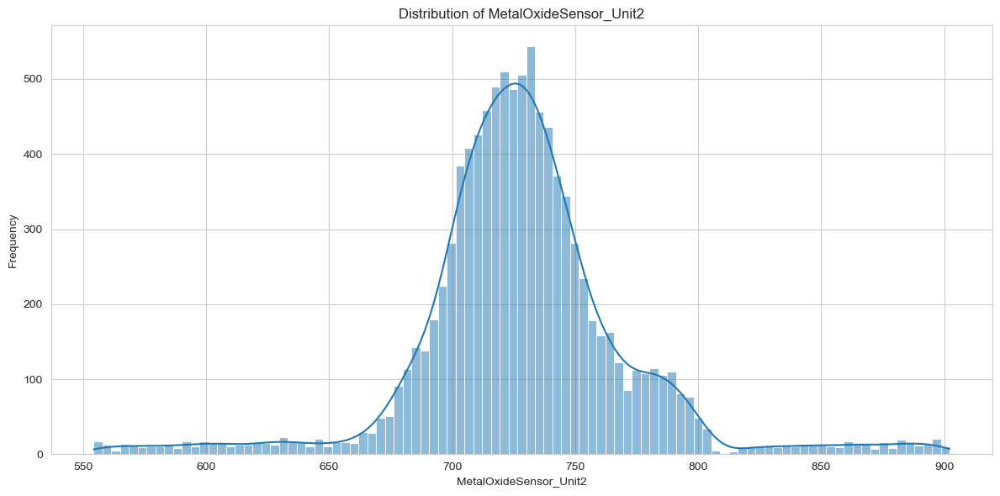

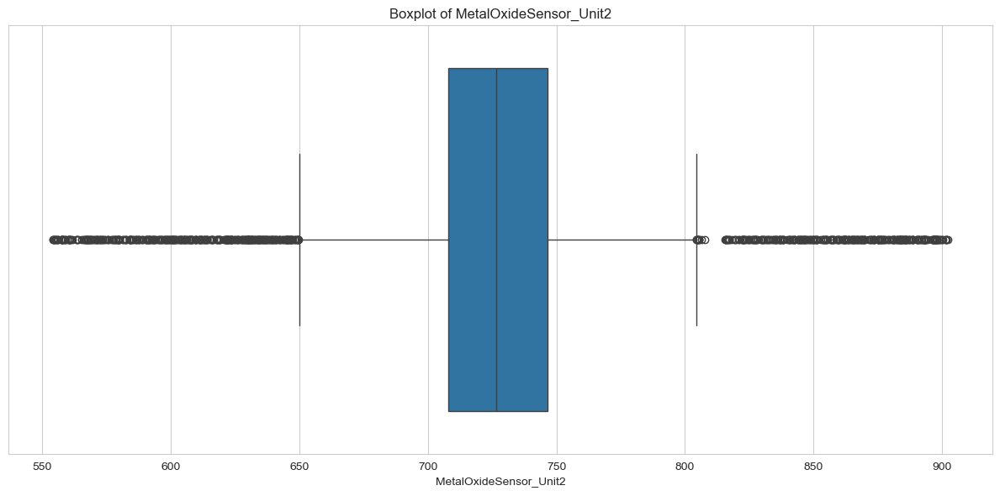

--------------------------------
 Statistics of MetalOxideSensor_Unit2
--------------------------------
count    9880.000000
mean      728.327546
std        43.452912
min       554.280000
25%       707.967500
50%       726.710000
75%       746.572500
max       902.210000
Name: MetalOxideSensor_Unit2, dtype: float64
--------------------------------
IQR Range: 707.97 - 746.57 (IQR = 38.61)
--------------------------------
Skewness of MetalOxideSensor_Unit2: 0.11
The distribution is approximately symmetric.
Kurtosis of MetalOxideSensor_Unit2: 3.88
The distribution is leptokurtic.


In [79]:
plot_numerical_column(df, 'MetalOxideSensor_Unit2')

**The statistics suggest a moderately right skewed distribution. Visual inspection shows there is a right shoulder and there is long tail on both side of distributions. There are also many outliers on both ends. We will perform analysis with other feature to discovery relationship between the outliers and other features.**  

#### Numerical Feature Column: MetalOxideSensor_Unit3

Feature Analysis of MetalOxideSensor_Unit3


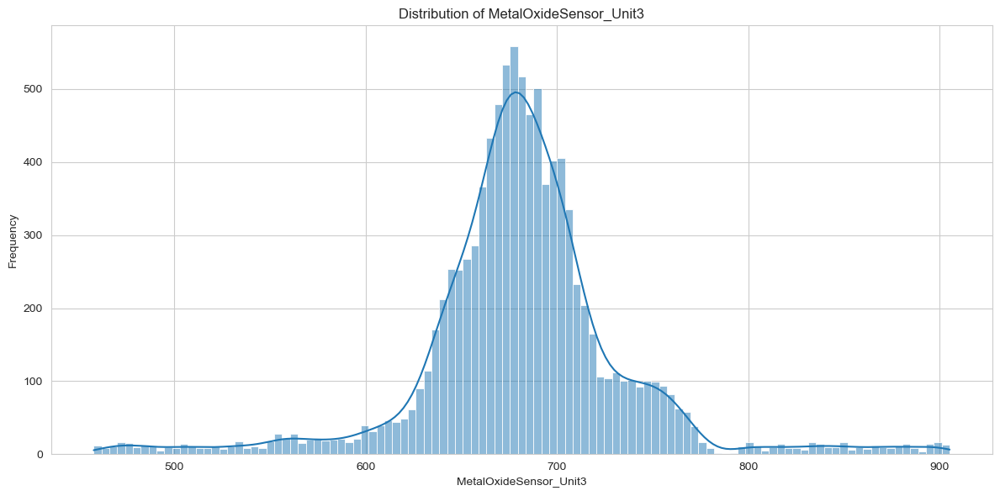

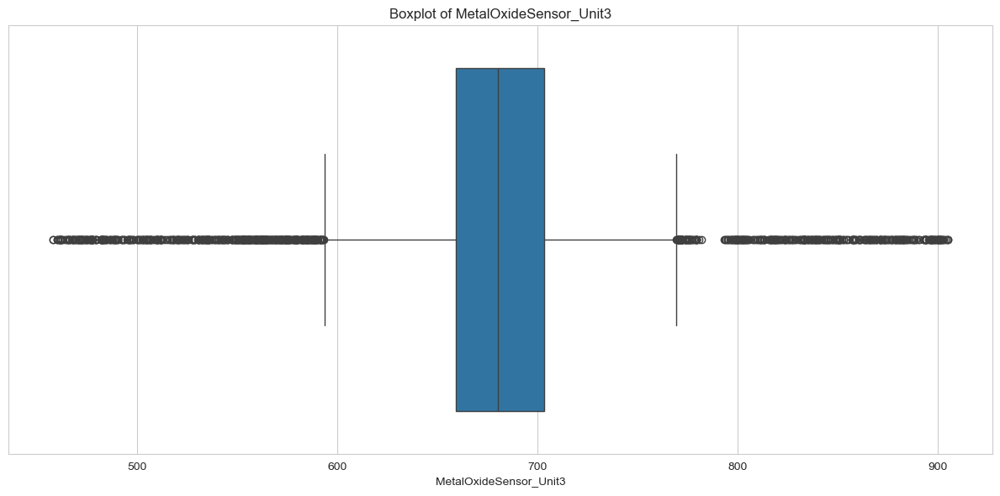

--------------------------------
 Statistics of MetalOxideSensor_Unit3
--------------------------------
count    9880.000000
mean      681.414510
std        54.835164
min       457.810000
25%       659.320000
50%       680.395000
75%       703.357414
max       905.150000
Name: MetalOxideSensor_Unit3, dtype: float64
--------------------------------
IQR Range: 659.32 - 703.36 (IQR = 44.04)
--------------------------------
Skewness of MetalOxideSensor_Unit3: -0.04
The distribution is approximately symmetric.
Kurtosis of MetalOxideSensor_Unit3: 4.21
The distribution is leptokurtic.


In [80]:
plot_numerical_column(df, 'MetalOxideSensor_Unit3')

**The statistics suggest a symmetric distribution with a slight left skewed. Visual inspection shows there is a right shoulder and there is long tail on both side of distributions. There are also many outliers on both ends. We will perform analysis with other feature to discovery relationship between the outliers and other features.**  

#### Numerical Feature Column: MetalOxideSensor_Unit4

Feature Analysis of MetalOxideSensor_Unit4


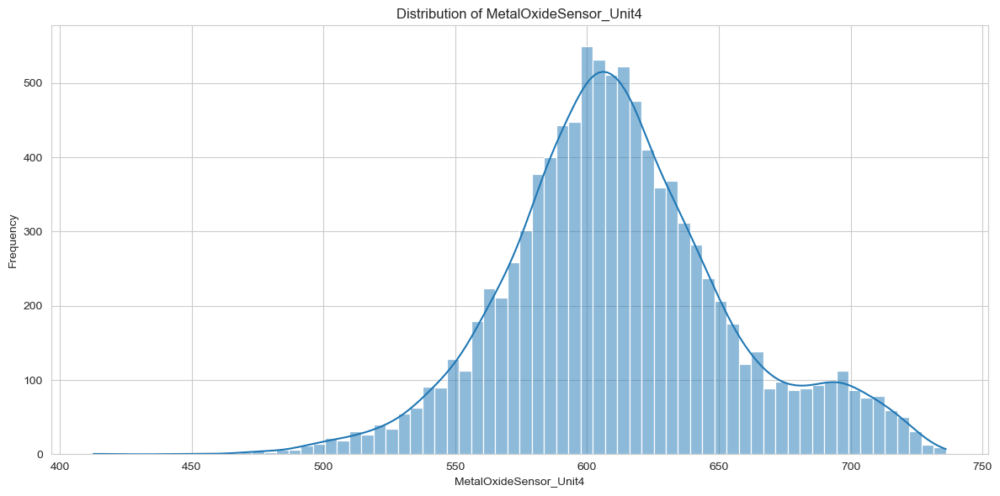

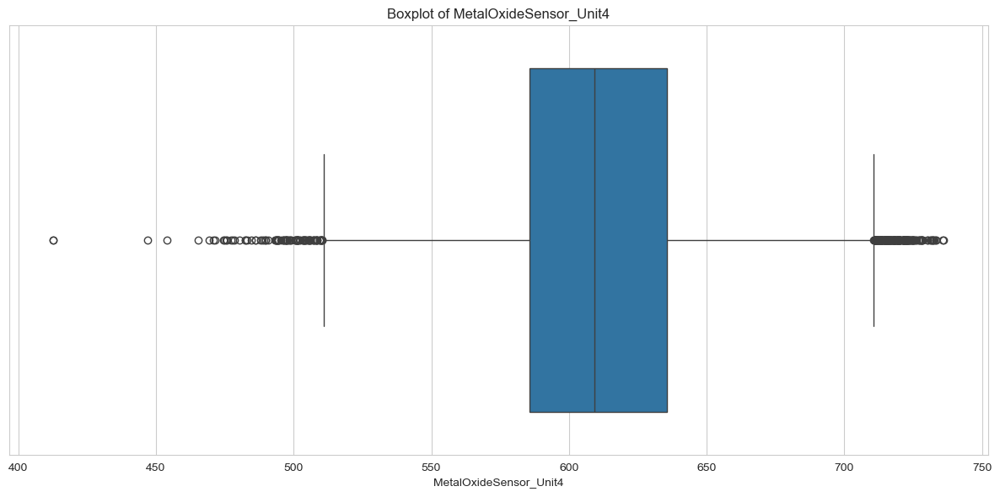

--------------------------------
 Statistics of MetalOxideSensor_Unit4
--------------------------------
count    9880.00000
mean      612.05048
std        42.87548
min       412.79000
25%       585.63500
50%       609.13000
75%       635.57000
max       736.11000
Name: MetalOxideSensor_Unit4, dtype: float64
--------------------------------
IQR Range: 585.63 - 635.57 (IQR = 49.94)
--------------------------------
Skewness of MetalOxideSensor_Unit4: 0.22
The distribution is approximately symmetric.
Kurtosis of MetalOxideSensor_Unit4: 0.41
The distribution is platykurtic.


In [81]:
plot_numerical_column(df, 'MetalOxideSensor_Unit4')

**The statistics suggest a moderately right skewed distribution. Visual inspection shows there is a right shoulder and there is long tail on left side of distributions. There are also many outliers on both ends. The outliers on the right are more concentrated whereas the outliers on the left tail are very sparse on the extreme end. We will perform analysis with other feature to discovery relationship between the outliers and other features.**  

### Categorical Columns

In [82]:
# Get categorical columns names
categorical_columns = df.select_dtypes(include=['object', 'category']).columns.tolist()
categorical_columns

['Time of Day',
 'CO_GasSensor',
 'Session ID',
 'HVAC Operation Mode',
 'Ambient Light Level',
 'Activity Level']

In [83]:
categorical_features = categorical_columns[:-1]  # Exclude 'Session ID' as it is an identifier
categorical_features

['Time of Day',
 'CO_GasSensor',
 'Session ID',
 'HVAC Operation Mode',
 'Ambient Light Level']

In [84]:
def plot_categorical_column(df: pd.DataFrame, column_name: str, rare_threshold: float = 0.01): # 0.01 (1%) is the default threshold for rare values
    """
    Display the statistics of the column
    Countplot of the column sorted by the value counts with highest value counts on top (horizontal view)
    Value counts sorted by the value counts with weights in percentage
    """
    # Display the column name
    print('========================================')
    print('Feature Analysis of', column_name)
    print('========================================')
    
    # countplot of the column sorted by the value counts with highest value counts on top
    fig, ax = plt.subplots(figsize=plot_size_fig)  

    sns.set_style("whitegrid")
    sns.countplot(data=df, y=column_name, order=df[column_name].value_counts().index)

    ax.set_title(f'Count of {column_name}')
    ax.set_xlabel('Count')
    ax.set_ylabel(column_name)
    ax.set_xticks(ax.get_xticks(), ax.get_xticklabels(), rotation = 90) # type: ignore

    plt.tight_layout()
    plt.show()

    print('--------------------------------')
    # Display the statistics of the column
    print(f'{column_name} describe:')
    print(df[column_name].describe())

    print('--------------------------------')
    # Display the value counts with percentage
    value_counts = df[column_name].value_counts(dropna=False)
    value_counts_percentage = value_counts/len(df[column_name])
    value_count_rare_df = pd.DataFrame({
        "value_count"   : value_counts,
        "percent" : value_counts_percentage
    })
    value_count_rare_df["is_rare"] = value_count_rare_df["percent"] < rare_threshold

    print('--------------------------------')
    print(f'Rare threshold of {rare_threshold * 100}%')
    print(value_count_rare_df)
    print('========================================')

#### Categorical Feature Column: Time of Day

Feature Analysis of Time of Day


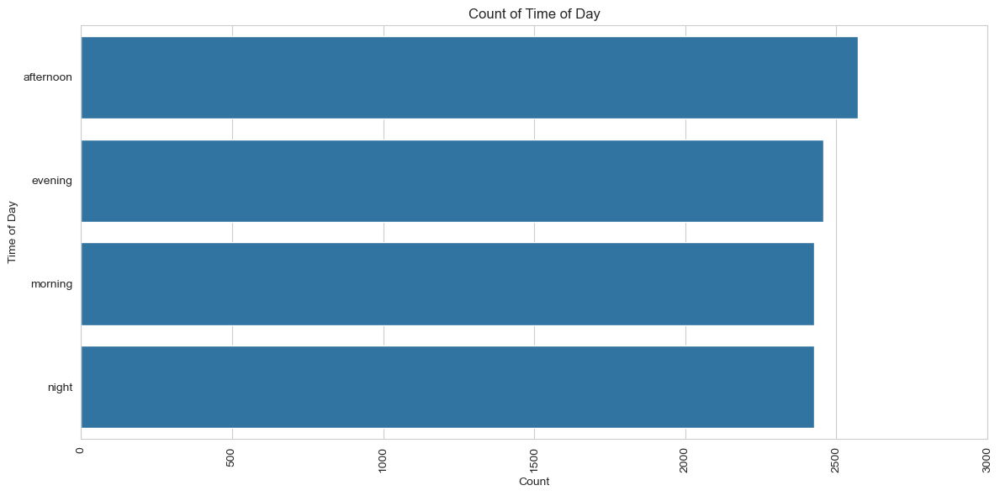

--------------------------------
Time of Day describe:
count          9880
unique            4
top       afternoon
freq           2571
Name: Time of Day, dtype: object
--------------------------------
--------------------------------
Rare threshold of 1.0%
             value_count   percent  is_rare
Time of Day                                
afternoon           2571  0.260223    False
evening             2456  0.248583    False
morning             2427  0.245648    False
night               2426  0.245547    False


In [85]:
plot_categorical_column(df,'Time of Day')

**The distribution is fairly balanced.**

#### Categorical Feature Column: CO_GasSensor

Feature Analysis of CO_GasSensor


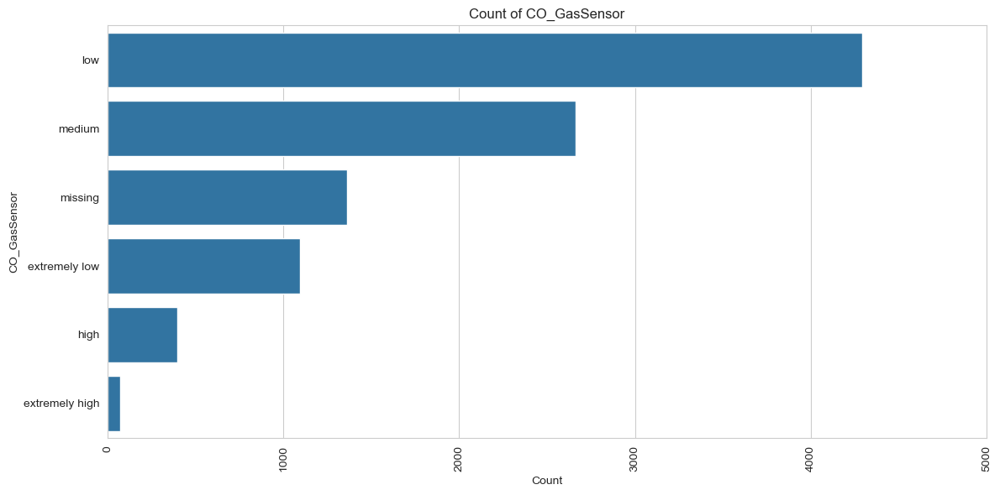

--------------------------------
CO_GasSensor describe:
count     9880
unique       6
top        low
freq      4292
Name: CO_GasSensor, dtype: object
--------------------------------
--------------------------------
Rare threshold of 1.0%
                value_count   percent  is_rare
CO_GasSensor                                  
low                    4292  0.434413    False
medium                 2661  0.269332    False
missing                1365  0.138158    False
extremely low          1096  0.110931    False
high                    395  0.039980    False
extremely high           71  0.007186     True


In [86]:
plot_categorical_column(df,'CO_GasSensor')

**This feature show highly imbalance distribution. We will not group the rare occurrence as it may contain important information. We will use tree-based modal for detect the signal.**

#### Categorical Feature Column: Session ID

Feature Analysis of Session ID


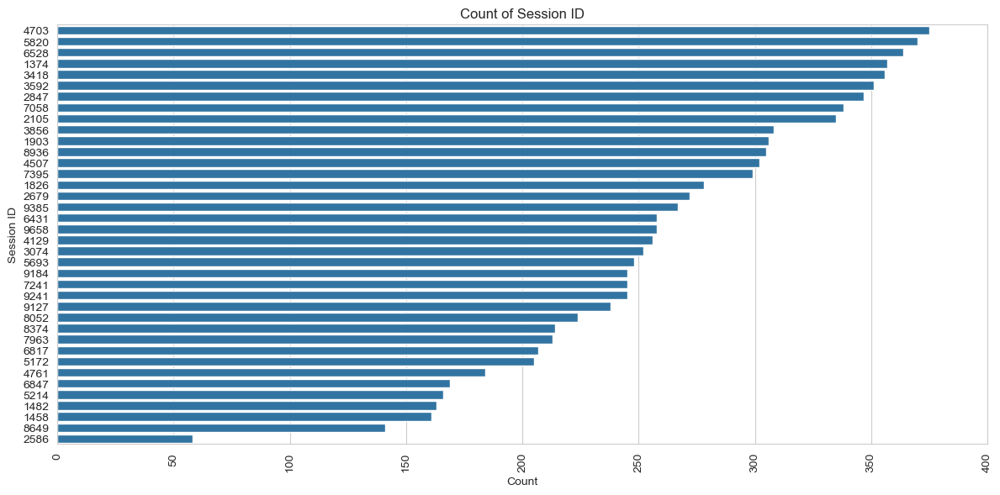

--------------------------------
Session ID describe:
count     9880
unique      38
top       4703
freq       375
Name: Session ID, dtype: int64
--------------------------------
--------------------------------
Rare threshold of 1.0%
            value_count   percent  is_rare
Session ID                                
4703                375  0.037955    False
5820                370  0.037449    False
6528                364  0.036842    False
1374                357  0.036134    False
3418                356  0.036032    False
3592                351  0.035526    False
2847                347  0.035121    False
7058                338  0.034211    False
2105                335  0.033907    False
3856                308  0.031174    False
1903                306  0.030972    False
8936                305  0.030870    False
4507                302  0.030567    False
7395                299  0.030263    False
1826                278  0.028138    False
2679                272  0.027530  

In [87]:
plot_categorical_column(df, 'Session ID')

**There are 38 session ID, it may contain temporal signal. Only one session ID has very low value count. Each session ID contains 2-3% of the dataset with few of them has lower than 2%** 

#### Categorical Feature Column: HVAC Operation Mode

Feature Analysis of HVAC Operation Mode


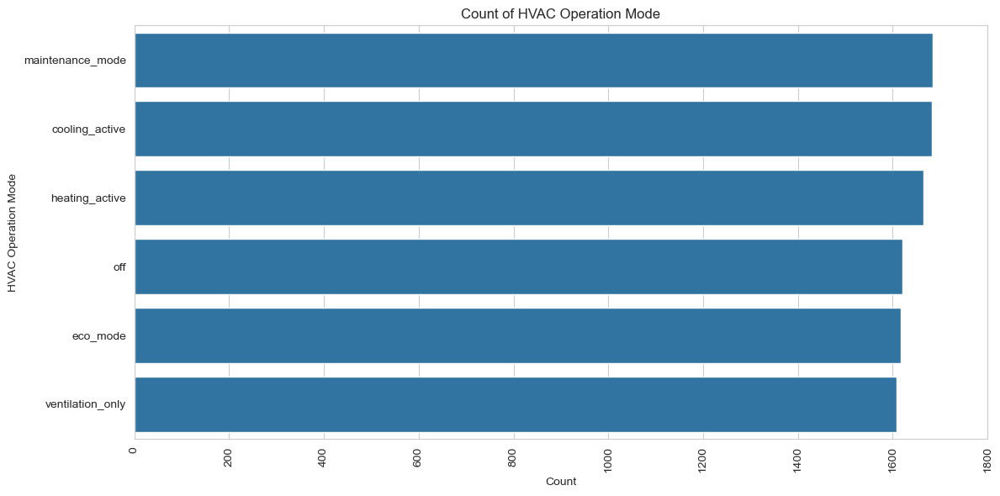

--------------------------------
HVAC Operation Mode describe:
count                 9880
unique                   6
top       maintenance_mode
freq                  1684
Name: HVAC Operation Mode, dtype: object
--------------------------------
--------------------------------
Rare threshold of 1.0%
                     value_count   percent  is_rare
HVAC Operation Mode                                
maintenance_mode            1684  0.170445    False
cooling_active              1683  0.170344    False
heating_active              1666  0.168623    False
off                         1621  0.164069    False
eco_mode                    1618  0.163765    False
ventilation_only            1608  0.162753    False


In [88]:
plot_categorical_column(df, 'HVAC Operation Mode')

**The distribution is fairly even. All group consist of 16-17% of dataset.**

#### Categorical Feature Column: Ambient Light Level

Feature Analysis of Ambient Light Level


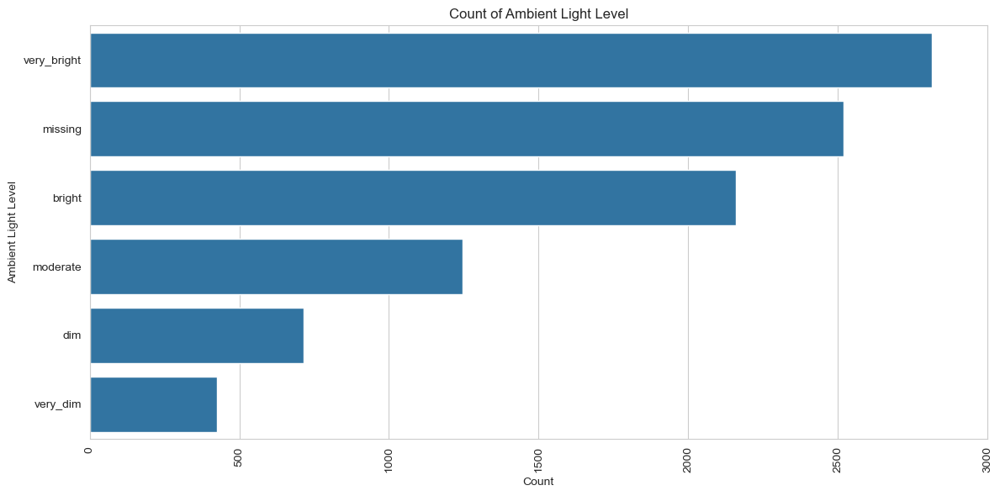

--------------------------------
Ambient Light Level describe:
count            9880
unique              6
top       very_bright
freq             2815
Name: Ambient Light Level, dtype: object
--------------------------------
--------------------------------
Rare threshold of 1.0%
                     value_count   percent  is_rare
Ambient Light Level                                
very_bright                 2815  0.284919    False
missing                     2519  0.254960    False
bright                      2160  0.218623    False
moderate                    1245  0.126012    False
dim                          715  0.072368    False
very_dim                     426  0.043117    False


In [89]:
plot_categorical_column(df, 'Ambient Light Level')

**The distribution of ambient light level is quite imbalance, however, it is not sparse.**

### Conclusion of Univariate Analysis

**Numeric features**
- **Most variables show roughly symmetric, bell-shaped distributions, but a few sensors (e.g., MOx units, CO₂ channels) are multi-modal or heavy-tailed.**
- **Outliers are abundant, especially in gas-sensor readings.**


**Categorical features**
- **Cardinality is modest for all engineered buckets (Time-of-Day, CO_GasSensor levels, HVAC modes, Ambient-Light levels). Only Session ID is high-cardinality (≈40 unique IDs).**
- **Sparse categories occur in a few variables (e.g., CO_GasSensor = “extremely high”).**
- **Session ID need to be investigate further.**

## Bivariate Analysis: Feature vs Target

In [90]:
# capture updated numerical and categorical columns
numerical_columns = df.select_dtypes(include=['number']).columns
categorical_columns = df.select_dtypes(include=['object', 'category']).columns
temporal_columns = df.select_dtypes(include=['datetime']).columns

In [91]:
numerical_columns

Index(['Temperature', 'Humidity', 'CO2_InfraredSensor',
       'CO2_ElectroChemicalSensor', 'MetalOxideSensor_Unit1',
       'MetalOxideSensor_Unit2', 'MetalOxideSensor_Unit3',
       'MetalOxideSensor_Unit4', 'CO2_IR_calibrated', 'Humidity_missing_flag',
       'CO2_ElectroChemicalSensor_missing_flag',
       'MetalOxideSensor_Unit3_missing_flag', 'CO_GasSensor_missing_flag',
       'Ambient Light Level_missing_flag'],
      dtype='object')

In [92]:
numerical_features

Index(['Temperature', 'Humidity', 'CO2_InfraredSensor',
       'CO2_ElectroChemicalSensor', 'MetalOxideSensor_Unit1',
       'MetalOxideSensor_Unit2', 'MetalOxideSensor_Unit3',
       'MetalOxideSensor_Unit4', 'CO2_IR_calibrated'],
      dtype='object')

In [93]:
categorical_columns

Index(['Time of Day', 'CO_GasSensor', 'Session ID', 'HVAC Operation Mode',
       'Ambient Light Level', 'Activity Level'],
      dtype='object')

In [94]:
categorical_features

['Time of Day',
 'CO_GasSensor',
 'Session ID',
 'HVAC Operation Mode',
 'Ambient Light Level']

In [95]:
temporal_columns

Index([], dtype='object')

In [96]:
target

'Activity Level'

### Numerical Bivariate Analysis  

In [97]:
def normality_p(arr, sample=5000):
    arr = arr.dropna()
    if len(arr) > sample:
        arr = arr.sample(sample, random_state=0)
    return st.shapiro(arr).pvalue if len(arr) >= 3 else np.nan

def epsilon_sq_kw(H, n, k):
    return (H - k + 1) / (n - k)


def plot_num_feature_with_target(
    df: pd.DataFrame,
    numerical_col: str,
    target: str,
    alpha_scatter: float = .2,
    frac_lowess: float = .3,
    alpha: float = .05,
):
    """
    One-shot bivariate EDA between a numeric predictor and any target.
    (Full doc-string omitted here for brevity – see earlier answer.)
    """
    print("="*100)
    print(f"{numerical_col} ↔ {target}")
    print("="*100)

    x, y = df[numerical_col], df[target]

    # ------------------------------------------------------------------ #
    # NUMERIC TARGET
    # ------------------------------------------------------------------ #
    if is_numeric_dtype(y):
        fig, ax = plt.subplots(figsize=(6, 4))
        sns.scatterplot(x=x, y=y, alpha=alpha_scatter, ax=ax)
        lo = sm.nonparametric.lowess(y, x, frac=frac_lowess, return_sorted=True)
        ax.plot(lo[:, 0], lo[:, 1], color="orange", lw=2)
        ax.set_title(f"{numerical_col} vs {target}")
        plt.tight_layout(); plt.show()

        sns.regplot(x=x, y=y,
                    scatter_kws=dict(alpha=alpha_scatter),
                    line_kws=dict(color="orange"), ci=None)
        plt.title(f"Linear fit: {target} ~ {numerical_col}")
        plt.tight_layout(); plt.show()

        sns.residplot(x=x, y=y, lowess=True,
                      scatter_kws=dict(alpha=alpha_scatter),
                      line_kws=dict(color="orange"))
        plt.title("Residuals"); plt.tight_layout(); plt.show()

        pear_r, pear_p = st.pearsonr(x, y)
        spear_r, spear_p = st.spearmanr(x, y)
        print(f"Pearson r  = {pear_r:.3f}  (p = {pear_p:.3g})")
        print(f"Spearman ρ = {spear_r:.3f}  (p = {spear_p:.3g})")
        return

    # ------------------------------------------------------------------ #
    # CATEGORICAL TARGET
    # ------------------------------------------------------------------ #
    y = y.astype("category")
    cats = y.cat.categories
    groups = [x[y == c] for c in cats]

    # Strip-plot, violin-plot, and box-plot
    # -------------------------------------------------------------
    # Note: the figure size is adjusted based on the number of categories
    plt.figure(figsize=(max(6, 1.4*len(cats)), 5))
    sns.stripplot(x=y.values, y=x, jitter=.25, alpha=.08, color="royalblue")
    sns.violinplot(x=y.values, y=x, inner=None, color="lightcoral", alpha=.6)
    sns.boxplot(x=y.values, y=x, width=.12, showcaps=False,
                boxprops=dict(facecolor='white'))
    plt.title(f"{numerical_col} by {target}")
    plt.tight_layout(); plt.show()

    # Display summary statistics
    # -------------------------------------------------------------
    # Note: observed=True ensures that all categories are shown, even if empty
    print("\n=== Summary statistics ===")
    display(df.groupby(target, observed=True)[numerical_col]
              .agg(['count','mean','median','std','min','max'])
              .rename(columns={'std':'std_dev'})
              .round(2))

    # Normality and variance tests
    # -------------------------------------------------------------
    # Note: normality_p() and epsilon_sq_kw() are helper functions defined above
    print("\n=== Normality and variance tests ===")
    if any(g.nunique(dropna=True) < 2 for g in groups):
        print("⚠️  Insufficient variation — skipping tests."); return
    norm_p = [normality_p(g) for g in groups]
    lev_p = st.levene(*groups, center='median').pvalue
    norm_ok, var_ok = all(p > alpha for p in norm_p), lev_p > alpha
    print(f"Normality   (min p across groups): {min(norm_p):.4g}"
          f"  → {'OK' if norm_ok else 'NOT normal'}")
    print(f"Homogeneity (Levene p)           : {lev_p:.4g}"
          f"  → {'equal var' if var_ok else 'heteroscedastic'}")

    # Perform ANOVA or Kruskal-Wallis test
    # -------------------------------------------------------------
    print("\n=== Omnibus tests ===")
    F, pA = st.f_oneway(*groups)
    # ANOVA effect size
    ss_between = sum(len(g)*(g.mean()-x.mean())**2 for g in groups)
    ss_total   = ((x - x.mean())**2).sum()
    eta_sq = ss_between / ss_total
    print(f"ANOVA: F={F:.2f}, p={pA:.3g}, η²={eta_sq:.3f}")

    # If ANOVA assumptions are violated, use Kruskal-Wallis test
    H, pK = st.kruskal(*groups)
    eps = epsilon_sq_kw(H, len(x), len(groups))
    print(f"Kruskal: H={H:.2f}, p={pK:.3g}, ε²={eps:.3f}")

    recommended = "ANOVA" if (norm_ok and var_ok) else "Kruskal‑Wallis"
    print(f"Recommendation : ➜ **{recommended}** at α={alpha}")

    # Post-hoc analysis (if ANOVA is significant)
    # ---------- post-hoc comparisons ----------
    print("\n=== Post-hoc comparisons ===")

    if norm_ok and var_ok and pA < alpha:
        # ▸ Tukey HSD (parametric)
        try:
            from statsmodels.stats.multicomp import pairwise_tukeyhsd
            tukey = pairwise_tukeyhsd(endog=x, groups=y, alpha=alpha)
            print(tukey.summary())
        except ImportError:
            print("Install **statsmodels** ≥ 0.14 for Tukey HSD.")
    elif pK < alpha:
        # ▸ Dunn with Bonferroni (non-parametric)
        try:
            import scikit_posthocs as sp
            dunn = sp.posthoc_dunn(df[[numerical_col, target]].dropna(),
                                val_col=numerical_col,
                                group_col=target,
                                p_adjust='bonferroni')
            # nice heat-map display in notebooks
            #display(dunn.style.background_gradient(cmap="Blues"))
            print("▸ Dunn (Bonferroni-adjusted):")
            fig, ax = plt.subplots(figsize=plot_size_heatmap)
            sns.heatmap(dunn, annot=True, fmt=".2f",
                        cmap="coolwarm", cbar_kws={"label": "p-value"},
                        vmin=0, vmax=1, linewidths=.5)
            plt.title("Dunn's test p-values")
            plt.tight_layout(); plt.show()
            #print(dunn)

        except ImportError:
            print("Install **scikit-posthocs** for Dunn’s test.")


    y_codes = y.cat.codes
    mi = mutual_info_score(y_codes, pd.qcut(x, q=20, duplicates='drop').cat.codes)
    print(f"MI (20-bins) = {mi:.3f}")
    print("-"*100)

In [98]:
numerical_features

Index(['Temperature', 'Humidity', 'CO2_InfraredSensor',
       'CO2_ElectroChemicalSensor', 'MetalOxideSensor_Unit1',
       'MetalOxideSensor_Unit2', 'MetalOxideSensor_Unit3',
       'MetalOxideSensor_Unit4', 'CO2_IR_calibrated'],
      dtype='object')

#### Numerical Feature Column: Temperature with Activity Level

Temperature ↔ Activity Level


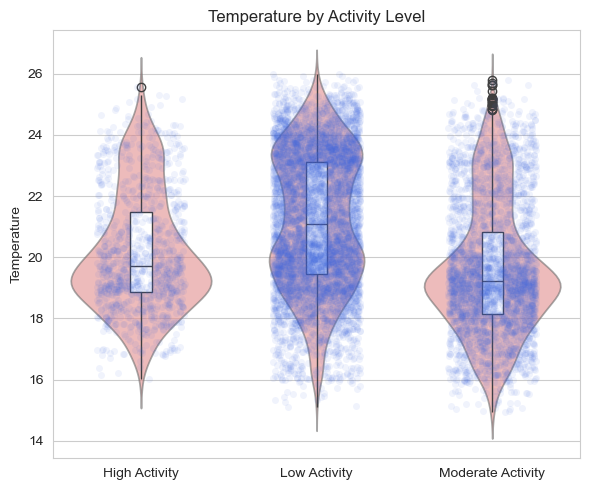


=== Summary statistics ===


,count,mean,median,std_dev,min,max
Activity Level,,,,,,
High Activity,1076,20.17,19.73,1.93,16.03,25.58
Low Activity,5722,21.16,21.10,2.23,15.12,25.99
Moderate Activity,3082,19.61,19.23,2.15,14.94,25.79



=== Normality and variance tests ===
Normality   (min p across groups): 5.091e-27  → NOT normal
Homogeneity (Levene p)           : 5.809e-28  → heteroscedastic

=== Omnibus tests ===
ANOVA: F=530.05, p=2.17e-219, η²=0.097
Kruskal: H=998.74, p=1.34e-217, ε²=0.101
Recommendation : ➜ **Kruskal‑Wallis** at α=0.05

=== Post-hoc comparisons ===
▸ Dunn (Bonferroni-adjusted):


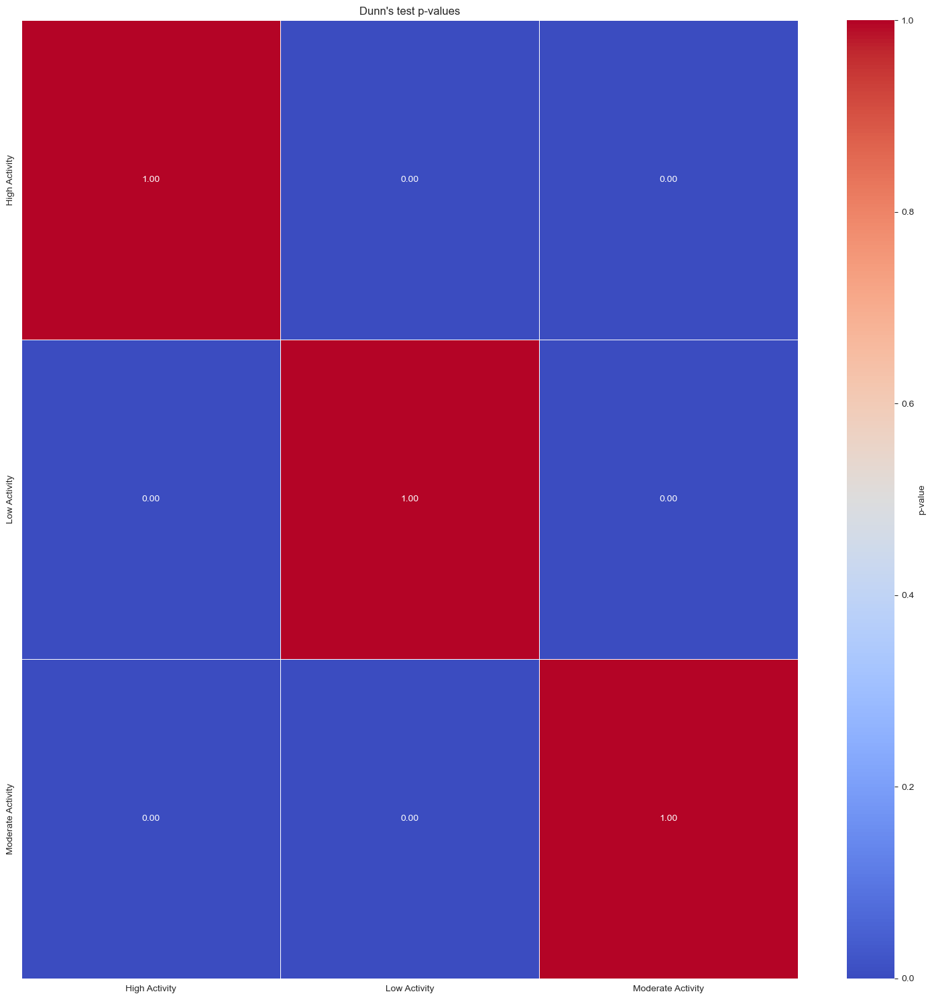

MI (20-bins) = 0.059
----------------------------------------------------------------------------------------------------


In [99]:
plot_num_feature_with_target(df, 'Temperature', target)

**Ambient temperature shows a statistically significant but only moderate association with activity. Kruskal–Wallis confirms non-identical distributions (ε² ≈ 0.10). Post-hoc Dunn tests indicate that High-, Moderate-, and Low-Activity groups all differ pairwise (p < 0.001). However, mutual information of 0.06 and extensive overlap in the violins suggest temperature alone will provide limited predictive power.**

**We will keep this feature for now.** 

#### Numerical Feature Column: Humidity with Activity Level

Humidity ↔ Activity Level


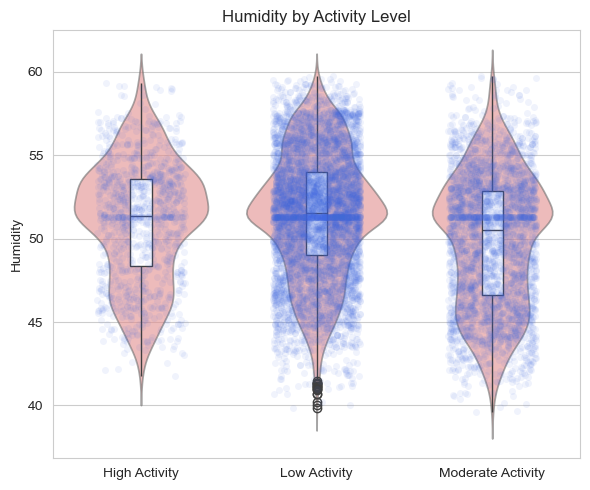


=== Summary statistics ===


,count,mean,median,std_dev,min,max
Activity Level,,,,,,
High Activity,1076,51.08,51.33,3.56,41.78,59.32
Low Activity,5722,51.44,51.54,3.72,39.82,59.77
Moderate Activity,3082,49.86,50.51,3.97,39.61,59.73



=== Normality and variance tests ===
Normality   (min p across groups): 1.637e-19  → NOT normal
Homogeneity (Levene p)           : 9.158e-14  → heteroscedastic

=== Omnibus tests ===
ANOVA: F=175.29, p=1.55e-75, η²=0.034
Kruskal: H=289.89, p=1.13e-63, ε²=0.029
Recommendation : ➜ **Kruskal‑Wallis** at α=0.05

=== Post-hoc comparisons ===
▸ Dunn (Bonferroni-adjusted):


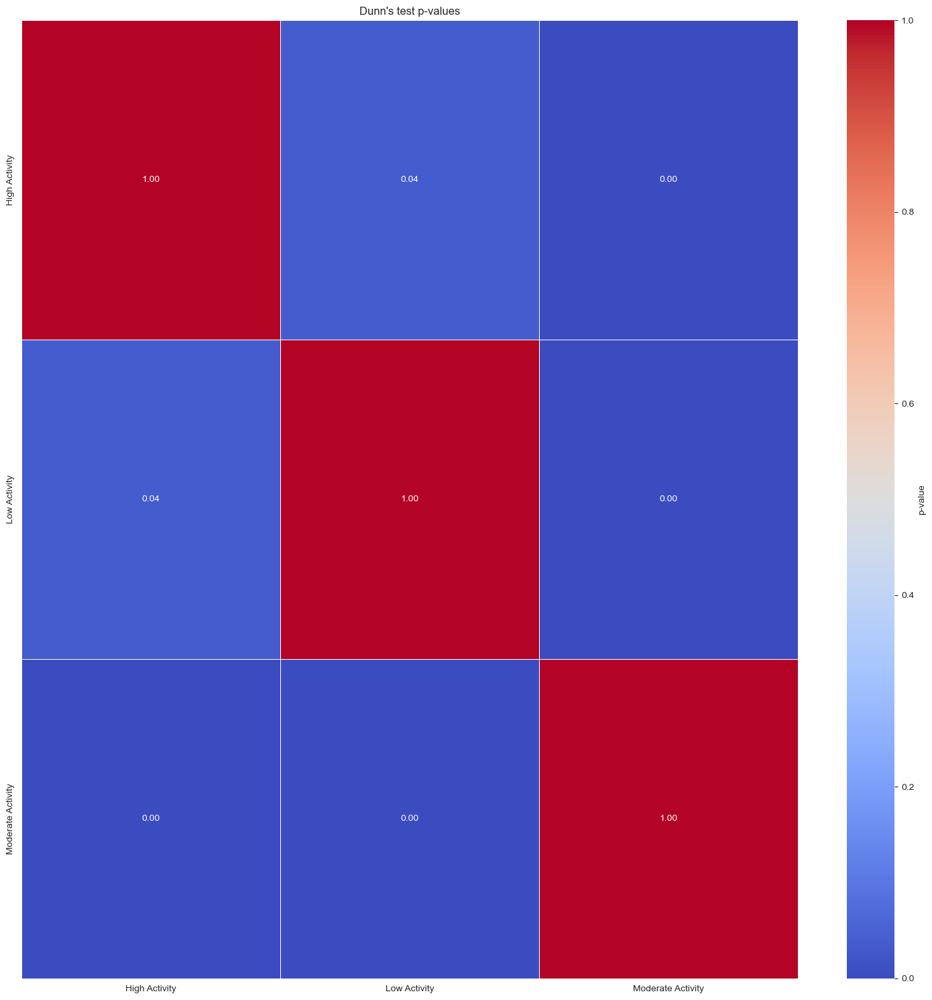

MI (20-bins) = 0.023
----------------------------------------------------------------------------------------------------


In [100]:
plot_num_feature_with_target(df, 'Humidity', target)

**Humidity shows a statistically significant but only small association with activity. Kruskal-Wallis rejects equality of distributions (ε² ≈ 0.03). Bonferroni-adjusted Dunn tests reveal that all three activity levels differ pair-wise (High–Low p = 0.04; High–Mod & Low–Mod p < 0.001), although the High–Low difference is the least pronounced. Mutual information (0.02) and the heavy overlap in the violin plots indicate that humidity alone carries little predictive power; it should be treated as a weak, auxiliary feature in modelling.**

#### Numerical Feature Column: CO2_IR_calibrated with Activity Level

CO2_IR_calibrated ↔ Activity Level


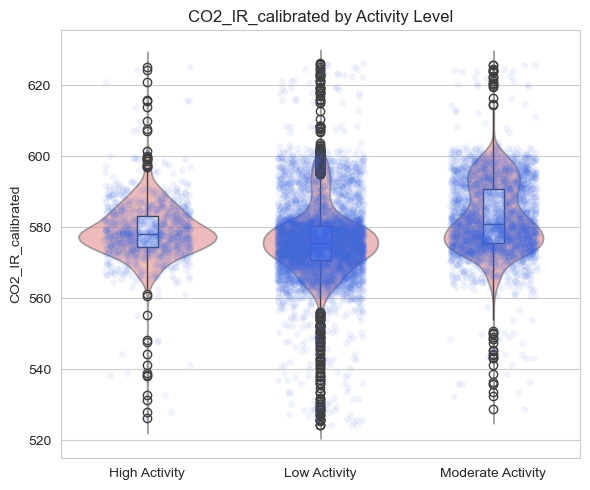


=== Summary statistics ===


,count,mean,median,std_dev,min,max
Activity Level,,,,,,
High Activity,1076,578.79,578.20,8.44,526.12,625.20
Low Activity,5722,576.14,575.53,10.41,524.18,626.24
Moderate Activity,3082,582.56,580.77,10.35,528.91,625.57



=== Normality and variance tests ===
Normality   (min p across groups): 2.233e-42  → NOT normal
Homogeneity (Levene p)           : 7.051e-22  → heteroscedastic

=== Omnibus tests ===
ANOVA: F=398.42, p=3.92e-167, η²=0.075
Kruskal: H=871.51, p=5.66e-190, ε²=0.088
Recommendation : ➜ **Kruskal‑Wallis** at α=0.05

=== Post-hoc comparisons ===
▸ Dunn (Bonferroni-adjusted):


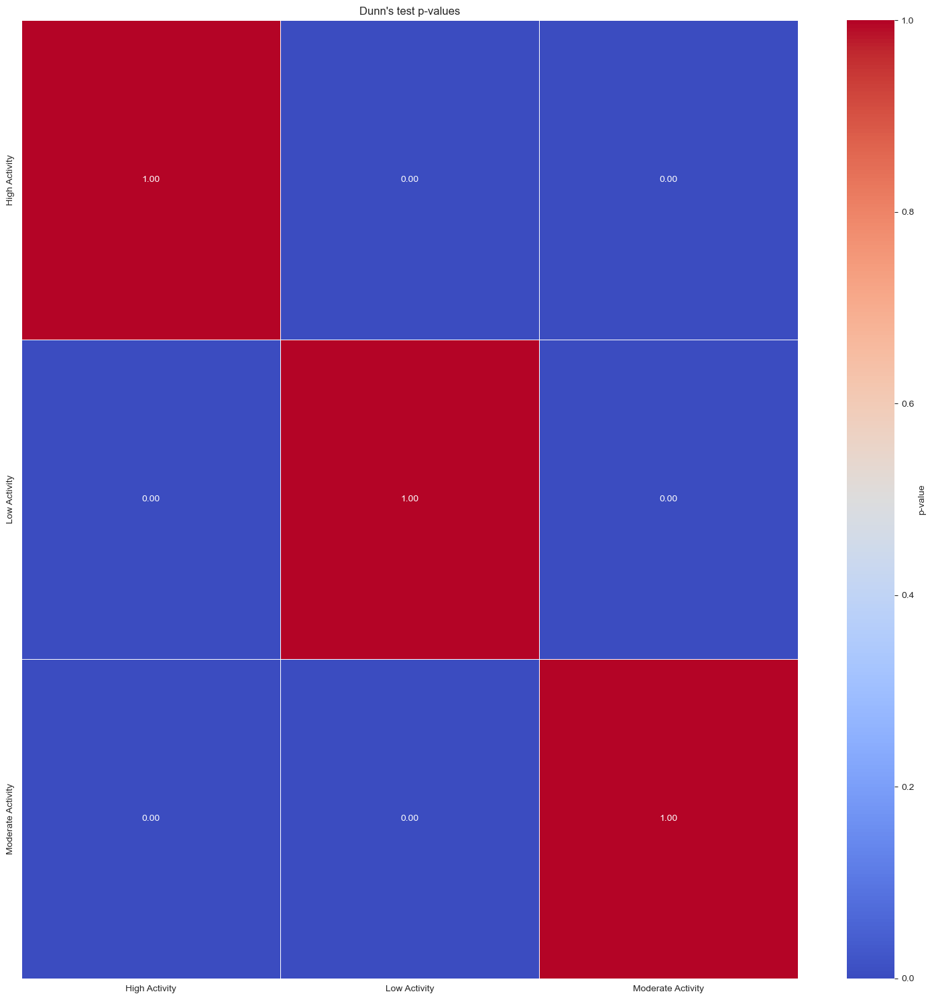

MI (20-bins) = 0.061
----------------------------------------------------------------------------------------------------


In [101]:
plot_num_feature_with_target(df, 'CO2_IR_calibrated', target)

**CO₂ (IR calibrated) is moderately associated with activity level. Kruskal-Wallis rejects equal distributions (ε² ≈ 0.09 — medium effect). Dunn’s post-hoc tests show that High, Low and Moderate activity groups all differ pair-wise (Bonferroni-adjusted p < 0.001). The ordering of group means is Moderate > High > Low, with roughly a 6 ppm spread between extremes. Mutual information of 0.06 indicates CO₂ alone resolves ~6 % of the uncertainty in activity classification – stronger than humidity but still modest, so it should be treated as a supporting rather than primary predictor.**

#### Numerical Feature Column: CO2_InfraredSensor with Activity Level

CO2_InfraredSensor ↔ Activity Level


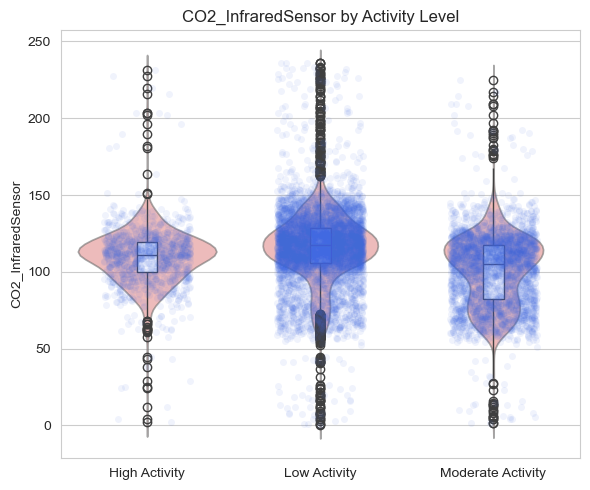


=== Summary statistics ===


,count,mean,median,std_dev,min,max
Activity Level,,,,,,
High Activity,1076,109.78,111.13,19.50,2.49,231.52
Low Activity,5722,115.90,117.30,24.06,0.10,236.01
Moderate Activity,3082,101.05,105.20,23.92,1.65,225.08



=== Normality and variance tests ===
Normality   (min p across groups): 2.233e-42  → NOT normal
Homogeneity (Levene p)           : 7.051e-22  → heteroscedastic

=== Omnibus tests ===
ANOVA: F=398.42, p=3.92e-167, η²=0.075
Kruskal: H=871.51, p=5.66e-190, ε²=0.088
Recommendation : ➜ **Kruskal‑Wallis** at α=0.05

=== Post-hoc comparisons ===
▸ Dunn (Bonferroni-adjusted):


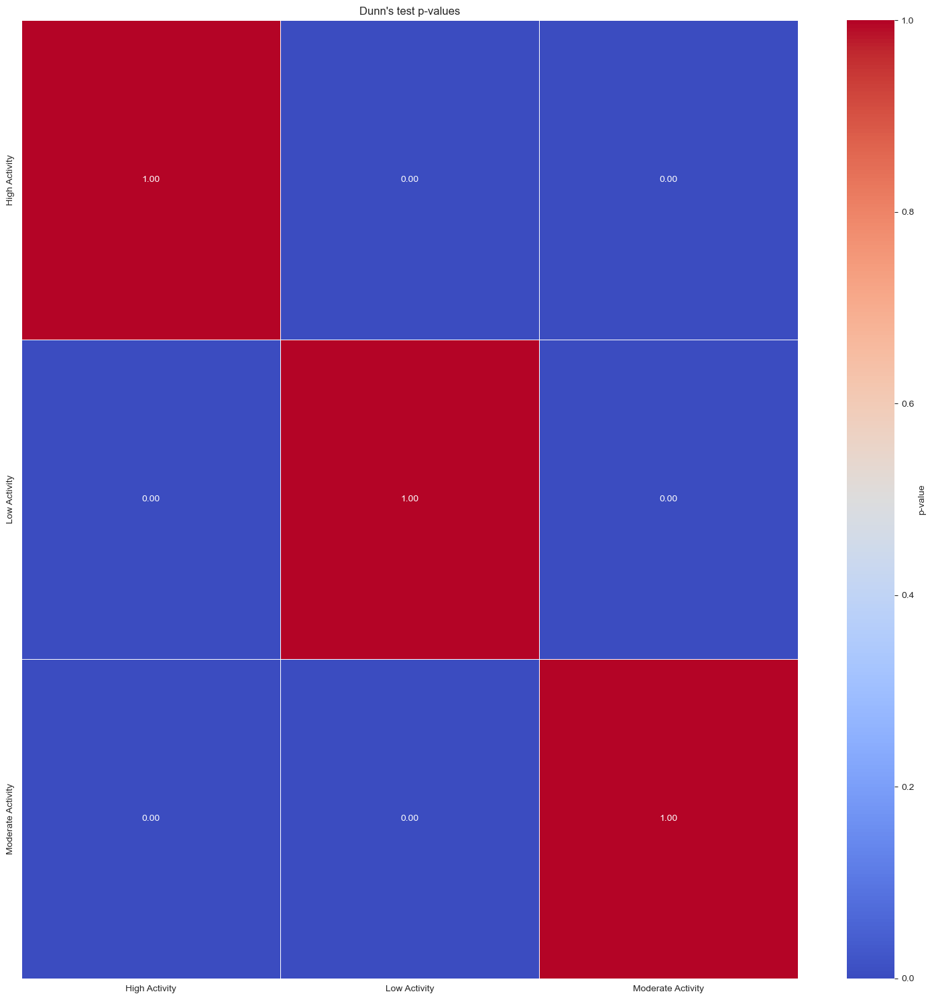

MI (20-bins) = 0.061
----------------------------------------------------------------------------------------------------


In [102]:
plot_num_feature_with_target(df, 'CO2_InfraredSensor', target)

**The conclusion is the same as `CO2_IR_calibrated` as both are similar data with different scale.**

#### Numerical Feature Column: CO2_ElectroChemicalSensor with Activity Level

CO2_ElectroChemicalSensor ↔ Activity Level


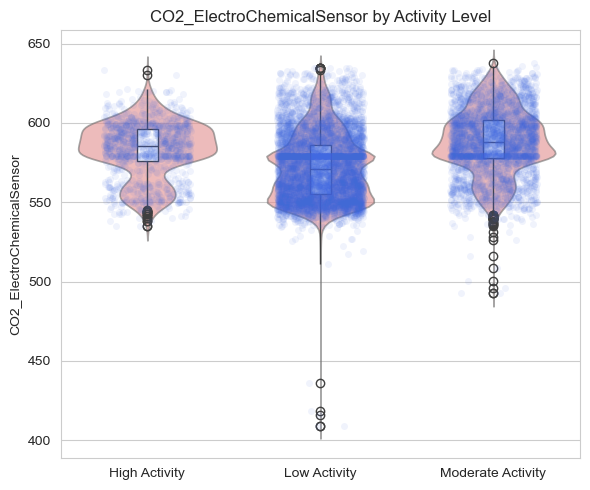


=== Summary statistics ===


,count,mean,median,std_dev,min,max
Activity Level,,,,,,
High Activity,1076,583.06,585.57,17.60,534.71,633.10
Low Activity,5722,572.37,570.96,21.25,408.60,634.91
Moderate Activity,3082,587.99,587.96,20.42,492.58,637.90



=== Normality and variance tests ===
Normality   (min p across groups): 3.457e-36  → NOT normal
Homogeneity (Levene p)           : 9.3e-17  → heteroscedastic

=== Omnibus tests ===
ANOVA: F=604.94, p=1.46e-248, η²=0.109
Kruskal: H=1178.12, p=1.49e-256, ε²=0.119
Recommendation : ➜ **Kruskal‑Wallis** at α=0.05

=== Post-hoc comparisons ===
▸ Dunn (Bonferroni-adjusted):


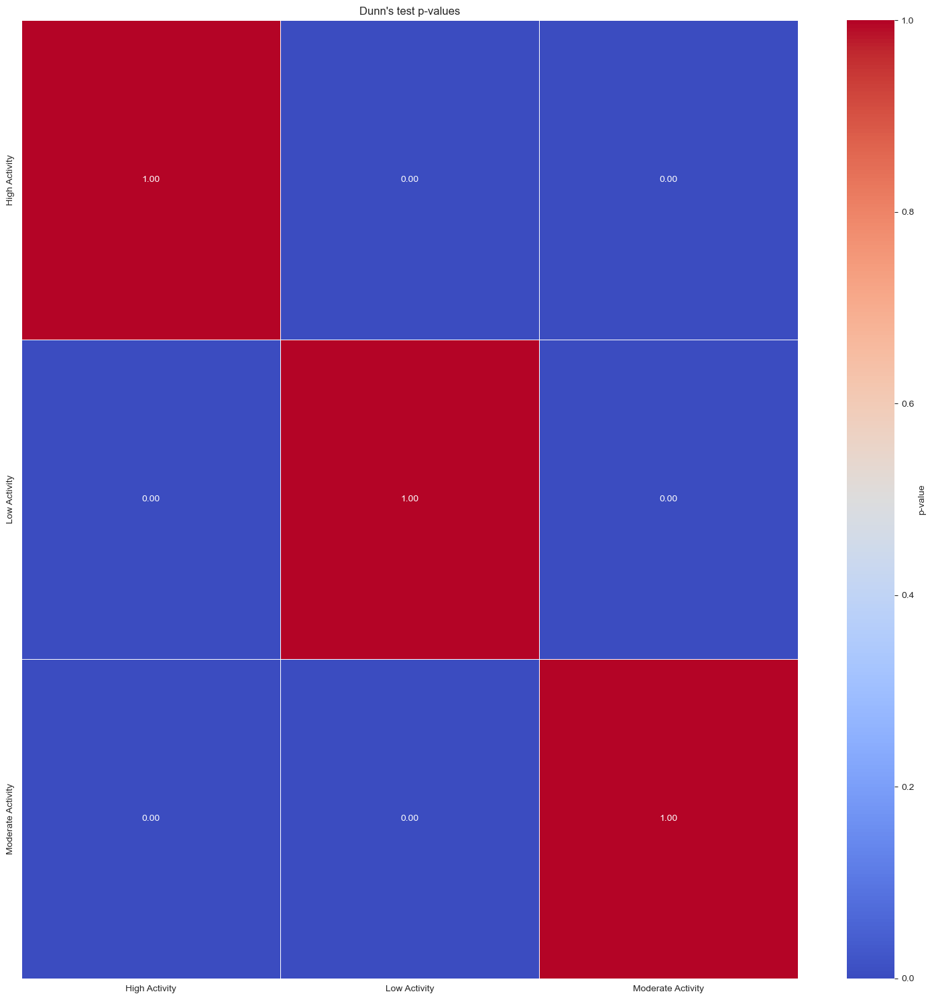

MI (20-bins) = 0.077
----------------------------------------------------------------------------------------------------


In [103]:
plot_num_feature_with_target(df, 'CO2_ElectroChemicalSensor', target)

**CO₂ (Electro-chemical) shows a clear, upper-medium association with activity level.Kruskal–Wallis rejects equal distributions (ε² ≈ 0.12). Bonferroni-adjusted Dunn tests indicate that all three activity levels differ pair-wise. Mutual information is only 0.08, so CO₂-EC alone reduces classification uncertainty by ~8 % — stronger than humidity, comparable to the IR channel, but still best used as a supporting feature. Strong non-normality and heteroscedasticity further justify the non-parametric approach.**

#### Numerical Feature Column: MetalOxideSensor_Unit1 with Activity Level

MetalOxideSensor_Unit1 ↔ Activity Level


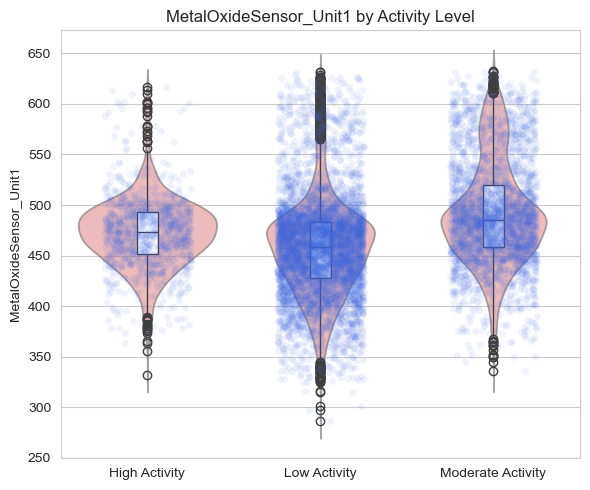


=== Summary statistics ===


,count,mean,median,std_dev,min,max
Activity Level,,,,,,
High Activity,1076,472.44,473.12,34.94,332.33,616.72
Low Activity,5722,458.30,458.94,50.02,286.83,631.37
Moderate Activity,3082,492.31,485.34,51.39,335.91,632.89



=== Normality and variance tests ===
Normality   (min p across groups): 1.875e-29  → NOT normal
Homogeneity (Levene p)           : 8.135e-31  → heteroscedastic

=== Omnibus tests ===
ANOVA: F=482.56, p=1.11e-200, η²=0.089
Kruskal: H=916.87, p=8.02e-200, ε²=0.093
Recommendation : ➜ **Kruskal‑Wallis** at α=0.05

=== Post-hoc comparisons ===
▸ Dunn (Bonferroni-adjusted):


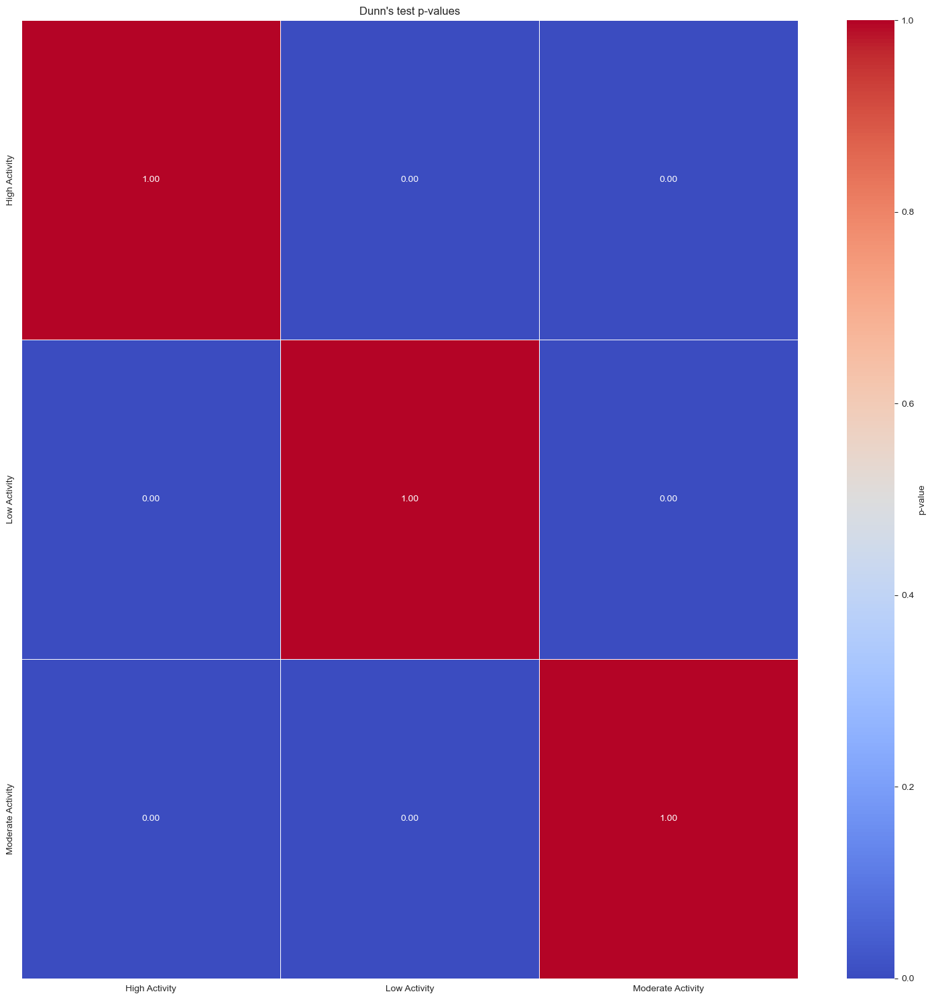

MI (20-bins) = 0.062
----------------------------------------------------------------------------------------------------


In [104]:
plot_num_feature_with_target(df, 'MetalOxideSensor_Unit1', target)

**MetalOxideSensor Unit 1 exhibits a moderate association with activity level. The Kruskal-Wallis test rejects equality of distributions (ε² ≈ 0.093, medium effect). Bonferroni-adjusted Dunn tests show that every pair of activity levels differs significantly (p < 0.001). Group means follow the pattern Moderate > High > Low, with roughly 34 ppm separating the extremes. Mutual information is 0.06, so the sensor by itself explains around 6 % of the uncertainty in activity classification. It should therefore be treated as a supporting, not stand-alone, predictor.**

#### Numerical Feature Column: MetalOxideSensor_Unit2 with Activity Level

MetalOxideSensor_Unit2 ↔ Activity Level


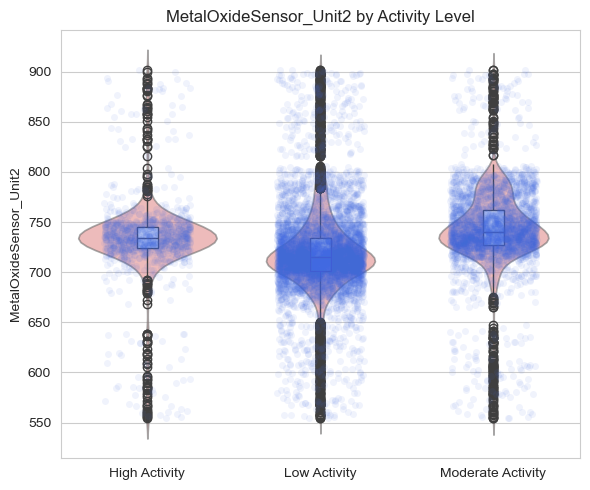


=== Summary statistics ===


,count,mean,median,std_dev,min,max
Activity Level,,,,,,
High Activity,1076,733.45,734.28,40.67,554.35,901.70
Low Activity,5722,719.35,714.90,43.16,554.62,901.62
Moderate Activity,3082,743.20,740.45,40.48,554.28,902.21



=== Normality and variance tests ===
Normality   (min p across groups): 2.655e-50  → NOT normal
Homogeneity (Levene p)           : 1.167e-08  → heteroscedastic

=== Omnibus tests ===
ANOVA: F=330.92, p=7.86e-140, η²=0.063
Kruskal: H=1570.62, p=0, ε²=0.159
Recommendation : ➜ **Kruskal‑Wallis** at α=0.05

=== Post-hoc comparisons ===
▸ Dunn (Bonferroni-adjusted):


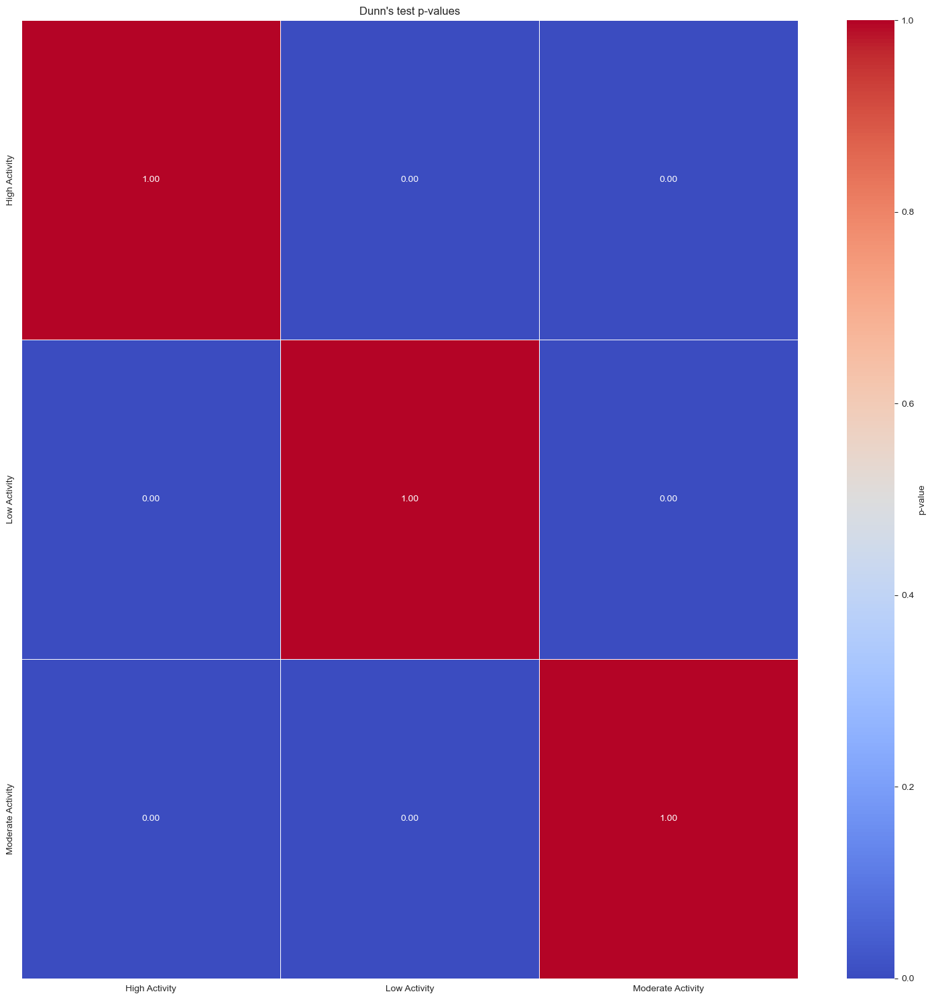

MI (20-bins) = 0.133
----------------------------------------------------------------------------------------------------


In [105]:
plot_num_feature_with_target(df, 'MetalOxideSensor_Unit2', target)

**MetalOxideSensor Unit 2 shows a large association with activity level. Kruskal–Wallis rejects equality of distributions (ε² ≈ 0.159). Bonferroni-adjusted Dunn tests confirm that every pair of activity levels differs significantly (p < 0.001), with group means ordered Moderate > High > Low and about 24 ppm separating the extremes. Mutual information is 0.13, the highest of all sensors examined, meaning this feature alone explains roughly 13 % of the uncertainty in activity classification. While it is the best single predictor so far, substantial overlap in the violins shows it should still be combined with other variables for robust modelling. (Strong departures from normality and equal variance validate the non-parametric approach.)**

#### Numerical Feature Column: MetalOxideSensor_Unit3 with Activity Level

MetalOxideSensor_Unit3 ↔ Activity Level


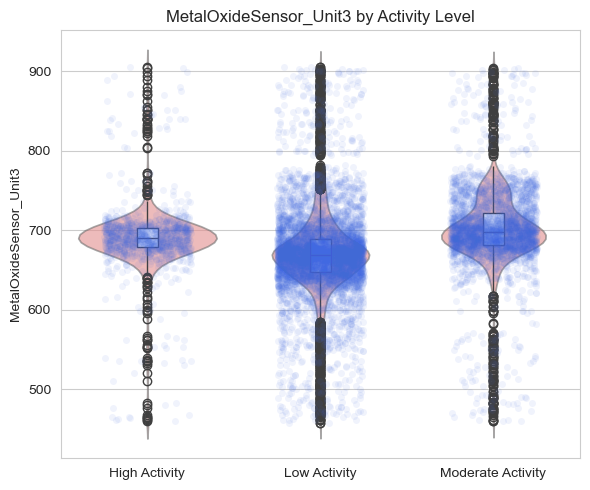


=== Summary statistics ===


,count,mean,median,std_dev,min,max
Activity Level,,,,,,
High Activity,1076,689.61,689.54,43.97,459.64,904.89
Low Activity,5722,669.35,668.29,55.55,457.81,905.15
Moderate Activity,3082,700.95,697.58,50.60,459.66,903.84



=== Normality and variance tests ===
Normality   (min p across groups): 1.655e-49  → NOT normal
Homogeneity (Levene p)           : 8.397e-20  → heteroscedastic

=== Omnibus tests ===
ANOVA: F=372.07, p=1.63e-156, η²=0.070
Kruskal: H=1610.88, p=0, ε²=0.163
Recommendation : ➜ **Kruskal‑Wallis** at α=0.05

=== Post-hoc comparisons ===
▸ Dunn (Bonferroni-adjusted):


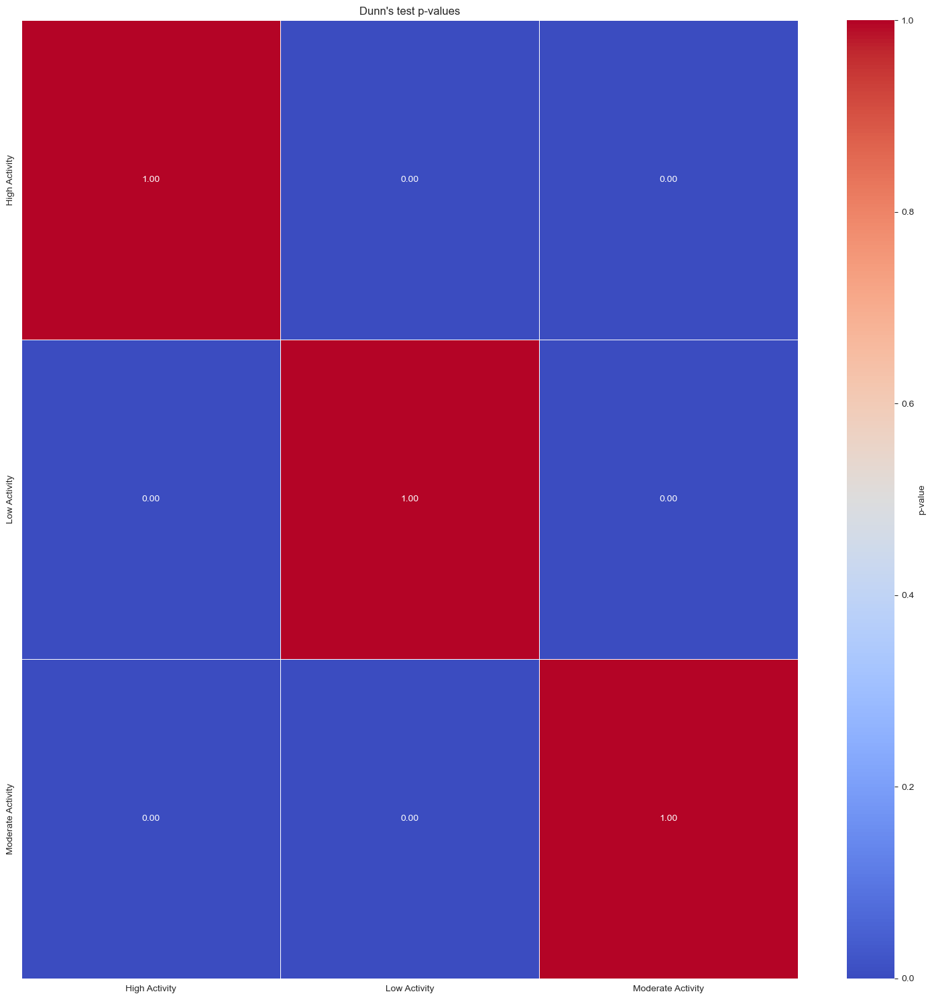

MI (20-bins) = 0.127
----------------------------------------------------------------------------------------------------


In [106]:
plot_num_feature_with_target(df, 'MetalOxideSensor_Unit3', target)

**MetalOxideSensor Unit 3 exhibits a large association with activity level. Kruskal–Wallis rejects equality of distributions (ε² ≈ 0.163), comfortably above the 0.14 “large-effect” threshold. Bonferroni-adjusted Dunn tests show that all three activity levels differ pair-wise (p < 0.001). Group means follow the pattern Moderate > High > Low, with ~32 unit separating the extremes. Mutual information is 0.127—second only to Unit 2—so the sensor by itself explains about 13 % of the uncertainty in activity classification. Despite the strong statistical signal, heavy overlap in the violins and pronounced non-normality/heteroscedasticity mean it should still be combined with other features for robust modelling.**

#### Numerical Feature Column: MetalOxideSensor_Unit4 with Activity Level

MetalOxideSensor_Unit4 ↔ Activity Level


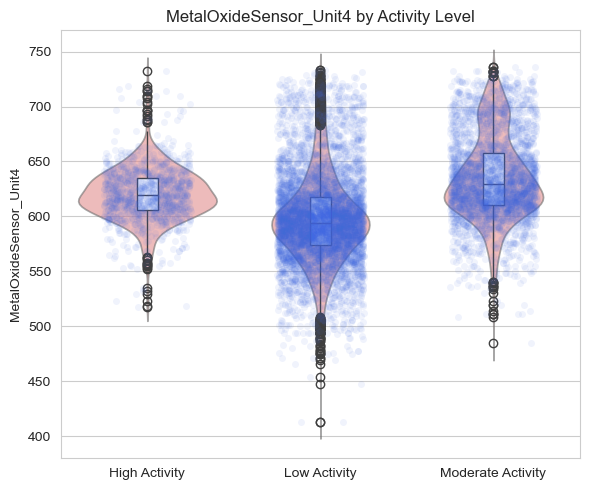


=== Summary statistics ===


,count,mean,median,std_dev,min,max
Activity Level,,,,,,
High Activity,1076,620.17,619.05,24.73,517.22,732.22
Low Activity,5722,598.01,594.32,41.92,412.79,733.14
Moderate Activity,3082,635.28,629.38,38.60,484.65,736.11



=== Normality and variance tests ===
Normality   (min p across groups): 4.728e-29  → NOT normal
Homogeneity (Levene p)           : 4.135e-45  → heteroscedastic

=== Omnibus tests ===
ANOVA: F=923.83, p=0, η²=0.158
Kruskal: H=1899.88, p=0, ε²=0.192
Recommendation : ➜ **Kruskal‑Wallis** at α=0.05

=== Post-hoc comparisons ===
▸ Dunn (Bonferroni-adjusted):


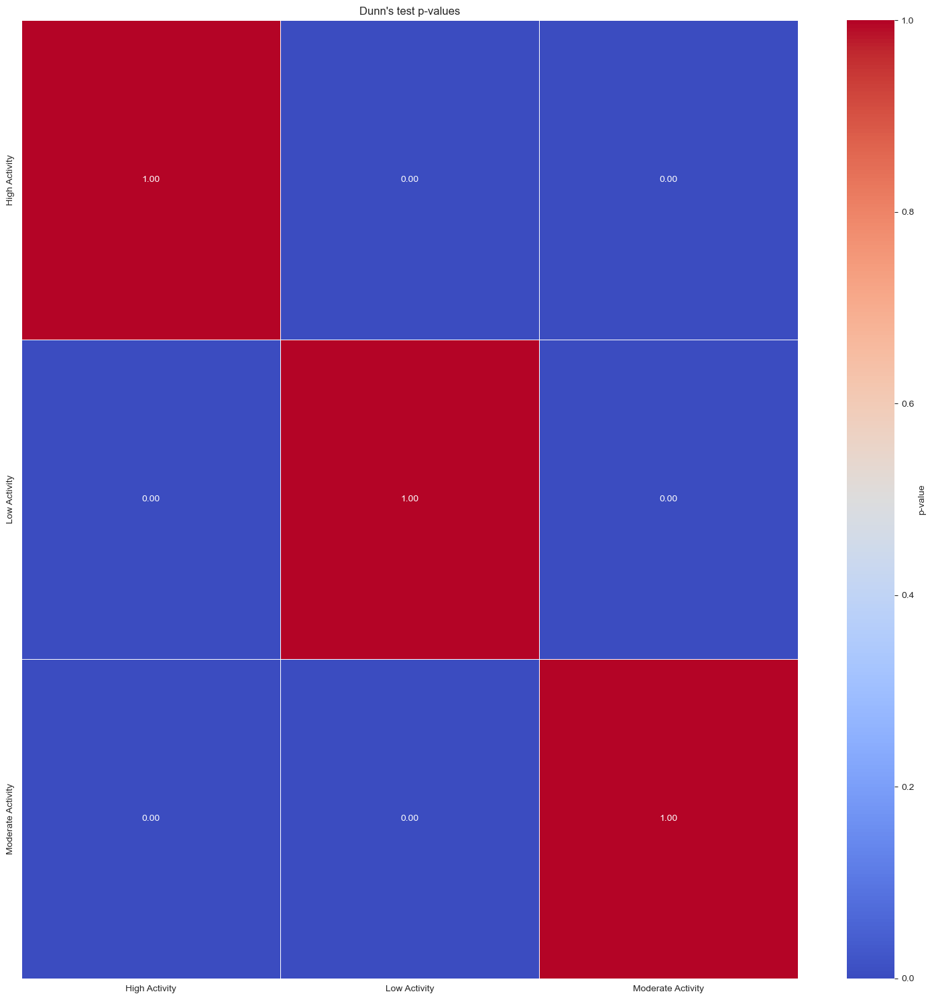

MI (20-bins) = 0.132
----------------------------------------------------------------------------------------------------


In [107]:
plot_num_feature_with_target(df, 'MetalOxideSensor_Unit4', target)

**MetalOxideSensor Unit 4 shows the strongest association of all sensors examined. Kruskal–Wallis rejects equal distributions (ε² ≈ 0.192), well above the 0.14 “large‐effect” benchmark. Bonferroni-adjusted Dunn tests confirm that every pair of activity levels differs (p < 0.001). Group means follow Moderate > High > Low, with roughly 37 sensor units separating the extremes (635 – 598). Mutual information is 0.13, on par with Unit 2 and the highest in the set, so this feature alone explains about 13 % of activity-class uncertainty. Even with this large statistical effect, the substantial overlap in the violin plots plus strong non-normality and heteroscedasticity argue for using Unit 4 as a key but not sole predictor in a multivariate model.**

#### Categorical Bivariate Analysis 

In [108]:
categorical_columns

Index(['Time of Day', 'CO_GasSensor', 'Session ID', 'HVAC Operation Mode',
       'Ambient Light Level', 'Activity Level'],
      dtype='object')

In [109]:
categorical_features = categorical_columns[:-1]
categorical_features

Index(['Time of Day', 'CO_GasSensor', 'Session ID', 'HVAC Operation Mode',
       'Ambient Light Level'],
      dtype='object')

In [110]:
def cat_vs_cat_summary(df, cat_a, cat_b, alpha=0.05):
      # 1. Contingency
      ct = pd.crosstab(df[cat_a], df[cat_b])
      ct_perc = ct.div(ct.sum(axis=1), axis=0)       # row % for heat-map
      display(ct.assign(Total=ct.sum(1)))

      # 2. Heat-map
      fig, ax = plt.subplots(figsize=plot_size_heatmap)
      sns.heatmap(ct_perc, annot=True, fmt=".1%", cmap="Blues")
      plt.title(f"{cat_a} vs {cat_b} (row %)"); plt.show()

      # 3. Chi-square
      chi2, p, dof, exp = chi2_contingency(ct)
      print(f"Chi-square = {chi2:.2f}, dof = {dof}, p = {p:.3g}")

      # 4. Cramér’s V
      n = ct.values.sum()
      cramer_v = (chi2 / (n * (min(ct.shape)-1)))**0.5
      print(f"Cramér’s V = {cramer_v:.3f}  → ",
            "small" if cramer_v<.1 else "medium" if cramer_v<.3 else "large")

      # 5. Residual plot
      resid = (ct - exp) / exp**0.5 # type: ignore
      fig, ax = plt.subplots(figsize=plot_size_heatmap)
      sns.heatmap(resid, center=0, cmap="RdBu", annot=True, fmt=".1f")
      plt.title("Standardised residuals (obs–exp)/√exp"); plt.show()

#### Categorical Feature Column: Time of Day with Activity Level

Activity Level,High Activity,Low Activity,Moderate Activity,Total
Time of Day,,,,
afternoon,282,1315,974,2571
evening,210,1749,497,2456
morning,278,1178,971,2427
night,306,1480,640,2426


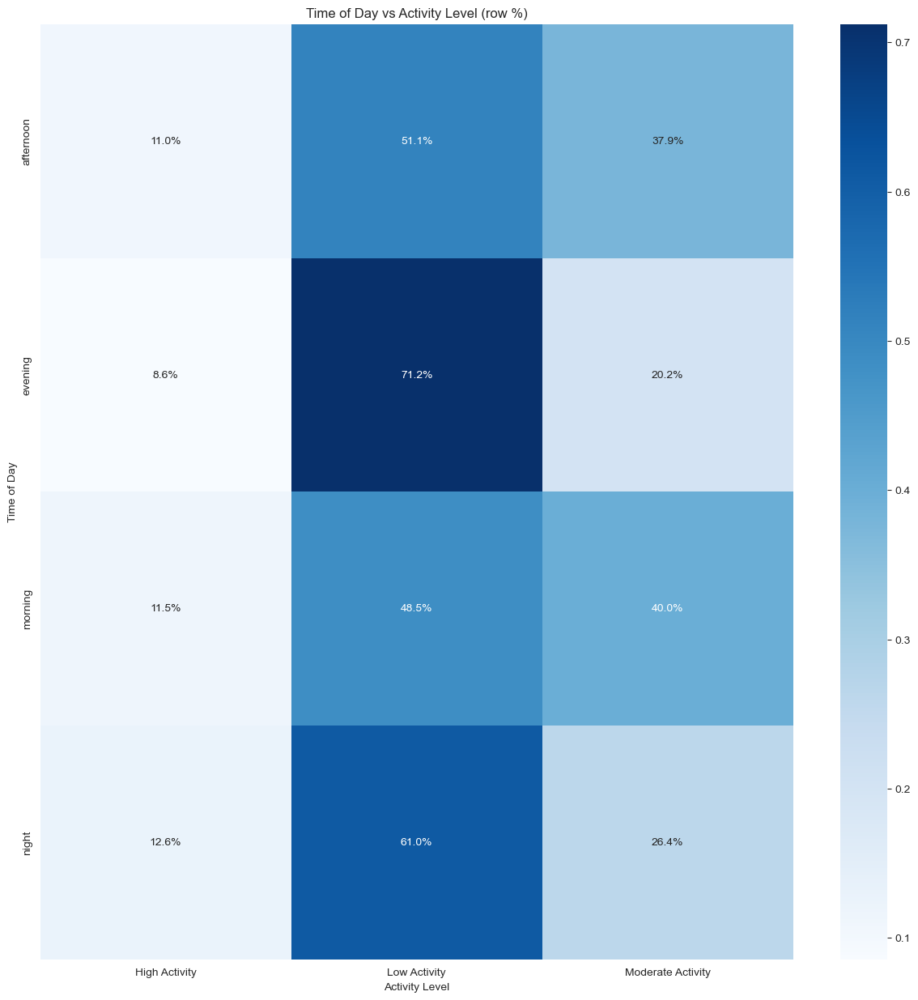

Chi-square = 365.75, dof = 6, p = 6.39e-76
Cramér’s V = 0.136  →  medium


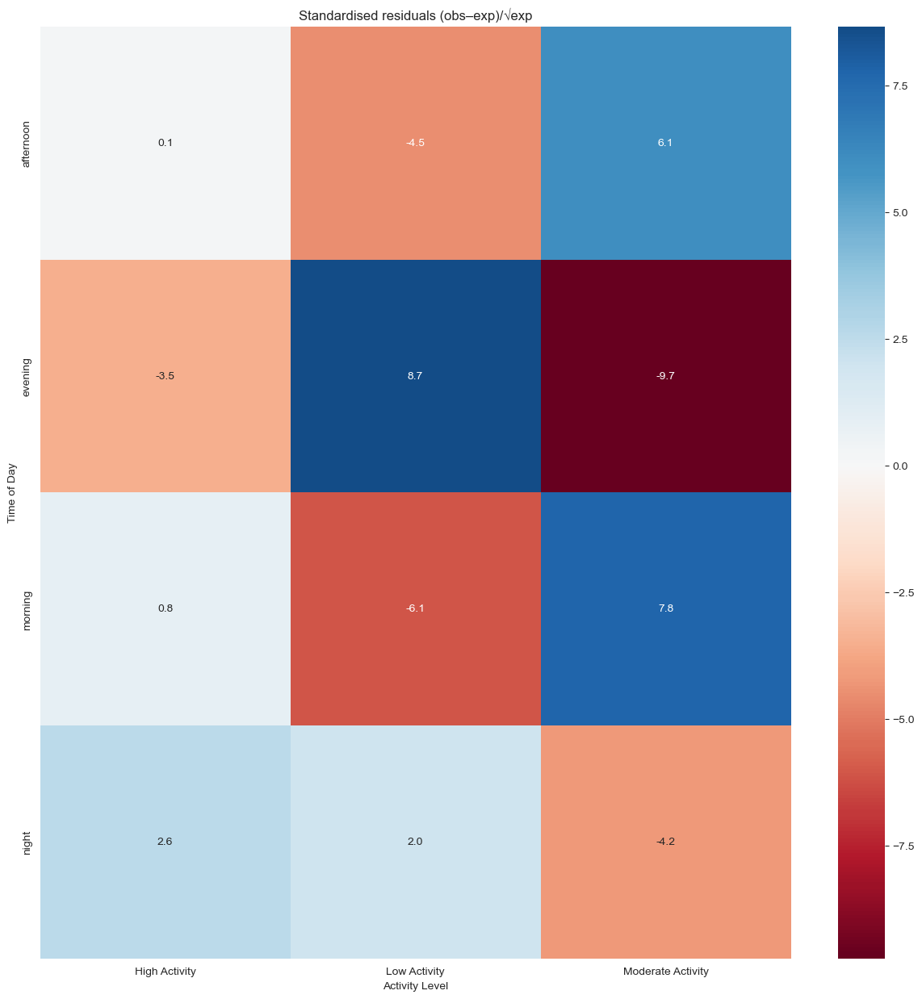

In [111]:
cat_vs_cat_summary(df, 'Time of Day', target)

**Chi Square(6) of = 365.8 (p ≪ 0.001) indicates Time-of-Day and Activity Level are not independent. Cramér’s V = 0.14—medium for $df_{min}$ = 2, which means that the association is meaningful but not dominant. Standardized residuals show a clear pattern: Evenings are low-activity-heavy (+8.7 σ) with a sharp deficit of moderate activity (−9.7 σ), while mornings and afternoons lean the other way (+7.8 σ moderate). Nights have a slight excess of high-activity (+2.6 σ). We will therefore retain Time-of-Day, encoding its four categories as one-hot variables (merging morning and afternoon is an optional simplification). Despite the medium effect, additional environmental features will still be needed for robust prediction.**

#### Categorical Feature Column: CO_GasSensor with Activity Level

Activity Level,High Activity,Low Activity,Moderate Activity,Total
CO_GasSensor,,,,
extremely low,65,425,606,1096
low,668,2034,1590,4292
medium,182,2043,436,2661
high,19,336,40,395
extremely high,0,69,2,71
missing,142,815,408,1365


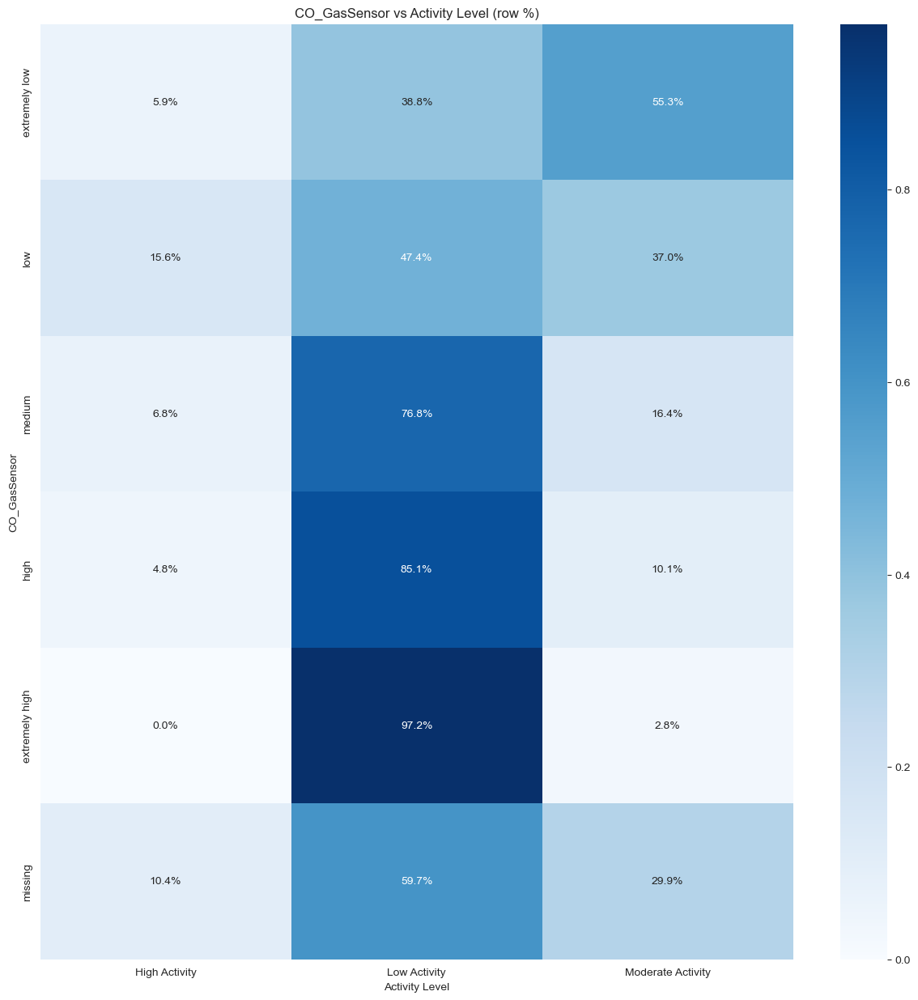

Chi-square = 1070.63, dof = 10, p = 1.13e-223
Cramér’s V = 0.233  →  medium


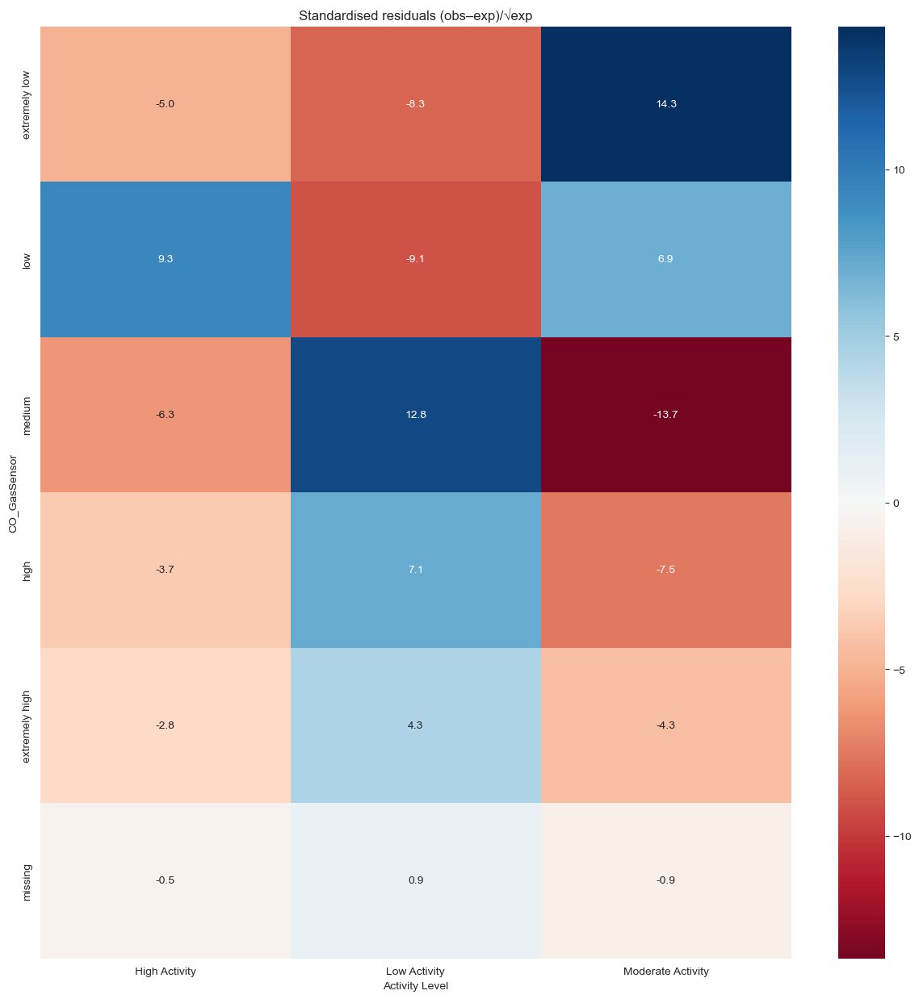

In [112]:
cat_vs_cat_summary(df, 'CO_GasSensor', target)

**Chi Square(10) = 1 070.6, p ≪ 0.001, so CO_GasSensor level and Activity Level are clearly dependent. Cramér’s V = 0.23 (medium for $df_{min}$ = 2), meaning the relationship is meaningful but not overwhelmingly strong.**

**Drivers of the association (standardised residuals):**

- **Low CO readings are over-represented in High-activity records (+9.3 σ) and under-represented in Low-activity (–9.1 σ).**
- **Medium CO is heavily skewed toward Low activity (+12.8 σ) and scarce in Moderate (–13.7 σ).**
- **Extremely-low CO leans sharply toward Moderate activity (+14.3 σ).**

**These imbalances explain most of the chi-square statistic.**

**Feature decision: Keep CO_GasSensor and one-hot encode its six categories. Because the effect is only medium and shows strong asymmetries across classes, we will combine it with other environmental features (e.g., temperature, MOx sensors) or allow tree/boosting models to capture the interaction patterns.**

#### Categorical Feature Column: HVAC Operation Mode with Activity Level

Activity Level,High Activity,Low Activity,Moderate Activity,Total
HVAC Operation Mode,,,,
cooling_active,166,991,526,1683
eco_mode,167,942,509,1618
heating_active,196,969,501,1666
maintenance_mode,195,937,552,1684
off,172,927,522,1621
ventilation_only,180,956,472,1608


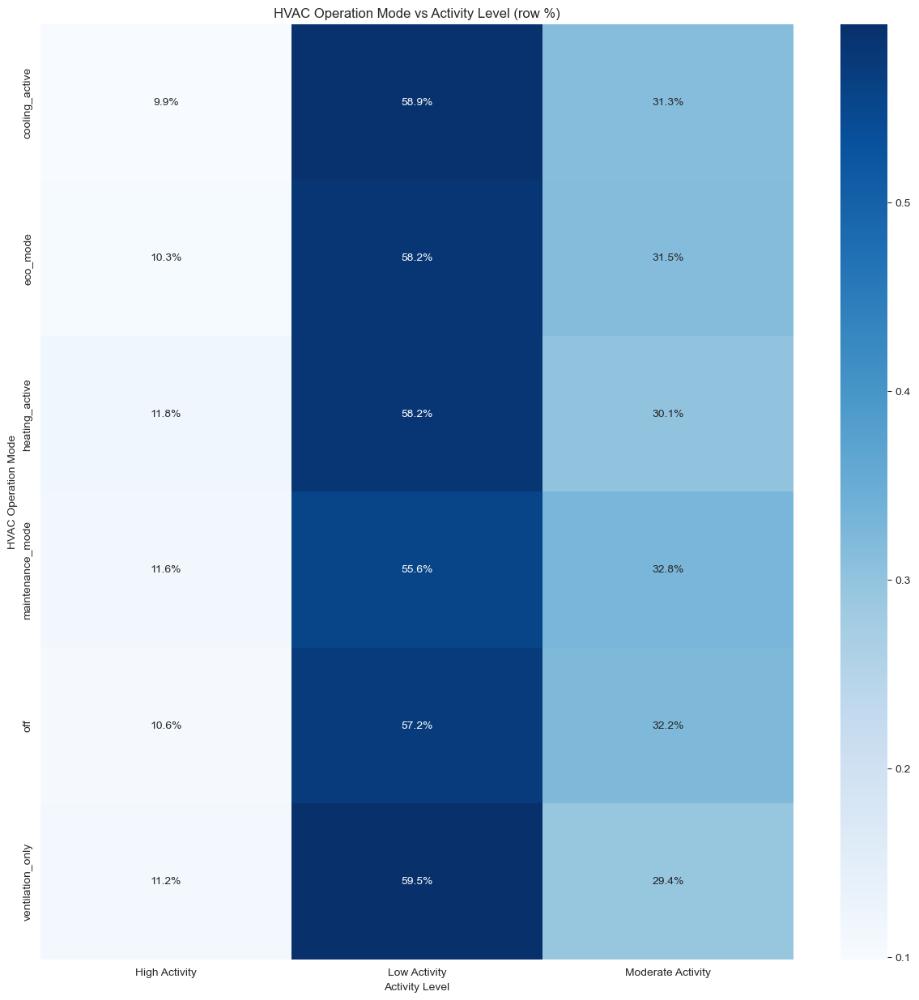

Chi-square = 11.23, dof = 10, p = 0.34
Cramér’s V = 0.024  →  small


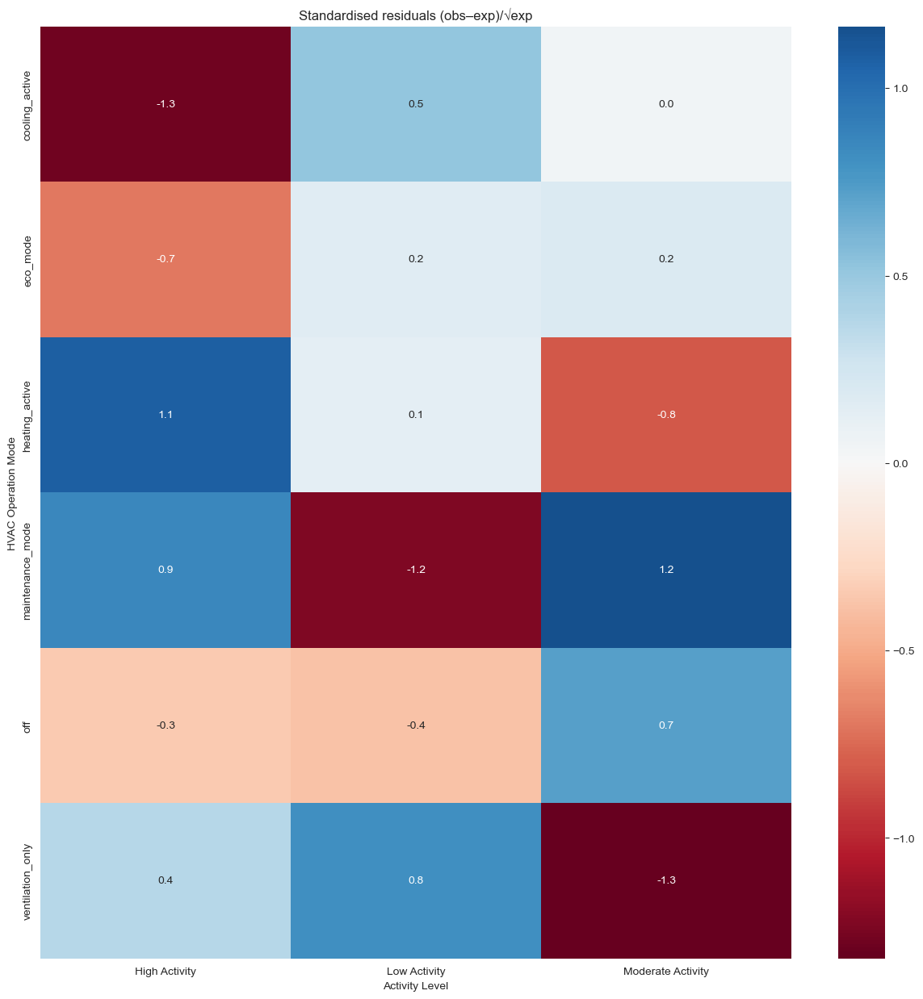

In [113]:
cat_vs_cat_summary(df, 'HVAC Operation Mode', target)

**HVAC Operation Mode shows no meaningful relationship with Activity Level.The chi-square (10) test = 11.2, p = 0.34 fails to reject the null hypothesis of independence, and Cramér’s V is just 0.024 which is small. All standardized residuals lie between –2 and +2, confirming that no individual HVAC mode is notably over- or under-represented in any activity category. Given this negligible association, HVAC Operation Mode can be dropped (or assigned very low weight) unless future domain considerations dictate otherwise.**

#### Categorical Feature Column: Ambient Light Level with Activity Level

Activity Level,High Activity,Low Activity,Moderate Activity,Total
Ambient Light Level,,,,
very_dim,46,252,128,426
dim,88,397,230,715
moderate,127,722,396,1245
bright,242,1247,671,2160
very_bright,309,1638,868,2815
missing,264,1466,789,2519


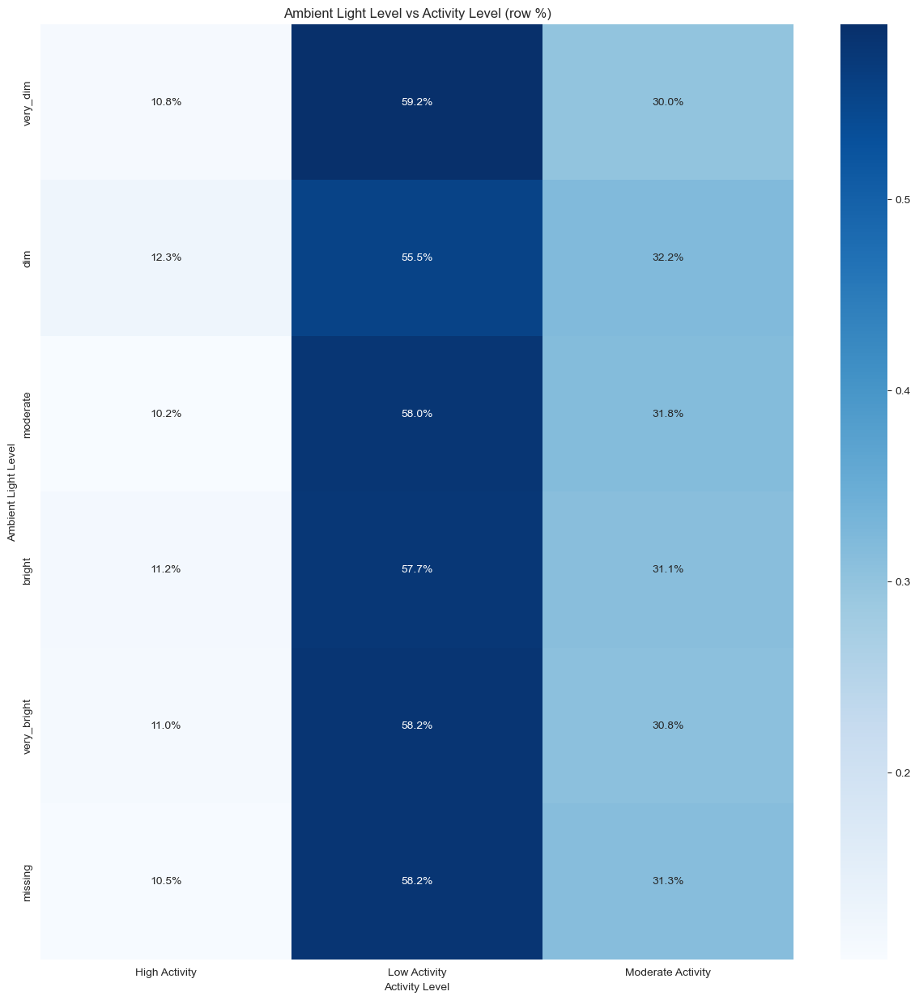

Chi-square = 4.06, dof = 10, p = 0.945
Cramér’s V = 0.014  →  small


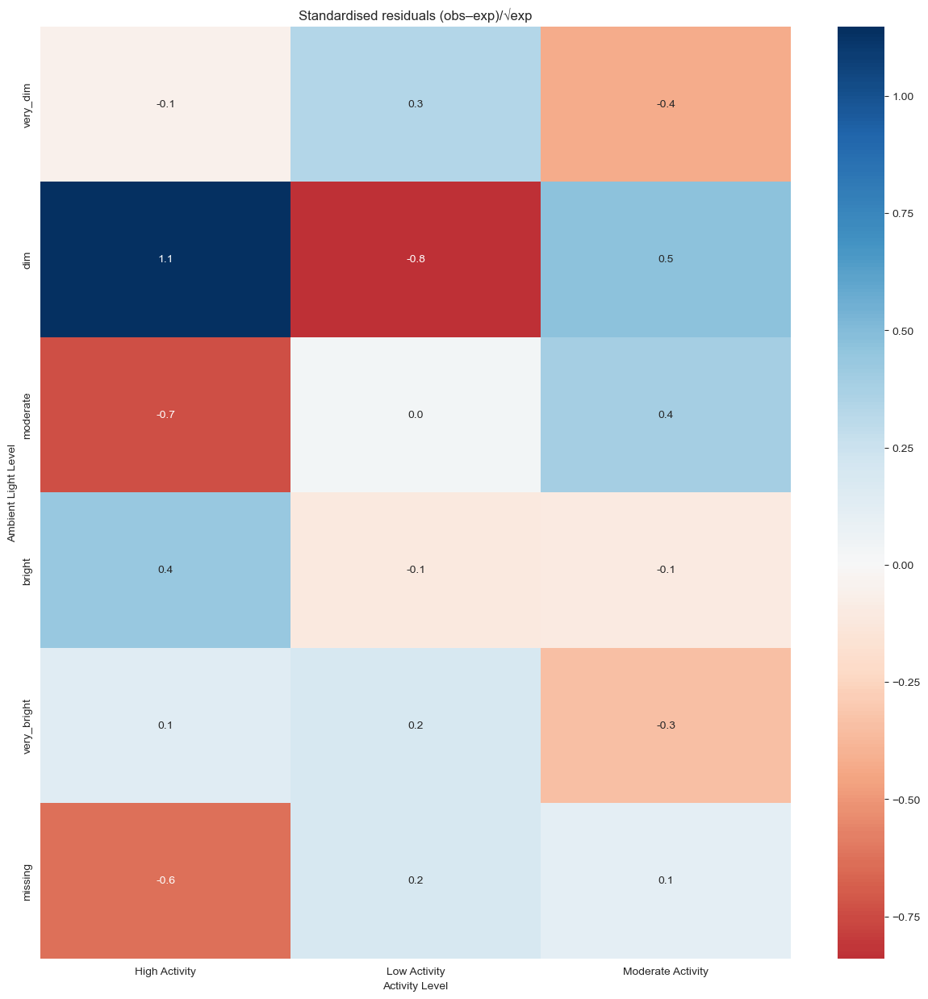

In [114]:
cat_vs_cat_summary(df, 'Ambient Light Level', target)

**Ambient Light Level shows no meaningful association with Activity Level. The chi-square test (χ² (10) = 4.06, p = 0.95) fails to reject the null hypothesis of independence, and Cramér’s V is only 0.014—well inside the “trivial” range. Every standardized residual falls within ±2, indicating that no specific light-level/activity combination is materially over- or under-represented. Given this negligible signal, Ambient Light Level can be safely dropped (or given very low weight) unless future domain constraints suggest otherwise.**

#### Categorical Feature Column: Session ID with Activity Level

Activity Level,High Activity,Low Activity,Moderate Activity,Total
Session ID,,,,
1374,42,143,172,357
1458,11,119,31,161
1482,26,63,74,163
1826,31,153,94,278
1903,18,231,57,306
2105,59,97,179,335
2586,6,26,26,58
2679,44,125,103,272
2847,43,164,140,347


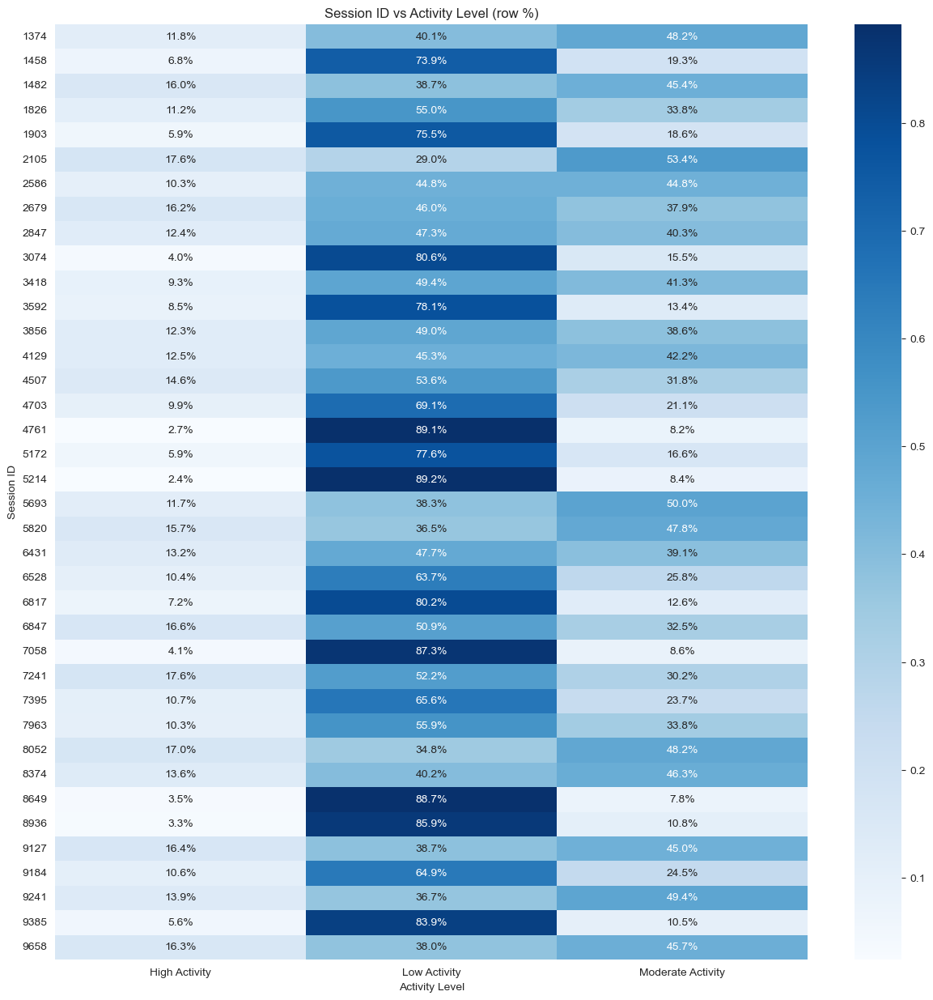

Chi-square = 1405.30, dof = 74, p = 5.98e-245
Cramér’s V = 0.267  →  medium


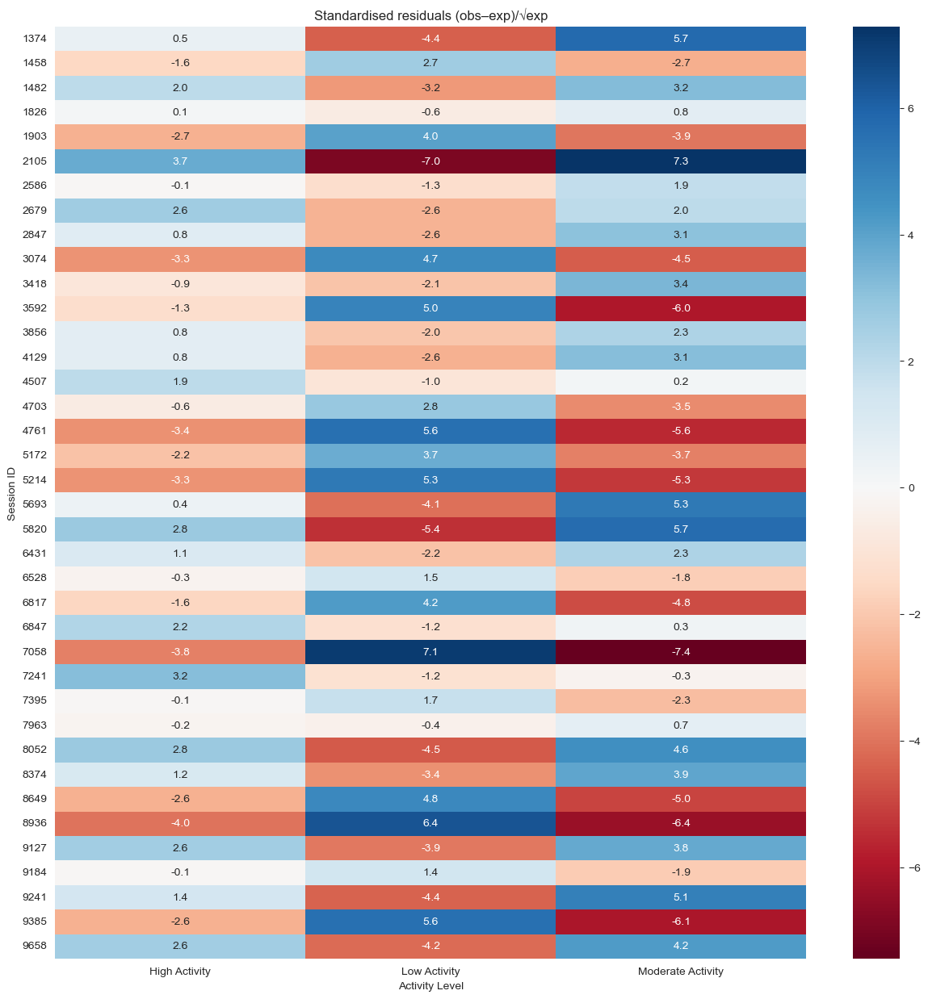

In [115]:
cat_vs_cat_summary(df, 'Session ID', target)

**The chi-square test (χ² (74) = 1 405.3, p ≪ 0.001) rejects independence, and Cramér’s V = 0.27. Given dfₘᵢₙ = 2, this sits at the upper end of the medium band and is approaching “large” (≥ 0.29). For residual pattern, several sessions are heavily skewed toward one class (e.g., ID 3592: Low-activity 78 %, z ≈ +6.4; ID 4761: Low-activity 89 %, z ≈ +6.3), while others tilt toward Moderate or High. These imbalances drive the large χ².**

**Session ID holds meaningful information and warrants further exploration rather than removal. We will conduct drift analysis and may consider session-level cross-validation.**

#### Drift Analysis Between Session ID and Activity Level

In [116]:
def drift_by_session(y, session_id, min_obs=50, sort_ids=True,
                     figsize=(10, 4), cmap='tab20', **kwargs):

    """
    Stacked-area (or bar) plot of class proportions by Session ID.

    Parameters
    ----------
    y : pd.Series
        Target labels (already cleaned, e.g. 'Low'/'Moderate'/'High').
    session_id : pd.Series
        Session / batch identifier, same length as y.
    min_obs : int
        Ignore sessions with fewer than this many rows (keeps noise down).
    sort_ids : bool
        If True, sort Session IDs (numeric or lexicographic) on the x-axis.
        If False, keep the original order of appearance.
    figsize : tuple
        Size of the figure.
    cmap : str
        Matplotlib colormap for the stacked areas.
    """
    # raw counts per (session, class)
    counts = pd.crosstab(session_id, y)
    # keep sessions with at least `min_obs` rows
    big_sessions = counts[counts.sum(axis=1) >= min_obs]
    prop = big_sessions.div(big_sessions.sum(axis=1), axis=0)   # normalise rows

    if sort_ids:
        prop = prop.sort_index()

    prop.plot(kind='area', stacked=True, alpha=0.8, figsize=figsize,
              cmap=cmap, linewidth=0)

    plt.title('Class mix drift by Session ID')
    plt.ylabel('Proportion')
    plt.xlabel('Session ID')
    plt.ylim(0, 1)
    plt.legend(title='Activity Level', loc='upper right')
    plt.tight_layout()
    plt.show()


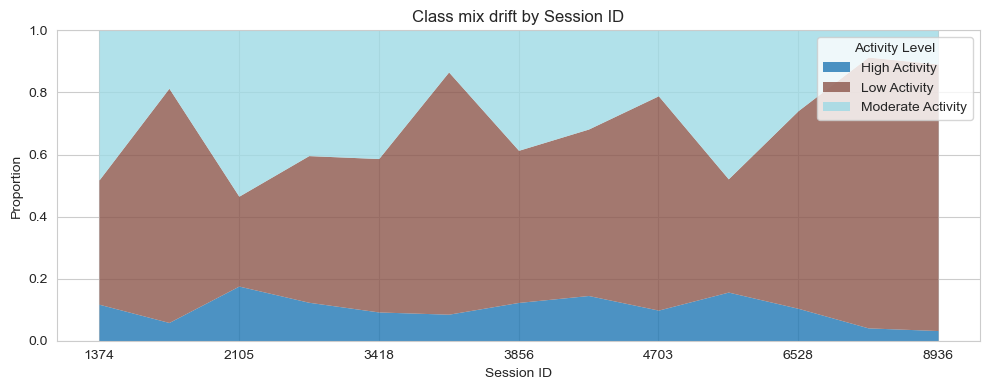

In [117]:
drift_by_session(
    y           = df['Activity Level'],     # cleaned label column
    session_id  = df['Session ID'],         # the session identifier
    min_obs = 300
)

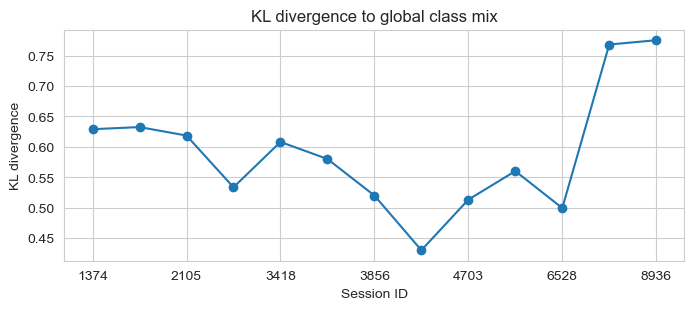

In [118]:
y = df[target]
# global class proportions
global_p = y.value_counts(normalize=True)

# KL divergence of each session ≥ 300 rows
ct = pd.crosstab(df['Session ID'], y)
big = ct[ct.sum(axis=1) >= 300]

proportions = big.div(big.sum(axis=1), axis=0)
kl = pd.Series([entropy(p, global_p) for _, p in proportions.iterrows()], index=proportions.index)

kl.plot(marker='o', figsize=(8,3), title='KL divergence to global class mix')
plt.ylabel('KL divergence'); plt.show()


**If we line up session id with activity level, there is obvious trend forming however we do not know if session id has temporal features in it. We may consider use session id as grouping, it will not be a predictor.**

### Bivariate Analysis Conclusion

**Numerical sensors**
- **CO₂ (IR & EC) – medium to upper-medium effect (ε² ≈ 0.09–0.12).**
- **MOx sensors – Unit 1 medium, Units 2-4 large (ε² ≈ 0.16–0.19).**
- **Humidity – small effect (ε² ≈ 0.03).**
- **Temperature – medium (ε² ≈ 0.10).**
- **Relationships of numerical features are mostly non-linear, thus we favour tree/GBM models**
- **We drop one of the two CO₂-IR columns to avoid redundancy.**

**Categorical sensors**
- **Time of Day and CO_GasSensor show medium association; one-hot encode.**
- **HVAC Mode and Ambient Light Level exhibit trivial association we will consider to drop or give very low weight.**

**Session ID**
- **Strong session-level bias (V ≈ 0.27). We will use it as a grouping / random-effect variable and validate with GroupKFold**
- **We will remove it as a direct predictor unless it demonstrably boosts generalization.**

## Multivariate Analysis - Pair Plot

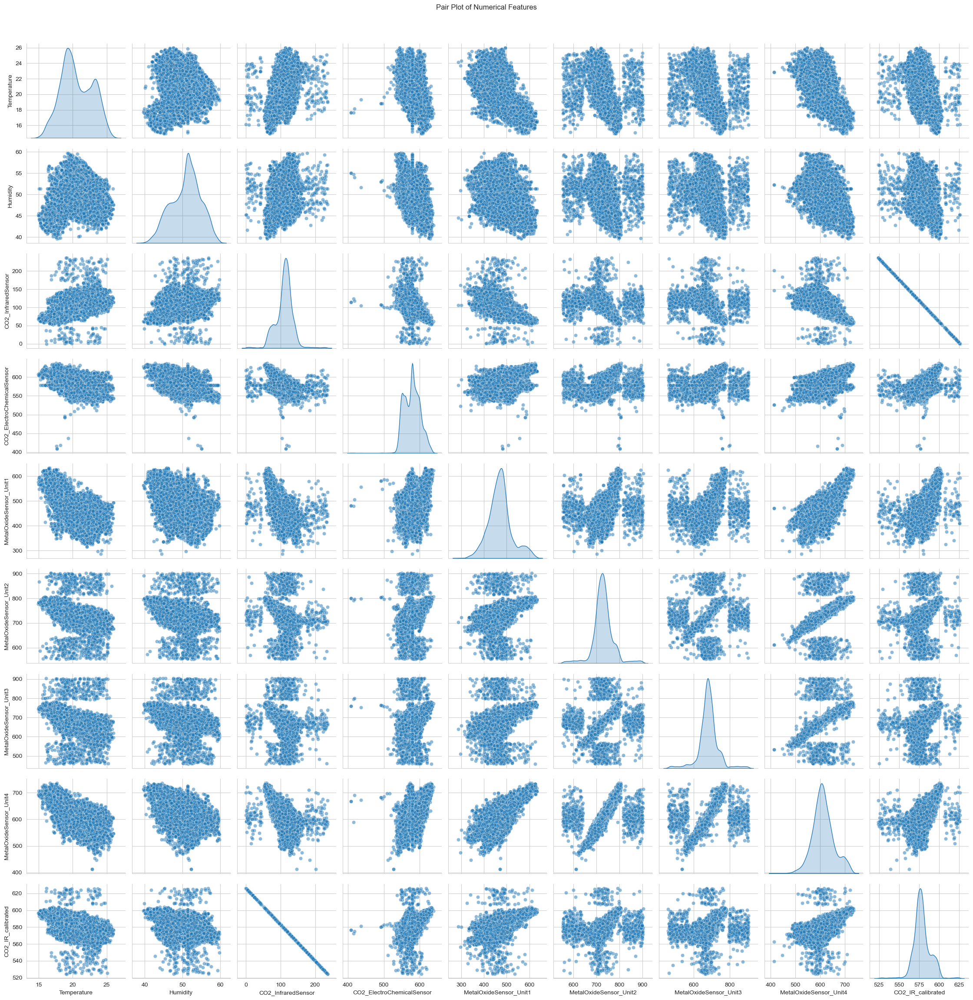

In [119]:
# pair plot
sns.pairplot(df[numerical_features], diag_kind='kde', markers='o', plot_kws={'alpha': 0.5})
plt.suptitle('Pair Plot of Numerical Features', y=1.02)

plt.tight_layout()
plt.show()

- **CO2_InferredSensor and CO2_IR_calibrated are effectively the same signal, we will keep the calibrated column and drop the raw one.**
- **The Metal-Oxide sensors panels form diagonal clouds with Pearson correlations in the 0.35 – 0.60 range.**
- **CO2_ElectroChemicalSensor shows a wedge-shaped, non-linear relationship to the IR channel—weakly correlated at low ppm, saturating at higher levels.**
- **Temperature vs. Humidity, scatter is a round cloud, confirming the two classic comfort variables are essentially uncorrelated in this dataset.**
**Aside from the CO₂-IR duplication, no strong linear relationships exist; most sensor pairs show modest, often curved associations. This convince is to adopt the tree-based model.** 

## Multivariate Analysis - Additional Analysis

### CO2 Sensors Outlier Analysis

398 outliers out of 9880 rows (4.03%)  -  IQR limits: 556.6 / 599.3 ppm


/var/folders/s3/29d7926n31b40hc3rtxz_m_w0000gq/T/ipykernel_1248/3120960356.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset['outlier'] = mask_out.loc[subset.index]


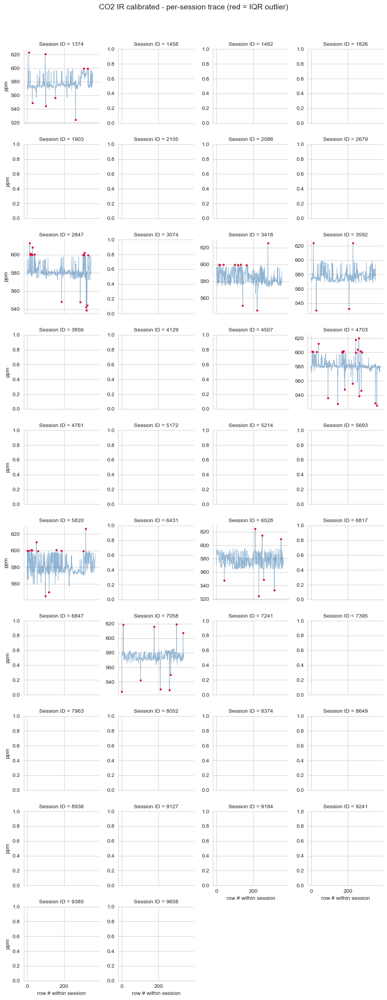

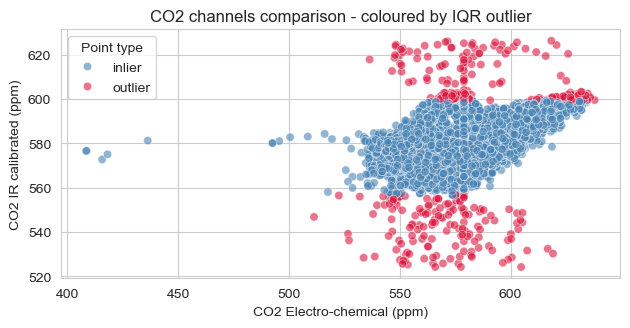

In [120]:
df_co2_outliers = df.copy()
# ---------------------------------------------------------------------
# 1.  build an outlier mask (IQR rule) for CO₂-IR-calibrated
# ---------------------------------------------------------------------
q1, q3 = df_co2_outliers['CO2_IR_calibrated'].quantile([.25, .75])
iqr = q3 - q1
lo, hi = q1 - 1.5 * iqr, q3 + 1.5 * iqr
mask_out = (df_co2_outliers['CO2_IR_calibrated'] < lo) | (df_co2_outliers['CO2_IR_calibrated'] > hi)

print(f"{mask_out.sum()} outliers out of {len(df_co2_outliers)} rows "
      f"({mask_out.mean():.2%})  -  IQR limits: {lo:.1f} / {hi:.1f} ppm")

# ---------------------------------------------------------------------
# 2.  create a 'seq_in_session' column as pseudo-time
# ---------------------------------------------------------------------
df_co2_outliers = df_co2_outliers.sort_values(['Session ID']).copy()         # keep original order if needed
df_co2_outliers['seq_in_session'] = (df_co2_outliers.groupby('Session ID', observed=True)
                          .cumcount())             # 0,1,2,… within each session

# ---------------------------------------------------------------------
# 3.  pick a handful of sessions to plot (longest N or specific list)
# ---------------------------------------------------------------------
topN = 8
big_sessions = (df_co2_outliers['Session ID']
                .value_counts()
                .head(topN)
                .index.to_list())

subset = df_co2_outliers[df_co2_outliers['Session ID'].isin(big_sessions)]

# ---------------------------------------------------------------------
# 4.  line plot per session with outliers highlighted
# ---------------------------------------------------------------------
g = sns.FacetGrid(subset, col='Session ID', col_wrap=4, height=2.5, sharey=False)

def _lines(data, color, **kws):
    sns.lineplot(data=data, x='seq_in_session', y='CO2_IR_calibrated',
                 color='steelblue', lw=.8, alpha=.6, **kws)
    out = data[data['outlier']]
    plt.scatter(out['seq_in_session'], out['CO2_IR_calibrated'],
                color='crimson', s=8, zorder=5)

subset['outlier'] = mask_out.loc[subset.index]
g.map_dataframe(_lines)
g.set_axis_labels("row # within session", "ppm")
g.fig.suptitle("CO2 IR calibrated - per-session trace (red = IQR outlier)",
               y=1.02, fontsize=14)
plt.tight_layout()
plt.show()

# ---------------------------------------------------------------------
# 5.  IR vs electro-chemical scatter with outliers
# ---------------------------------------------------------------------
sns.scatterplot(data=df_co2_outliers, x='CO2_ElectroChemicalSensor',
                y='CO2_IR_calibrated',
                hue=mask_out.map({False: 'inlier', True: 'outlier'}),
                palette={'inlier': 'steelblue', 'outlier': 'crimson'},
                alpha=.6)
plt.gca().set_aspect('equal', adjustable='box')
plt.xlabel("CO2 Electro-chemical (ppm)")
plt.ylabel("CO2 IR calibrated (ppm)")
plt.title("CO2 channels comparison - coloured by IQR outlier")
plt.legend(title='Point type')
plt.tight_layout()
plt.show()


### Correlation Analysis

In [121]:
numerical_features

Index(['Temperature', 'Humidity', 'CO2_InfraredSensor',
       'CO2_ElectroChemicalSensor', 'MetalOxideSensor_Unit1',
       'MetalOxideSensor_Unit2', 'MetalOxideSensor_Unit3',
       'MetalOxideSensor_Unit4', 'CO2_IR_calibrated'],
      dtype='object')

In [122]:
corr_column = df[numerical_features]
corr_matrix_pear = corr_column.corr(method='pearson')
corr_matrix_pear

,Temperature,Humidity,CO2_InfraredSensor,CO2_ElectroChemicalSensor,MetalOxideSensor_Unit1,MetalOxideSensor_Unit2,MetalOxideSensor_Unit3,MetalOxideSensor_Unit4,CO2_IR_calibrated
Temperature,1.000000,-0.083202,0.383558,-0.429338,-0.535753,-0.396886,-0.366276,-0.594952,-0.383558
Humidity,-0.083202,1.000000,0.392163,-0.465372,-0.240953,-0.262152,-0.239300,-0.391173,-0.392163
CO2_InfraredSensor,0.383558,0.392163,1.000000,-0.452028,-0.588944,-0.402957,-0.361335,-0.612891,-1.000000
CO2_ElectroChemicalSensor,-0.429338,-0.465372,-0.452028,1.000000,0.362565,0.387556,0.363279,0.557608,0.452028
MetalOxideSensor_Unit1,-0.535753,-0.240953,-0.588944,0.362565,1.000000,0.474402,0.438935,0.768272,0.588944
MetalOxideSensor_Unit2,-0.396886,-0.262152,-0.402957,0.387556,0.474402,1.000000,0.383598,0.598118,0.402957
MetalOxideSensor_Unit3,-0.366276,-0.239300,-0.361335,0.363279,0.438935,0.383598,1.000000,0.599688,0.361335
MetalOxideSensor_Unit4,-0.594952,-0.391173,-0.612891,0.557608,0.768272,0.598118,0.599688,1.000000,0.612891
CO2_IR_calibrated,-0.383558,-0.392163,-1.000000,0.452028,0.588944,0.402957,0.361335,0.612891,1.000000


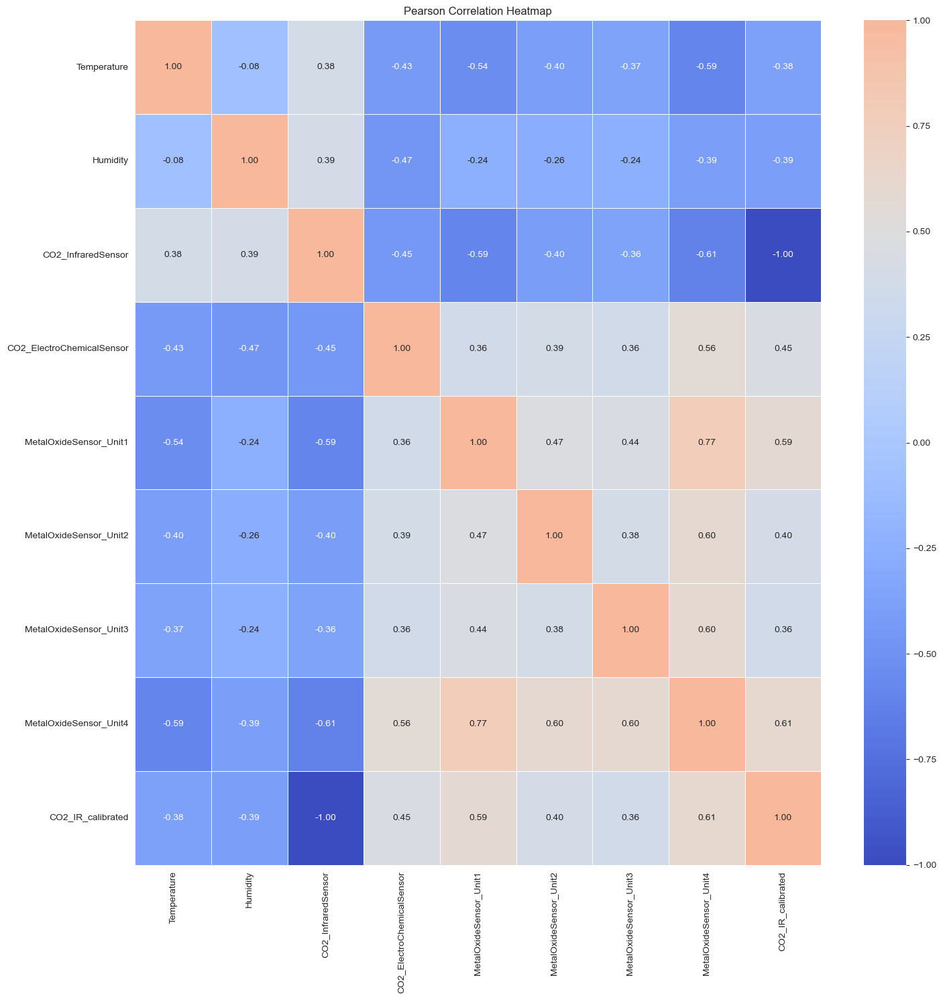

In [123]:
fig, ax = plt.subplots(figsize=plot_size_heatmap)  

sns.heatmap(corr_matrix_pear, annot=True, cmap='coolwarm', vmin=-1, center=0.5, vmax=1, linewidths=0.5, fmt=".2f")

ax.set_title('Pearson Correlation Heatmap')

plt.tight_layout()
plt.show()

- **CO2_InfraredSensor and CO2_IR_calibrated sit on a perfect ±1.00 diagonal. We will keep the calibrated series and drop the raw one to eliminate redundant information and potential numerical warnings.**
- **Metal-oxide block shows substantial collinearity, we will use tree-based model to handle redundancy.**
- **Other numerics are only moderately correlated. Temperature, Humidity, and the two CO₂ channels have largely independent signal.**
- **We will retain all remaining numeric features.** 

In [124]:
spearman_col = df[numerical_features]
spearman_corr = spearman_col.corr(method='spearman')

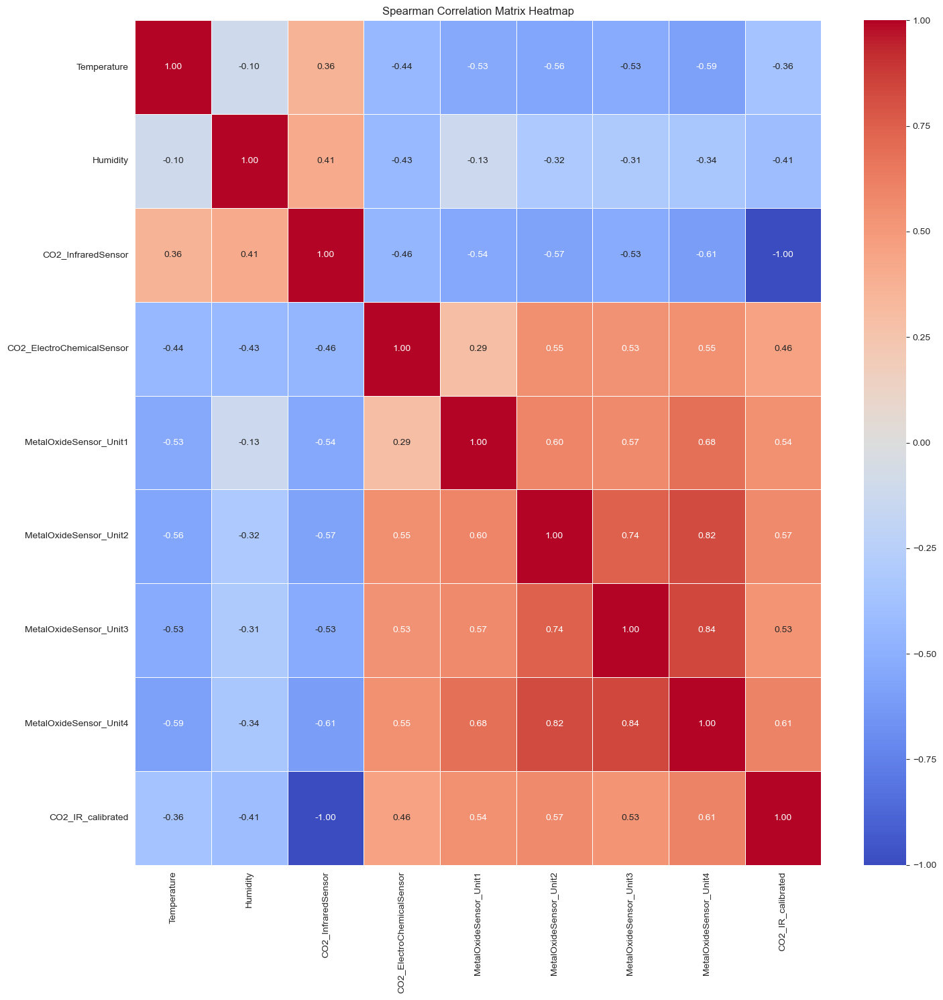

In [125]:
fig, ax = plt.subplots(figsize=plot_size_heatmap)  

sns.heatmap(spearman_corr, annot=True, cmap='coolwarm', vmin=-1, center=0, vmax=1, linewidths=0.5, fmt=".2f")

ax.set_title('Spearman Correlation Matrix Heatmap')

plt.tight_layout()
plt.show()

**Spearman-rank correlations reveal stronger — but still monotonic — links than Pearson did. That tells us the sensor relationships are mostly non-linear yet one-directional—exactly the pattern tree-based or other non-linear models exploit well. In other words, linear models would miss part of the signal, whereas Gradient-Boosted Trees, Random Forests, GAMs, or kernel methods can capture it without extra feature engineering.**

In [126]:
# Compute VIF
from statsmodels.stats.outliers_influence import variance_inflation_factor
def calculate_vif(df: pd.DataFrame, features: list) -> pd.DataFrame:
    """
    Calculate Variance Inflation Factor (VIF) for each feature in the DataFrame.
    
    Args:
        df (pd.DataFrame): DataFrame containing the features.
        features (list): List of feature names to calculate VIF for.
        
    Returns:
        pd.DataFrame: DataFrame with features and their corresponding VIF values.
    """
    vif_data = pd.DataFrame()
    vif_data['Feature'] = features
    vif_data['VIF'] = [variance_inflation_factor(df[features].values, i) for i in range(len(features))]
    return vif_data

vif_df = calculate_vif(df, list(numerical_features))
print(vif_df)

                     Feature          VIF
0                Temperature     2.204857
1                   Humidity     1.849711
2         CO2_InfraredSensor    51.093584
3  CO2_ElectroChemicalSensor     1.891216
4     MetalOxideSensor_Unit1     2.752870
5     MetalOxideSensor_Unit2     1.579860
6     MetalOxideSensor_Unit3     1.569319
7     MetalOxideSensor_Unit4     4.642501
8          CO2_IR_calibrated  3494.732414


In [127]:
vif_df = calculate_vif(df, numerical_features.drop('CO2_InfraredSensor').to_list())
print(vif_df)

                     Feature          VIF
0                Temperature   123.127824
1                   Humidity   178.184508
2  CO2_ElectroChemicalSensor  1116.588387
3     MetalOxideSensor_Unit1   229.444939
4     MetalOxideSensor_Unit2   440.374997
5     MetalOxideSensor_Unit3   243.416440
6     MetalOxideSensor_Unit4   945.951387
7          CO2_IR_calibrated  2575.002125


**VIF above 10 is a major problem. VIF between 5 to 10 is also a concern. VIF shows that high multicollinearity between each numerical features with Temperature and Humidity faring the lowest, confirming our diagnosis. However, we will be using tree-based model, thus VIF should not be a concern.**

**We should be concern if we are using linear model, if we are using tree-based model, VIF is not much of an issue.**

## EDA Findings

### Data Quality Issues and Data Cleaning

- **About 1.2% of the dataset was duplicated. It was removed based on the assumption of data processing error. Impact is minimal.**
- **There are anomaly for the sensor `Temperature`, `Humidity` and `CO2_InfraredSensor`.** 
- **The max of the temperature is `298` which is not possible. We suspect that this could be Kelvin to Celsius conversion issue. Box plot analysis shows that there are a bunch of temperature between 270 and 300. This confirm our suspicion that it is due to conversion error from Kelvin to Celsius. In addition, we will set additional limit that will remove impossible temperature such as temperature lower than -30 degree and temperature above 60 degree. There is no such temperature for now, but we include it for future as guard rails** 
- **For humidity, it should range from 0 to 100. Anything outside this range is sensor error. We will set to `np.nan`.** 
- **There should be no CO2 that is below zero. This also indicate as sensor error. We will fixed those sensor error that return less than 0 by setting to `np.nan`.**
- **We need to convert `HVAC Operation Mode` to lower case.**
- **We need to convert `None` to `np.nan` for `CO_GasSensor` and `Ambient Light Level`.**
- **We need to rename `ModerateActivity` to `Moderate Activity` and `Low_Activity` & `LowActivity` to `Low Activity`.**

**CO2 IR Abnormal Readings**
- **The reading of CO2 IR range from 0 - 236. This range is not normal as normal outdoor environment, we have above 400ppm. Indoor typically range from 500 - 800 or higher.**
- **We suspect that the sensor is still in binary mode (0-255) and it has not been converted to ppm.**
- **We confirm that both sensors are negatively correlated. To remediate the problem of anomaly of CO2 IR sensor, we perform a simple linear regression prediction using `CO2_InfraredSensor` and `CO2_ElectroChemicalSensor`. We will use CO2 EC to predict CO2 IR. A new column called `CO2_IR_calibrated` will be created.**

### Missing Values and Imputation Strategy 

- **We have more missing data as we have set `Humidity` to `np.nan` if it is below 0 and above 100. We also set CO2 IR for those sensor below 0 as NA. The same will applies to the calibrated CO2 IR sensor. In total, we have 7 features with missing values.** 
- **The statistics confirm that our missing values are MCAR.**
- **For MetalOxideSensor, all are correlated, therefore we can use iterative imputer with Random Forest Regressor.**  

| Features | Imputation Strategy | Missing Value % | Explanation |
| --- | --- | --- | --- |
| CO2_InfraredSensor | Mean | 0.222672 | Missing data less than 1% | 
| CO2_IR_calibrated | Mean | 0.222672 | Missing data less than 1% |
| Humidity | Median | 5.091093 | Missing data less than 10%, missing flag added |
| CO2_ElectroChemicalSensor | Median | 7.135628 | Missing data less than 10%, missing flag added |
| MetalOxideSensor_Unit3 | Iterative Imputer (RF Regressor) using other metal oxide sensor | 25.850202 | MetalOxideSensor are highly correlated with each other. Missing flag added. |
| CO_GasSensor | Convert NAN to `missing` | 13.815789 | `missing` as part of ordinal group. Use Ordinal encoding for tree-based model and One-Hot for linear model. Add missing flag. |
| Ambient Light Level | Convert NAN to `missing` | 25.495951 | `missing` as part of ordinal group. Use Ordinal encoding for tree-based model and One-Hot for linear model. Add missing flag.|

### Target Analysis: Moderately Imbalance

| subject | data | explanation |
|---|---|-----|
| Imbalance ratio | **≈ 5.32 : 1** | *Mild-to-moderate imbalance.* Consider class weights or SMOTE-NC, but not dire. (calculation = 5722/1076) |
| Majority-class accuracy | **0.579** | If we predict only `Low Activity`, we have accuracy of 58%. (5722/9880) Any model must beat 58 % accuracy; better use **macro-F1** or log-loss as main metric. |
| Shannon Entropy | **≈ 1.23 bits (max 1.58)** | Our labels carry about 84% of the maximum uncertainty, class is imbalance but not severely. (1.23/1.58) In normal even class with 1/3, entropy is 100. 84% shows quite random, not so imbalanced.|
| Inverse-Herfindahl | **≈ 2.25 / 3 classes** | Dataset behaves like it contains the equivalent of 2¼ perfectly balanced classes out of 3 — a concise, bounded measure of imbalance. |
| Minority per 5-fold CV | **≥ 215** | Safe: every fold has > 200 “High Activity” rows, so metrics are stable. |

### Univariate

**Numeric features**

- **Most variables show roughly symmetric, bell-shaped distributions, but a few sensors (e.g., MOx units, CO₂ channels) are multi-modal.**
- **Outliers are abundant, especially in gas-sensor readings.**


**Categorical features**

- **Cardinality is modest for all engineered buckets (Time-of-Day, CO_GasSensor levels, HVAC modes, Ambient-Light levels). Only Session ID is high-cardinality (≈40 unique IDs).**
- **Sparse categories occur in a few variables (e.g., CO_GasSensor = “extremely high”).**
- **Session ID need to be investigate further.**

### Bivariate

**Numerical sensors**
- **CO₂ (IR & EC) – medium to upper-medium effect (ε² ≈ 0.09–0.12).**
- **MOx sensors – Unit 1 medium, Units 2-4 large (ε² ≈ 0.16–0.19).**
- **Humidity – small effect (ε² ≈ 0.03).**
- **Temperature – medium (ε² ≈ 0.10).**
- **Relationships of numerical features are mostly non-linear, thus we favour tree/GBM models.**
- **We will drop one of the two CO₂-IR columns to avoid redundancy.**

**Categorical sensors**
- **Time of Day and CO_GasSensor show medium association; one-hot encode.**
- **HVAC Mode and Ambient Light Level exhibit trivial association we will consider to drop or give very low weight.**

**Session ID**
- **If we group the data by session level, there seems to be a relationship between session ID and the activity level.** 
- **There is a very high possibility that we will received data by Session ID.**
- **If that is the case, then we need to training them in groups.**
- **We will use it as a grouping by splitting the data using `GroupShuffleSplit` and use `Session ID` as groups.**
- **Next we will use `Session ID` group for cross validation fold using `StratifiedGroupKFold`.**
- **We will remove it as a direct predictor, as it may cause data leakage.**

### Model Selection Based on EDA Findings

- **Base on the analysis and evidence above, we decided to use tree-based modeling as our main modeling class.** 
- **As an academic analysis, we may perform Logistic Regression for sanity check.**
- **For tree-based model, Decision Tree will be our baseline model.**
- **We will also explore ensemble techniques and gradient boosting model for optimal prediction.**

### Assumption Made

The following are assumption made that may need to confirm with the data owners:

- **Data duplication are data processing errors.**
- **Some temperature anomaly are data processing errors that failed to convert from Kelvin to Celsius**.
- **Anomaly for humidity sensors are sensors error.**
- **All other sensors that has a below 0 reading is an error.**
- **`CO2_InfraredSensor` are not calibrated, the number we had are still in binary format.**
- **Sensors are collected by `Session ID` and we will received new updates by batches based on `Session ID`.** 

## Feature Engineering: Temperature–Humidity

## Temperature–Humidity Feature Engineering

### Purpose
To enhance model performance by deriving domain-informed interaction features from the raw `Temperature` and `Humidity` measurements.

---

### Input Features
- `Temperature`
- `Humidity`

---

### Engineered Features

| Feature Name           | Formula                         | Description                                        |
|------------------------|----------------------------------|----------------------------------------------------|
| `heat_index`           | `T + 0.33 × RH − 4`              | Approximates thermal comfort (indoor simplification) |
| `dew_point`            | `T − (100 − RH) / 5`             | Estimated dew point (moisture content in air)       |
| `T_mul_RH`             | `T × RH`                         | Raw interaction term to capture non-linearity       |

---

### Processing Steps

1. **Imputation**
   - `Humidity` is imputed using median strategy.
   - `Temperature` is assumed to have no missing values and passed through unchanged.

2. **Feature Engineering**
   - Performed using a custom `TempHumEngineer` transformer.
   - Output includes 3 new features listed above.

3. **Scaling**
   - Applied only for linear models (via `StandardScaler`).
   - Skipped entirely for tree-based models (e.g., Random Forest, XGBoost).

---

### Evaluation Notes

- `T_mul_RH` consistently ranks in the top 5 across SHAP and model gain importance metrics.
- `heat_index` and `dew_point` provide moderate additional signal.
- Raw features (`Temperature`, `Humidity`) retain unique SHAP contributions and are **not dropped**.
- Engineered features improve interpretability and model robustness but may not affect baseline F1 in default tree configurations.

---

### Final Setup

Both raw and engineered features are retained in the final pipeline for compatibility with linear and tree-based models, and for interpretability during SHAP-based explanation.



## Transformed Data Dictionary

**Target**
| Feature Names | Type Before | Type After Conversion | Processing Steps  |
| ------------- |:-------------:| :-------------: | :-----|
| Activity Level | string | manual mapping | Spelling errors for categories corrected, map to {"Low Activity": 0, "Moderate Activity": 1, "High Activity": 2} (Some tree-based model cannot accept string) |

**Numerical Features**
| Feature Names | Type Before  | Type After Conversion | Processing Steps  |
| ------------- |:-------------:| :-----: | :----------------| 
| Temperature | float | float | Outliers convert from Kelvin to Celsius |
| Humidity | float | float | Number below 0 and above 100 was set to null, imputation with median |
| CO2_IR_calibrated | float | float | This feature was recalibrate from `CO2_InfraredSensor` using Linear Regression from `CO2_ElectroChemicalSensor`. Imputation with mean. |
| CO2_ElectroChemicalSensor | float | float | Imputation with median  |
| MetalOxideSensor_Unit1 | float | float | no change  |
| MetalOxideSensor_Unit2 | float | float | no change  |
| MetalOxideSensor_Unit3 | float | float | Iterative imputation using RF Regressor using other metal oxide sensor |
| MetalOxideSensor_Unit4 | float | float | no change  |

**Categorical Features**
| Feature Names | Type Before | Type After Conversion | Processing Steps  |
| ------------- |:-------------:| :-------------: | :-----|
| Time of Day | string | category, one-hot encoded | category, one-hot encoding |
| CO_GasSensor | string | category, ordinal encoded | Missing data set to missing category, one-hot encoding |
| HVAC Operation Mode | string | category, one-hot encoded | Categories converted to lower case, one-hot encoding |
| Ambient Light Level | string | category, ordinal encoded | Missing data set to missing category, one-hot encoding |

**Additional Flags:**
| Feature Names | Type Before  | Type After Conversion | Processing Steps  |
| ------------- |:-------------:| :-----: | :----------------| 
| Humidity_missing_flag | - | integer | flag missing rows for `Humidity`  |
| CO2_ElectroChemicalSensor_missing_flag | - | integer | flag missing rows for `CO2_ElectroChemicalSensor`  |
| MetalOxideSensor_Unit3_missing_flag | - | integer | flag missing rows for `MetalOxideSensor_Unit3`  |
| CO_GasSensor_missing_flag | - | integer | flag missing rows for `CO_GasSensor`  |
| Ambient Light Level_missing_flag | - | integer | flag missing rows for `Ambient Light Level`  |

**Additional flags was added, incase we need to drop the original feature or just incase there is MNAR or MAR.** 

**Dropped**
| Feature Names | Data Type | Reason to Drop | 
| ------------- |:-------------:| :------------- | 
| CO2_InfraredSensor | float | Assume data is in binary format, recalibrate into another feature `CO2_IR_calibrated`| 
| Session ID | integer | Use separately as groups to organize and cross validate data. Did not keep in the features as it may caused data leakage.  | 


## Data Preprocessing

In [128]:
# Load the dataset
df = pd.read_csv(config['csv_path'])

In [129]:
df.shape

(10000, 14)

In [130]:
# Remove duplicated items
df.drop_duplicates(inplace=True)
# Clean up numerical sensor columns
df = clean_sensor_df(df)
# Clean up categorical columns
df = clean_categorical_features_df(df)
# Rescale CO2 Infrared Sensor values
df = Rescale_CO2_IR(df)

ppm = -0.43 * IR_raw + 626.3


In [131]:
# Convert Session ID to string type
groups = df['Session ID'].astype('str')

In [132]:
df.head()

,Time of Day,Temperature,Humidity,CO2_InfraredSensor,CO2_ElectroChemicalSensor,MetalOxideSensor_Unit1,MetalOxideSensor_Unit2,MetalOxideSensor_Unit3,MetalOxideSensor_Unit4,CO_GasSensor,Session ID,HVAC Operation Mode,Ambient Light Level,Activity Level,CO2_IR_calibrated
0,morning,19.63,53.83,125.49,571.09,478.55,735.85,497.59,565.05,medium,7241,off,very_dim,Low Activity,571.991004
1,morning,19.66,53.69,126.34,575.79,491.96,740.28,NaN,557.08,low,7241,ventilation_only,bright,Low Activity,571.623266
2,night,20.95,54.12,119.34,556.53,437.50,718.34,NaN,612.62,medium,9385,off,nan,Low Activity,574.651694
3,morning,20.10,50.48,113.50,NaN,515.14,744.02,676.15,600.22,low,7241,eco_mode,very_bright,High Activity,577.178269
4,morning,19.89,48.42,92.77,613.65,535.66,770.27,720.27,625.73,low,7241,heating_active,moderate,Low Activity,586.146743


In [133]:
# Remove irrelevant columns
# Note: 'CO2_InfraredSensor' is not needed for modeling as it is correlated with 'CO2_IR_calibrated'
irrelevant_columns = ['CO2_InfraredSensor', 'Session ID']
df.drop(columns = irrelevant_columns, inplace=True)

In [134]:
df.shape

(9880, 13)

In [135]:
y = df['Activity Level']
X = df.drop(columns=['Activity Level'])

In [136]:
# label encoding for target variable
target_mapping = {"Low Activity": 0,
            "Moderate Activity": 1,
            "High Activity": 2}

y = y.map(target_mapping).astype("int8")

In [137]:
gss = GroupShuffleSplit(n_splits=1, test_size=0.2, random_state=42)
train_idx, validation_test_idx = next(gss.split(X, y, groups=groups))

X_train = X.iloc[train_idx]
y_train = y.iloc[train_idx]
groups_train = groups.iloc[train_idx]

X_validation_test = X.iloc[validation_test_idx]
y_validation_test = y.iloc[validation_test_idx]
groups_validation_test = groups.iloc[validation_test_idx]

# 3. Validation/Test Split (50/50 of the remaining 20%)
gss2 = GroupShuffleSplit(n_splits=1, test_size=0.5, random_state=42)
val_idx, test_idx = next(gss2.split(X_validation_test, y_validation_test, groups=groups_validation_test))

X_validation = X_validation_test.iloc[val_idx]
y_validation = y_validation_test.iloc[val_idx]

X_test = X_validation_test.iloc[test_idx]
y_test = y_validation_test.iloc[test_idx]

In [138]:
print("Train class distribution:\n", y_train.value_counts(normalize=True))
print("Val class distribution:\n", y_validation.value_counts(normalize=True))
print("Test class distribution:\n", y_test.value_counts(normalize=True))

Train class distribution:
 Activity Level
0    0.578092
1    0.314118
2    0.107790
Name: proportion, dtype: float64
Val class distribution:
 Activity Level
0    0.512524
1    0.346821
2    0.140655
Name: proportion, dtype: float64
Test class distribution:
 Activity Level
0    0.671006
1    0.248521
2    0.080473
Name: proportion, dtype: float64


In [139]:
# Display the shapes of the splits to verify
print("Training set shape:", X_train.shape, y_train.shape)
print("Validation set shape:", X_validation.shape, y_validation.shape)
print("Test set shape:", X_test.shape, y_test.shape)

Training set shape: (7997, 12) (7997,)
Validation set shape: (1038, 12) (1038,)
Test set shape: (845, 12) (845,)


### Missing Flag Preprocessing

In [140]:
flag_columns = ["Humidity", "CO2_ElectroChemicalSensor", "MetalOxideSensor_Unit3", 
                "CO_GasSensor", "Ambient Light Level"]

def create_missing_flags(X):
    return pd.DataFrame({
        f"{col}_missing_flag": X[col].isna().astype(int) 
        for col in X.columns  # Use X.columns since X is already filtered
    })

def _missing_feature_names(transformer, input_features):
    # transformer is the FunctionTransformer instance (unused here)
    return np.char.add(input_features, "_missing_flag")

missing_flags_transformer = FunctionTransformer(
    create_missing_flags,
    validate=False,
    feature_names_out=_missing_feature_names
)

### Feature Engineering

In [141]:
TEMP_COL = "Temperature"
HUM_COL  = "Humidity"

class TempHumEngineer(BaseEstimator, TransformerMixin):
    """Generate Heat Index, Dew-Point, and Temp x Hum interaction."""
    def fit(self, X, y=None):
        # Add a dummy fitted attribute to satisfy scikit-learn's check_is_fitted
        # This attribute doesn't hold meaningful data for this specific transformer,
        # but its presence indicates that fit() has been called.
        self.is_fitted_ = True
        return self

    def transform(self, X):
        # X is a Pandas DataFrame slice with Temperature & Humidity
        T = X[TEMP_COL].values
        RH = X[HUM_COL].values
        heat_index = T + 0.33*RH - 4                # indoor simplification
        dew_point  = T - (100 - RH)/5
        interaction = T * RH
        return np.column_stack([heat_index, dew_point, interaction])

    def get_feature_names_out(self, input_features=None):
        return np.array(["heat_index", "dew_point", "T_mul_RH"], dtype=object)

### Numerical Preprocessing

In [142]:
# Select columns that are numerical for feature scaling preparation
numerical_features = X_train.select_dtypes(include=['int64', 'float64']).columns
print("Numerical features:", numerical_features.tolist())

Numerical features: ['Temperature', 'Humidity', 'CO2_ElectroChemicalSensor', 'MetalOxideSensor_Unit1', 'MetalOxideSensor_Unit2', 'MetalOxideSensor_Unit3', 'MetalOxideSensor_Unit4', 'CO2_IR_calibrated']


In [143]:
impute_mean_cols = ["CO2_IR_calibrated"] # ≈ 0 % NaN
impute_FE_temperature_humidity = ["Temperature", "Humidity"] # 5–7 % NaN
impute_median_cols = ["CO2_ElectroChemicalSensor"] # 5–7 % NaN
impute_mox_units = ["MetalOxideSensor_Unit1", "MetalOxideSensor_Unit2",
                    "MetalOxideSensor_Unit3", "MetalOxideSensor_Unit4"]

degree = 2  # Polynomial degree for interaction terms

In [144]:
# Step 1: Impute only Humidity, pass Temperature
humidity_impute = ColumnTransformer([
    ("humidity_impute", SimpleImputer(strategy="median"), ["Humidity"]),
    ("temperature_passthrough", "passthrough", ["Temperature"])
], verbose_feature_names_out=False)

# Step 2: Branch A – Polynomial on T & RH
poly_branch = Pipeline([
    ('poly', PolynomialFeatures(degree=degree))
])

# Step 3: Branch B – Custom FE
fe_branch = Pipeline([
    ('engineer', TempHumEngineer())
])

# Step 4: Combine engineered and poly features
combined_features_linear = FeatureUnion([
    ('poly_raw', poly_branch),
    ('engineered', fe_branch)
])

# Combine raw and engineered features for tree-based models
combined_features_tree = FeatureUnion([
    ('raw', 'passthrough'), # type: ignore
    ('engineered', fe_branch)
])

In [145]:
# Full pipeline for mean imputation of CO2_IR_calibrated
mean_imputation_transformer_linear = Pipeline([
    ("imputer", SimpleImputer(strategy="mean")),
    ('PolynomialFeatures', PolynomialFeatures(degree=degree)),
    ('StandardScaler', StandardScaler())
])

# Step 5: Full pipeline for Temperature & Humidity
temperature_humidity_transformer_linear = Pipeline([
    ('prepare', humidity_impute),              # Only imputes Humidity
    ('combine', combined_features_linear),            # Uses both T & RH
    ('scale', StandardScaler())
]).set_output(transform="pandas")

# Full pipeline for median imputation of CO2_ElectroChemicalSensor
median_imputation_transformer_linear = Pipeline([
    ("imputer", SimpleImputer(strategy="median")),
    ('PolynomialFeatures', PolynomialFeatures(degree=degree)),
    ('StandardScaler', StandardScaler())
])

# Full pipeline for Metal Oxide Sensors with Iterative Imputation
mox_imputation_transformer_linear = Pipeline([
    ("imputer", IterativeImputer(
        estimator=RandomForestRegressor(
            n_estimators=100, max_depth=10, random_state=42, n_jobs=-1
        ),
        max_iter=10,
        random_state=42,
        initial_strategy="median"
    )),
    ('PolynomialFeatures', PolynomialFeatures(degree=degree)),
    ('StandardScaler', StandardScaler())
])


In [146]:
X_trans = temperature_humidity_transformer_linear.fit_transform(X[["Temperature", "Humidity"]]) # type: ignore
print(X_trans.shape)
print(X_trans.head())

(9880, 9)
   poly_raw__1  poly_raw__Humidity  poly_raw__Temperature  \
0          0.0            0.758719              -0.411728   
1          0.0            0.722374              -0.398609   
2          0.0            0.834006               0.165516   
3          0.0           -0.110975              -0.206194   
4          0.0           -0.645772              -0.298029   

   poly_raw__Humidity^2  poly_raw__Humidity Temperature  \
0              0.748821                        0.077685   
1              0.710121                        0.068998   
2              0.829306                        0.666728   
3             -0.149571                       -0.243332   
4             -0.673363                       -0.637200   

   poly_raw__Temperature^2  engineered__heat_index  engineered__dew_point  \
0                -0.453771                0.009090              -0.151821   
1                -0.441355                0.002667              -0.150970   
2                 0.110457           

In [147]:
# Full pipleine for Mean Imputation of CO2_IR_calibrated for tree-based models
mean_imputation_transformer_tree = Pipeline([
    ("imputer", SimpleImputer(strategy="mean")),
])

# Full pipeline for Temperature & Humidity for tree-based models
temperature_humidity_transformer_tree = Pipeline([
    ('prepare', humidity_impute),
    ('combine', combined_features_tree)
]).set_output(transform="pandas")

# Full pipeline for Median Imputation of CO2_ElectroChemicalSensor for tree-based models
median_imputation_transformer_tree = Pipeline([
    ("imputer", SimpleImputer(strategy="median")),
])

# Full pipeline for Metal Oxide Sensors with Iterative Imputation for tree-based models
mox_imputation_transformer_tree = Pipeline([
    ("imputer", IterativeImputer(
        estimator=RandomForestRegressor(
            n_estimators=100, max_depth=10, random_state=42, n_jobs=-1
        ),
        max_iter=10,
        random_state=42,
        initial_strategy="median"
    ))
])

In [148]:
X_trans = temperature_humidity_transformer_tree.fit_transform(X[["Temperature", "Humidity"]]) # type: ignore
print(X_trans.shape)
print(X_trans.head())

(9880, 5)
   raw__Humidity  raw__Temperature  engineered__heat_index  \
0          53.83             19.63                 33.3939   
1          53.69             19.66                 33.3777   
2          54.12             20.95                 34.8096   
3          50.48             20.10                 32.7584   
4          48.42             19.89                 31.8686   

   engineered__dew_point  engineered__T_mul_RH  
0                 10.396             1056.6829  
1                 10.398             1055.5454  
2                 11.774             1133.8140  
3                 10.196             1014.6480  
4                  9.574              963.0738  


### Oridnal Preprocessing

In [149]:
# Get categorical features
categorical_features = X_train.select_dtypes(include=['object', 'category']).columns
print("Categorical features:", categorical_features.tolist())

Categorical features: ['Time of Day', 'CO_GasSensor', 'HVAC Operation Mode', 'Ambient Light Level']


In [150]:
# Select columns that need to be one-hot encoded
ordinal_cols = ["CO_GasSensor", "Ambient Light Level"]

ordered_maps = {
    "CO_GasSensor": [
        "extremely low", "low", "medium", "high", "extremely high", "missing"
    ],
    "Ambient Light Level": [
        "very_dim", "dim", "moderate", "bright", "very_bright", "missing"
    ]
}

# Setting pipeline for ordinal encoding
ordinal_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy="constant", fill_value="missing")),
    ('ordinal', OrdinalEncoder(categories=[ordered_maps[col] for col in ordinal_cols],
                               handle_unknown='use_encoded_value',
                               unknown_value=-1))
])

### Nominal Preprocessing

In [151]:
# Select columns that need to be one-hot encoded
nominal_cols = ["Time of Day", "HVAC Operation Mode"]


# Setting pipeline for one-hot encoding
nominal_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='most_frequent')), # there are no missing values in nominal columns, but we use an imputer for safety
    ('one_hot', OneHotEncoder(handle_unknown='ignore', sparse_output=False))
])

### Passthrough Preprocessing

In [152]:
# # Select the columns that do not required further processing 
passthrough_cols = []  # Identifier column, no processing needed

### Preprocessor

In [153]:
# preprocessor
linear_preprocessor = ColumnTransformer(
    transformers=[
        ('flags', missing_flags_transformer, flag_columns),
        ('mean', mean_imputation_transformer_linear, impute_mean_cols),
        ('temp_hum', temperature_humidity_transformer_linear, impute_FE_temperature_humidity), # type: ignore
        ('med', median_imputation_transformer_linear, impute_median_cols), # type: ignore
        ('mox', mox_imputation_transformer_linear, impute_mox_units),
        ('ord', ordinal_transformer, ordinal_cols),
        ('nom', nominal_transformer, nominal_cols),
        ('passthrough', 'passthrough', passthrough_cols)
    ],
    remainder='passthrough',
    n_jobs=-1
    ).set_output(transform="pandas")  # so feature names propagate

In [154]:
linear_preprocessor

,transformers,"[('flags', ...), ('mean', ...), ...]"
,remainder,'passthrough'
,sparse_threshold,0.3
,n_jobs,-1
,transformer_weights,None
,verbose,False
,verbose_feature_names_out,True
,force_int_remainder_cols,'deprecated'
,func,<function cre...t 0x1541eef20>
,inverse_func,None
,validate,False


In [155]:
# Ensure that linear_preprocessor is a fitted pipeline, not a class
X_transformed = linear_preprocessor.fit_transform(X) # type: ignore
print(pd.DataFrame(X_transformed).isna().sum().sort_values(ascending=False).head(10))

flags__Humidity_missing_flag                     0
flags__CO2_ElectroChemicalSensor_missing_flag    0
flags__MetalOxideSensor_Unit3_missing_flag       0
flags__CO_GasSensor_missing_flag                 0
flags__Ambient Light Level_missing_flag          0
mean__1                                          0
mean__CO2_IR_calibrated                          0
mean__CO2_IR_calibrated^2                        0
temp_hum__poly_raw__1                            0
temp_hum__poly_raw__Humidity                     0
dtype: int64


In [156]:
# preprocessor
tree_preprocessor = ColumnTransformer(
    transformers=[
        ('flags', missing_flags_transformer, flag_columns),
        ('mean', mean_imputation_transformer_tree, impute_mean_cols),
        ('temp_hum', temperature_humidity_transformer_tree, impute_FE_temperature_humidity),
        ('med', median_imputation_transformer_tree, impute_median_cols),
        ('mox', mox_imputation_transformer_tree, impute_mox_units),
        ('ord', ordinal_transformer, ordinal_cols),
        ('nom', nominal_transformer, nominal_cols),
        ('passthrough', 'passthrough', passthrough_cols)
    ],
    remainder='passthrough',
    n_jobs=-1
    ).set_output(transform="pandas")  # so feature names propagate

In [157]:
tree_preprocessor

,transformers,"[('flags', ...), ('mean', ...), ...]"
,remainder,'passthrough'
,sparse_threshold,0.3
,n_jobs,-1
,transformer_weights,None
,verbose,False
,verbose_feature_names_out,True
,force_int_remainder_cols,'deprecated'
,func,<function cre...t 0x1541eef20>
,inverse_func,None
,validate,False


In [158]:
# print numerical, nominal and passthrough features
print("Mean imputation features:", impute_mean_cols)
print("Temperature and Humidity features:", impute_FE_temperature_humidity)
print("Median imputation features:", impute_median_cols)
print("MOx imputation features:", impute_mox_units)
print("Ordinal features:", ordinal_cols)
print("Nominal features:", nominal_cols) 


Mean imputation features: ['CO2_IR_calibrated']
Temperature and Humidity features: ['Temperature', 'Humidity']
Median imputation features: ['CO2_ElectroChemicalSensor']
MOx imputation features: ['MetalOxideSensor_Unit1', 'MetalOxideSensor_Unit2', 'MetalOxideSensor_Unit3', 'MetalOxideSensor_Unit4']
Ordinal features: ['CO_GasSensor', 'Ambient Light Level']
Nominal features: ['Time of Day', 'HVAC Operation Mode']


## Base Line Model

### Logistic Regression

In [159]:
# Setting up regression pipeline
logistic_pipeline = Pipeline(steps=[
    ('preprocessor', linear_preprocessor),
    ('classifier', LogisticRegression(max_iter=10000, random_state=42, n_jobs=-1, class_weight='balanced'))
])

In [160]:
logistic_pipeline.fit(X_train, y_train)

,steps,"[('preprocessor', ...), ('classifier', ...)]"
,transform_input,None
,memory,None
,verbose,False
,transformers,"[('flags', ...), ('mean', ...), ...]"
,remainder,'passthrough'
,sparse_threshold,0.3
,n_jobs,-1
,transformer_weights,None
,verbose,False
,verbose_feature_names_out,True


In [161]:
def predict_and_evaluate_validation(pipeline, X_validation: pd.DataFrame, y_validation: pd.Series) -> dict:
    """    Predict and evaluate the model using the provided pipeline.
    Args:
        pipeline (Pipeline): The machine learning pipeline to use for prediction.
        X_validation (pd.DataFrame): The feature set for prediction.
        y_validation (pd.Series): The true target values for evaluation.
    Returns:
        dict: A dictionary containing the evaluation metrics.
        prints the metrics to the console.
    """

    # Predict on the validation set with given pipeline
    y_prediction = pipeline.predict(X_validation)  
    
    # Calculate regression metrics for validation set
    validation_accuracy = accuracy_score(y_validation, y_prediction)
    validation_f1_weighted = f1_score(y_validation, y_prediction, average='weighted')
    validation_f1_macro = f1_score(y_validation, y_prediction, average='macro')
    validation_f1_micro = f1_score(y_validation, y_prediction, average='micro')
    validation_precision = precision_score(y_validation, y_prediction, average='weighted')
    validation_recall = recall_score(y_validation, y_prediction, average='weighted')
    validation_aucroc = roc_auc_score(y_validation,  pipeline.predict_proba(X_validation), multi_class='ovr', average='weighted')
    validation_confusion_matrix = confusion_matrix(y_validation, y_prediction)
    validation_classification_report = classification_report(y_validation, y_prediction)

    model_name = pipeline.named_steps['classifier'].__class__.__name__

    # Display the metrics for Decision Tree Regressor
    print(f"{model_name} Metrics:")
    print(f"{model_name} Validation Accuracy: {validation_accuracy:.4f}")
    print(f"{model_name} Validation F1 Score (weighted): {validation_f1_weighted:.4f}")
    print(f"{model_name} Validation F1 Score (macro): {validation_f1_macro:.4f}")
    print(f"{model_name} Validation F1 Score (micro): {validation_f1_micro:.4f}")   
    print(f"{model_name} Validation Precision: {validation_precision:.4f}")
    print(f"{model_name} Validation Recall: {validation_recall:.4f}")
    print(f"{model_name} Validation AUC-ROC: {validation_aucroc:.4f}")
    print(f"{model_name} Validation Confusion Matrix:\n{validation_confusion_matrix}")
    print(f"{model_name} Validation Classification Report:\n{validation_classification_report}")

    # Return the metrics as a dictionary
    return {'Accuracy': validation_accuracy, 'F1 Score (weighted)': validation_f1_weighted,
            'F1 Score (macro)': validation_f1_macro, 'F1 Score (micro)': validation_f1_micro,
            'Precision': validation_precision, 'Recall': validation_recall, 'AUC-ROC': validation_aucroc,
            'Confusion Matrix': validation_confusion_matrix, 'Classification Report': validation_classification_report}

In [162]:
validation_logistic = predict_and_evaluate_validation(logistic_pipeline, X_validation, y_validation)

LogisticRegression Metrics:
LogisticRegression Validation Accuracy: 0.4509
LogisticRegression Validation F1 Score (weighted): 0.4828
LogisticRegression Validation F1 Score (macro): 0.4247
LogisticRegression Validation F1 Score (micro): 0.4509
LogisticRegression Validation Precision: 0.6309
LogisticRegression Validation Recall: 0.4509
LogisticRegression Validation AUC-ROC: 0.7109
LogisticRegression Validation Confusion Matrix:
[[276  52 204]
 [ 45  87 228]
 [ 24  17 105]]
LogisticRegression Validation Classification Report:
              precision    recall  f1-score   support

           0       0.80      0.52      0.63       532
           1       0.56      0.24      0.34       360
           2       0.20      0.72      0.31       146

    accuracy                           0.45      1038
   macro avg       0.52      0.49      0.42      1038
weighted avg       0.63      0.45      0.48      1038



**Logistics Regression report worst performance than the base line of 58% which is the same as guess all as low activity. This proves that we need to use tree-based model.** 

### Decision Tree

In [163]:
# Setting up regression pipeline
decision_tree_pipeline = Pipeline(steps=[
    ('preprocessor', tree_preprocessor),
    ('classifier', DecisionTreeClassifier(random_state=42, class_weight='balanced'))
])

In [164]:
decision_tree_pipeline.fit(X_train, y_train)

,steps,"[('preprocessor', ...), ('classifier', ...)]"
,transform_input,None
,memory,None
,verbose,False
,transformers,"[('flags', ...), ('mean', ...), ...]"
,remainder,'passthrough'
,sparse_threshold,0.3
,n_jobs,-1
,transformer_weights,None
,verbose,False
,verbose_feature_names_out,True


In [165]:
def importance_features(pipeline):
    """Display the feature importance from the pipeline."""
    # Get feature importance from the regressor step
    feature_importance = pipeline.named_steps['classifier'].feature_importances_

    # Get feature names from the preprocessor step
    feature_names = pipeline.named_steps['preprocessor'].get_feature_names_out()
    
    # Create a DataFrame for feature importance
    feature_importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': feature_importance})
    
    # Sort by importance
    feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)
    
    # Display the top 20 features
    print("Top 20 Features by Importance:")
    print(feature_importance_df.head(20))
    return feature_importance_df

In [166]:
validation_decision_tree = predict_and_evaluate_validation(decision_tree_pipeline, X_validation, y_validation)


DecisionTreeClassifier Metrics:
DecisionTreeClassifier Validation Accuracy: 0.4798
DecisionTreeClassifier Validation F1 Score (weighted): 0.4870
DecisionTreeClassifier Validation F1 Score (macro): 0.4085
DecisionTreeClassifier Validation F1 Score (micro): 0.4798
DecisionTreeClassifier Validation Precision: 0.4966
DecisionTreeClassifier Validation Recall: 0.4798
DecisionTreeClassifier Validation AUC-ROC: 0.5830
DecisionTreeClassifier Validation Confusion Matrix:
[[304 164  64]
 [117 165  78]
 [ 58  59  29]]
DecisionTreeClassifier Validation Classification Report:
              precision    recall  f1-score   support

           0       0.63      0.57      0.60       532
           1       0.43      0.46      0.44       360
           2       0.17      0.20      0.18       146

    accuracy                           0.48      1038
   macro avg       0.41      0.41      0.41      1038
weighted avg       0.50      0.48      0.49      1038



**Weighted F1 is slightly better than Logistic Regression. However, we need to look at F1 macro, which tell us how the smaller group are treated. A big gap between weighted and macro metrics is the classic red flag for class imbalance or class-specific under-performance. Also class 2 precision and recall is too low.**

In [167]:
importance_decision_tree = importance_features(decision_tree_pipeline)

Top 20 Features by Importance:
                                      Feature  Importance
15                mox__MetalOxideSensor_Unit4    0.210197
11             med__CO2_ElectroChemicalSensor    0.095269
5                     mean__CO2_IR_calibrated    0.089743
14                mox__MetalOxideSensor_Unit3    0.077612
13                mox__MetalOxideSensor_Unit2    0.071690
12                mox__MetalOxideSensor_Unit1    0.067217
6                     temp_hum__raw__Humidity    0.066129
7                  temp_hum__raw__Temperature    0.064704
10             temp_hum__engineered__T_mul_RH    0.063831
9             temp_hum__engineered__dew_point    0.047388
8            temp_hum__engineered__heat_index    0.039442
17                   ord__Ambient Light Level    0.019512
16                          ord__CO_GasSensor    0.013947
26               nom__HVAC Operation Mode_off    0.010704
23          nom__HVAC Operation Mode_eco_mode    0.008979
25  nom__HVAC Operation Mode_maintenance_

In [168]:
def shap_topk(pipeline, X_sample, k=20, class_idx=None):
    """
    Return top-k features ranked by mean(|SHAP|).
    Works for sparse outputs & multiclass.
    """

    # ---------- Transform --------------------------------------------------
    pre  = pipeline.named_steps['preprocessor']
    #print(f"Input feature shape: {X_sample.shape}")
    X_tr = pre.fit_transform(X_sample)
    #print(f"Transformed feature shape: {X_tr.shape}")
    if sparse.issparse(X_tr):
        X_tr = X_tr.toarray()

    feat_names = pre.get_feature_names_out()
    #print(f"Feature names: {feat_names}")
    model      = pipeline.named_steps['classifier']
    explainer  = shap.TreeExplainer(model)

    # ---------- SHAP -------------------------------------------------------
    shap_vals = explainer.shap_values(X_tr)
    #print(f"SHAP values shape: {np.shape(shap_vals)}")

    if shap_vals.ndim == 3:
    # New SHAP format: shape = (n_samples, n_features, n_classes)
        if class_idx is None:
            # Average over classes
            shap_vals = np.mean(np.abs(shap_vals), axis=2)
        else:
            shap_vals = np.abs(shap_vals[:, :, class_idx])
    elif isinstance(shap_vals, list):  
        # Old SHAP format: list of arrays, one per class for multiclass
        print(f"Old SHAP format detected. SHAP values are a list with {len(shap_vals)} elements (classes).")
        if class_idx is None:
            print("No class index provided, averaging SHAP values across all classes.")
            shap_vals = np.mean([np.abs(sv) for sv in shap_vals], axis=0)
        else:
            print(f"Using SHAP values for class index {class_idx}.")
            shap_vals = np.abs(shap_vals[class_idx])
    else: 
        print("Using SHAP values for binary/regression.")
        shap_vals = np.abs(shap_vals)

    if sparse.issparse(shap_vals):
        print("Converting sparse SHAP values to dense array.")
        shap_vals = shap_vals.toarray() # type: ignore

    mean_abs = shap_vals.mean(axis=0).ravel()  # 1-D

    # ---------- Sanity check & pad if needed -------------------------------
    if len(mean_abs) != len(feat_names):
        raise ValueError(
            f"Feature name count ({len(feat_names)}) != SHAP cols ({len(mean_abs)}). "
            "Make sure X_sample contains every category created during fitting."
        )

    # ---------- Frame ------------------------------------------------------
    df = (pd.DataFrame({"Feature": feat_names,
                        "Mean(|SHAP|)": mean_abs})
            .sort_values("Mean(|SHAP|)", ascending=False)
            .head(k)
            .reset_index(drop=True))
    return df


In [169]:
def shap_topk_interactions(pipeline, X_sample, k=20):
    """    Computes SHAP interaction values and returns a DataFrame with the top-k features
    ranked by the mean absolute SHAP interaction values.    
    Args:
        pipeline (Pipeline): The machine learning pipeline containing the preprocessor and classifier.
        X_sample (pd.DataFrame): Sample data for which SHAP interaction values are computed.
        k (int): Number of top features to return.
    Returns:
        pd.DataFrame: DataFrame containing the top-k features and their mean absolute SHAP interaction values.
    """
    # Step 1: Preprocess
    pre  = pipeline.named_steps['preprocessor']
    X_tr = pre.transform(X_sample)
    if sparse.issparse(X_tr):
        X_tr = X_tr.toarray()

    feat_names = pre.get_feature_names_out()
    model      = pipeline.named_steps['classifier']
    explainer  = shap.TreeExplainer(model)
    shap_interactions = explainer.shap_interaction_values(X_tr)

    # Step 2: Handle 3 formats
    if isinstance(shap_interactions, list):
        print("Multiclass (list format) detected.")
        shap_interactions = np.array([np.abs(sv) for sv in shap_interactions])
        shap_interactions = shap_interactions.mean(axis=0)  # shape: (samples, features, features)
    elif shap_interactions.ndim == 4:
        print("Multiclass (4D format) detected. Averaging over class axis.")
        shap_interactions = np.abs(shap_interactions)
        shap_interactions = shap_interactions.mean(axis=3)  # → shape: (samples, features, features)
    else:
        shap_interactions = np.abs(shap_interactions)  # shape: (samples, features, features)

    # Step 3: Mean over samples → shape: (features, features)
    mean_interaction_matrix = shap_interactions.mean(axis=0)

    # Step 4: Sum over one axis → shape: (features,)
    total_interaction_effect = mean_interaction_matrix.sum(axis=1)

    # Step 5: Final check and return
    assert total_interaction_effect.ndim == 1, f"Expected 1D, got shape {total_interaction_effect.shape}"

    df = pd.DataFrame({
        "Feature": feat_names,
        "Mean(|SHAP Interaction|)": total_interaction_effect
    }).sort_values("Mean(|SHAP Interaction|)", ascending=False).head(k).reset_index(drop=True)

    return df


In [170]:
def gain_topk(pipeline, k=20):
    """    Returns the top-k features ranked by their gain (feature importance).
    Args:
        pipeline (Pipeline): The machine learning pipeline containing the preprocessor and classifier.
        k (int): Number of top features to return.
    Returns:
        pd.DataFrame: DataFrame containing the top-k features and their gain values.
    """
    fi  = pipeline.named_steps['classifier'].feature_importances_
    fn  = pipeline.named_steps['preprocessor'].get_feature_names_out()
    df  = (pd.DataFrame({'Feature': fn, 'Gain': fi})
             .sort_values('Gain', ascending=False)
             .head(k).reset_index(drop=True))
    return df

In [171]:
def compare_gain_shap(pipeline, X_sample, k=20, class_idx=None):
    """
    Compare Gain and SHAP top-k features with rank preservation.
    Returns a DataFrame with Gain/SHAP scores and ranks side by side.
    """
    gain_df = gain_topk(pipeline, k)
    shap_df = shap_topk(pipeline, X_sample, k, class_idx)

    # Add rank columns
    gain_df["Rank_Gain"] = range(1, len(gain_df) + 1)
    shap_df["Rank_SHAP"] = range(1, len(shap_df) + 1)

    # Merge both tables on Feature name
    comparison_df = pd.merge(
        gain_df, shap_df, on="Feature", how="outer", suffixes=('_Gain', '_SHAP')
    )

    # Sort by SHAP rank (or average rank if both exist)
    comparison_df["Avg_Rank"] = comparison_df[["Rank_Gain", "Rank_SHAP"]].mean(axis=1)
    comparison_df = comparison_df.sort_values(by="Avg_Rank", ascending=True).reset_index(drop=True)

    return comparison_df



In [172]:
def compare_gain_shap_interaction(pipeline, X_sample, k=20, class_idx=None):
    """
    Compare Gain, SHAP main effect, and SHAP interaction values.
    Preserves ranks for each and returns top-k features by average rank.
    """
    import pandas as pd

    # --- Step 1: Get Top-k from all sources ---
    gain_df = gain_topk(pipeline, k)
    shap_df = shap_topk(pipeline, X_sample, k, class_idx)
    intx_df = shap_topk_interactions(pipeline, X_sample, k)

    # --- Step 2: Assign Rank Columns ---
    gain_df["Rank_Gain"] = range(1, len(gain_df) + 1)
    shap_df["Rank_SHAP"] = range(1, len(shap_df) + 1)
    intx_df["Rank_Interaction"] = range(1, len(intx_df) + 1)

    # --- Step 3: Merge all DataFrames on Feature ---
    comparison_df = pd.merge(gain_df, shap_df, on="Feature", how="outer", suffixes=('_Gain', '_SHAP'))
    comparison_df = pd.merge(comparison_df, intx_df, on="Feature", how="outer")

    # --- Step 4: Compute average rank ---
    comparison_df["Avg_Rank"] = comparison_df[["Rank_Gain", "Rank_SHAP", "Rank_Interaction"]].mean(axis=1)

    # --- Step 5: Sort and limit to top-k by average rank ---
    comparison_df = comparison_df.sort_values("Avg_Rank", ascending=True).head(k).reset_index(drop=True)

    return comparison_df


In [173]:
X_small = X_train.sample(3000, random_state=42)

gain_shap_comparison_dt = compare_gain_shap_interaction(decision_tree_pipeline, X_small, k=20)
display(gain_shap_comparison_dt)

Multiclass (4D format) detected. Averaging over class axis.


,Feature,Gain,Rank_Gain,Mean(|SHAP|),Rank_SHAP,Mean(|SHAP Interaction|),Rank_Interaction,Avg_Rank
0,mox__MetalOxideSensor_Unit4,0.210197,1.0,0.111617,1.0,0.404041,1.0,1.000000
1,med__CO2_ElectroChemicalSensor,0.095269,2.0,0.057367,2.0,0.248351,2.0,2.000000
2,mean__CO2_IR_calibrated,0.089743,3.0,0.049912,3.0,0.226774,3.0,3.000000
3,mox__MetalOxideSensor_Unit2,0.071690,5.0,0.048974,4.0,0.225210,4.0,4.333333
4,mox__MetalOxideSensor_Unit3,0.077612,4.0,0.041213,6.0,0.182332,7.0,5.666667
5,temp_hum__engineered__T_mul_RH,0.063831,9.0,0.048382,5.0,0.205390,5.0,6.333333
6,mox__MetalOxideSensor_Unit1,0.067217,6.0,0.036183,8.0,0.186279,6.0,6.666667
7,temp_hum__engineered__dew_point,0.047388,10.0,0.038532,7.0,0.179130,8.0,8.333333
8,temp_hum__raw__Humidity,0.066129,7.0,0.031400,9.0,0.148084,9.0,8.333333
9,temp_hum__raw__Temperature,0.064704,8.0,0.027579,10.0,0.140618,10.0,9.333333


### Random Forest

In [174]:
# Setting up random forest classifier pipeline
random_forest_pipeline = Pipeline(steps=[
    ('preprocessor', tree_preprocessor),
    ('classifier', RandomForestClassifier(random_state=42, class_weight='balanced'))
])

In [175]:
random_forest_pipeline.fit(X_train, y_train)

,steps,"[('preprocessor', ...), ('classifier', ...)]"
,transform_input,None
,memory,None
,verbose,False
,transformers,"[('flags', ...), ('mean', ...), ...]"
,remainder,'passthrough'
,sparse_threshold,0.3
,n_jobs,-1
,transformer_weights,None
,verbose,False
,verbose_feature_names_out,True


In [176]:
validation_random_forest = predict_and_evaluate_validation(random_forest_pipeline, X_validation, y_validation)


RandomForestClassifier Metrics:
RandomForestClassifier Validation Accuracy: 0.5723
RandomForestClassifier Validation F1 Score (weighted): 0.5332
RandomForestClassifier Validation F1 Score (macro): 0.4102
RandomForestClassifier Validation F1 Score (micro): 0.5723
RandomForestClassifier Validation Precision: 0.5646
RandomForestClassifier Validation Recall: 0.5723
RandomForestClassifier Validation AUC-ROC: 0.7096
RandomForestClassifier Validation Confusion Matrix:
[[382 150   0]
 [148 210   2]
 [ 69  75   2]]
RandomForestClassifier Validation Classification Report:
              precision    recall  f1-score   support

           0       0.64      0.72      0.68       532
           1       0.48      0.58      0.53       360
           2       0.50      0.01      0.03       146

    accuracy                           0.57      1038
   macro avg       0.54      0.44      0.41      1038
weighted avg       0.56      0.57      0.53      1038



In [177]:
X_small = X_train.sample(3000, random_state=42)

gain_shap_comparison_rf = compare_gain_shap(random_forest_pipeline, X_small, k=20)
display(gain_shap_comparison_rf)

,Feature,Gain,Rank_Gain,Mean(|SHAP|),Rank_SHAP,Avg_Rank
0,mox__MetalOxideSensor_Unit4,0.106544,1.0,0.046491,1.0,1.0
1,mox__MetalOxideSensor_Unit2,0.102825,2.0,0.043354,2.0,2.0
2,mox__MetalOxideSensor_Unit3,0.086411,3.0,0.034755,3.0,3.0
3,temp_hum__engineered__T_mul_RH,0.075819,5.0,0.030387,4.0,4.5
4,mean__CO2_IR_calibrated,0.076996,4.0,0.023948,8.0,6.0
5,temp_hum__engineered__heat_index,0.071506,8.0,0.027037,5.0,6.5
6,med__CO2_ElectroChemicalSensor,0.073926,7.0,0.026419,7.0,7.0
7,mox__MetalOxideSensor_Unit1,0.075686,6.0,0.023662,9.0,7.5
8,temp_hum__engineered__dew_point,0.069816,9.0,0.026622,6.0,7.5
9,temp_hum__raw__Temperature,0.062944,10.0,0.019089,10.0,10.0


### XGBoost Baseline

In [178]:
from sklearn.utils.class_weight import compute_sample_weight

# Compute balanced sample weights
sample_weights = compute_sample_weight(class_weight='balanced', y=y_train)

# Setting up xgboost pipeline
xgboost_pipeline = Pipeline(steps=[
    ('preprocessor', tree_preprocessor),
    ('classifier', XGBClassifier(random_state=42, n_jobs=-1, sample_weight=sample_weights))
])

In [179]:
xgboost_pipeline.fit(X_train, y_train)

/opt/miniconda3/envs/elder/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [13:26:32] WARNING: /var/folders/sy/f16zz6x50xz3113nwtb9bvq00000gp/T/abs_7eg2b3w9sf/croot/xgboost-split_1749630922962/work/src/learner.cc:738: 
Parameters: { "sample_weight" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


,steps,"[('preprocessor', ...), ('classifier', ...)]"
,transform_input,None
,memory,None
,verbose,False
,transformers,"[('flags', ...), ('mean', ...), ...]"
,remainder,'passthrough'
,sparse_threshold,0.3
,n_jobs,-1
,transformer_weights,None
,verbose,False
,verbose_feature_names_out,True


In [180]:
validation_xgboost = predict_and_evaluate_validation(xgboost_pipeline, X_validation, y_validation)

XGBClassifier Metrics:
XGBClassifier Validation Accuracy: 0.5511
XGBClassifier Validation F1 Score (weighted): 0.5293
XGBClassifier Validation F1 Score (macro): 0.4256
XGBClassifier Validation F1 Score (micro): 0.5511
XGBClassifier Validation Precision: 0.5230
XGBClassifier Validation Recall: 0.5511
XGBClassifier Validation AUC-ROC: 0.6948
XGBClassifier Validation Confusion Matrix:
[[367 148  17]
 [149 194  17]
 [ 56  79  11]]
XGBClassifier Validation Classification Report:
              precision    recall  f1-score   support

           0       0.64      0.69      0.66       532
           1       0.46      0.54      0.50       360
           2       0.24      0.08      0.12       146

    accuracy                           0.55      1038
   macro avg       0.45      0.43      0.43      1038
weighted avg       0.52      0.55      0.53      1038



In [181]:
X_small = X_train.sample(3000, random_state=42)

gain_shap_comparison_xgb = compare_gain_shap_interaction(xgboost_pipeline, X_small, k=20)
display(gain_shap_comparison_xgb)

Multiclass (4D format) detected. Averaging over class axis.


,Feature,Gain,Rank_Gain,Mean(|SHAP|),Rank_SHAP,Mean(|SHAP Interaction|),Rank_Interaction,Avg_Rank
0,mox__MetalOxideSensor_Unit4,0.086938,2.0,0.385548,1.0,0.908772,1.0,1.333333
1,mox__MetalOxideSensor_Unit2,0.087116,1.0,0.184543,2.0,0.614474,2.0,1.666667
2,temp_hum__engineered__T_mul_RH,0.052543,4.0,0.152325,4.0,0.458920,5.0,4.333333
3,mox__MetalOxideSensor_Unit3,0.039349,5.0,0.143751,6.0,0.462863,4.0,5.000000
4,temp_hum__engineered__heat_index,0.052995,3.0,0.129006,8.0,0.437250,8.0,6.333333
5,med__CO2_ElectroChemicalSensor,0.034322,13.0,0.176975,3.0,0.496777,3.0,6.333333
6,mox__MetalOxideSensor_Unit1,0.036434,8.0,0.142958,7.0,0.446936,7.0,7.333333
7,temp_hum__raw__Temperature,0.036161,10.0,0.121685,9.0,0.452671,6.0,8.333333
8,mean__CO2_IR_calibrated,0.034455,12.0,0.145393,5.0,0.435811,9.0,8.666667
9,temp_hum__engineered__dew_point,0.038234,7.0,0.108894,10.0,0.426995,10.0,9.000000


### LightGBM Baseline

In [182]:
# Setting up lightGBM classifier pipeline
lightgbm_pipeline = Pipeline(steps=[
    ('preprocessor', tree_preprocessor),
    ('classifier', LGBMClassifier(random_state=42, class_weight='balanced', verbose=-1))
])

In [183]:
lightgbm_pipeline.fit(X_train, y_train)

,steps,"[('preprocessor', ...), ('classifier', ...)]"
,transform_input,None
,memory,None
,verbose,False
,transformers,"[('flags', ...), ('mean', ...), ...]"
,remainder,'passthrough'
,sparse_threshold,0.3
,n_jobs,-1
,transformer_weights,None
,verbose,False
,verbose_feature_names_out,True


In [184]:
validation_lightgbm = predict_and_evaluate_validation(lightgbm_pipeline, X_validation, y_validation)

LGBMClassifier Metrics:
LGBMClassifier Validation Accuracy: 0.4913
LGBMClassifier Validation F1 Score (weighted): 0.5178
LGBMClassifier Validation F1 Score (macro): 0.4493
LGBMClassifier Validation F1 Score (micro): 0.4913
LGBMClassifier Validation Precision: 0.5756
LGBMClassifier Validation Recall: 0.4913
LGBMClassifier Validation AUC-ROC: 0.6881
LGBMClassifier Validation Confusion Matrix:
[[279 147 106]
 [ 60 176 124]
 [ 27  64  55]]
LGBMClassifier Validation Classification Report:
              precision    recall  f1-score   support

           0       0.76      0.52      0.62       532
           1       0.45      0.49      0.47       360
           2       0.19      0.38      0.26       146

    accuracy                           0.49      1038
   macro avg       0.47      0.46      0.45      1038
weighted avg       0.58      0.49      0.52      1038



In [185]:
X_small = X_train.sample(3000, random_state=42)

gain_shap_comparison_lightgbm = compare_gain_shap_interaction(lightgbm_pipeline, X_small, k=20)
display(gain_shap_comparison_lightgbm)

Multiclass (4D format) detected. Averaging over class axis.


,Feature,Gain,Rank_Gain,Mean(|SHAP|),Rank_SHAP,Mean(|SHAP Interaction|),Rank_Interaction,Avg_Rank
0,mox__MetalOxideSensor_Unit4,903.0,3.0,0.328417,1.0,0.741177,1.0,1.666667
1,med__CO2_ElectroChemicalSensor,932.0,2.0,0.159981,2.0,0.399805,3.0,2.333333
2,mox__MetalOxideSensor_Unit2,839.0,4.0,0.145004,3.0,0.452289,2.0,3.000000
3,mox__MetalOxideSensor_Unit1,965.0,1.0,0.106750,7.0,0.298408,7.0,5.000000
4,mox__MetalOxideSensor_Unit3,717.0,7.0,0.114610,5.0,0.336977,5.0,5.666667
5,temp_hum__engineered__heat_index,443.0,10.0,0.127613,4.0,0.338517,4.0,6.000000
6,temp_hum__engineered__T_mul_RH,483.0,9.0,0.110246,6.0,0.308626,6.0,7.000000
7,mean__CO2_IR_calibrated,784.0,6.0,0.102651,8.0,0.280536,8.0,7.333333
8,temp_hum__raw__Humidity,817.0,5.0,0.076440,9.0,0.231971,10.0,8.000000
9,temp_hum__engineered__dew_point,433.0,11.0,0.065550,10.0,0.243978,9.0,10.000000


### CatBoost Baseline

In [186]:
# Setting up Catboost classifier pipeline
catboost_pipeline = Pipeline(steps=[
    ('preprocessor', tree_preprocessor),
    ('classifier', CatBoostClassifier(random_state=42, auto_class_weights='Balanced', verbose=0))
])

In [187]:
catboost_pipeline.fit(X_train, y_train)

,steps,"[('preprocessor', ...), ('classifier', ...)]"
,transform_input,None
,memory,None
,verbose,False
,transformers,"[('flags', ...), ('mean', ...), ...]"
,remainder,'passthrough'
,sparse_threshold,0.3
,n_jobs,-1
,transformer_weights,None
,verbose,False
,verbose_feature_names_out,True


In [188]:
validation_catboost = predict_and_evaluate_validation(catboost_pipeline, X_validation, y_validation)

CatBoostClassifier Metrics:
CatBoostClassifier Validation Accuracy: 0.5241
CatBoostClassifier Validation F1 Score (weighted): 0.5420
CatBoostClassifier Validation F1 Score (macro): 0.4635
CatBoostClassifier Validation F1 Score (micro): 0.5241
CatBoostClassifier Validation Precision: 0.5782
CatBoostClassifier Validation Recall: 0.5241
CatBoostClassifier Validation AUC-ROC: 0.7001
CatBoostClassifier Validation Confusion Matrix:
[[305 151  76]
 [ 70 197  93]
 [ 26  78  42]]
CatBoostClassifier Validation Classification Report:
              precision    recall  f1-score   support

           0       0.76      0.57      0.65       532
           1       0.46      0.55      0.50       360
           2       0.20      0.29      0.24       146

    accuracy                           0.52      1038
   macro avg       0.47      0.47      0.46      1038
weighted avg       0.58      0.52      0.54      1038



In [189]:
X_small = X_train.sample(3000, random_state=42)

gain_shap_comparison_catboost = compare_gain_shap_interaction(catboost_pipeline, X_small, k=20)
display(gain_shap_comparison_catboost)

Multiclass (list format) detected.


,Feature,Gain,Rank_Gain,Mean(|SHAP|),Rank_SHAP,Mean(|SHAP Interaction|),Rank_Interaction,Avg_Rank
0,mox__MetalOxideSensor_Unit4,9.364121,3,0.195642,1,0.513405,1,1.666667
1,med__CO2_ElectroChemicalSensor,8.752944,4,0.141751,2,0.373944,3,3.000000
2,mox__MetalOxideSensor_Unit2,8.604928,5,0.120341,4,0.381319,2,3.666667
3,mox__MetalOxideSensor_Unit1,9.742670,1,0.112033,6,0.361165,5,4.000000
4,mean__CO2_IR_calibrated,9.703896,2,0.113436,5,0.356344,6,4.333333
5,mox__MetalOxideSensor_Unit3,7.453796,7,0.130315,3,0.362897,4,4.666667
6,temp_hum__raw__Humidity,7.883547,6,0.106071,7,0.313114,7,6.666667
7,temp_hum__engineered__T_mul_RH,4.527388,10,0.088054,9,0.267198,9,9.333333
8,temp_hum__engineered__dew_point,4.371655,11,0.086561,10,0.277753,8,9.666667
9,temp_hum__raw__Temperature,5.622498,8,0.067741,11,0.255272,10,9.666667


### Summary of Baseline Models

In [191]:
# collect all validation results
validation_results = {
    'Logistic Regression': validation_logistic,
    'Decision Tree': validation_decision_tree,
    'Random Forest': validation_random_forest,
    'XGBoost': validation_xgboost,
    'LightGBM': validation_lightgbm,
    'CatBoost': validation_catboost
}

# Display validation results - F1 Score and accuracy
validation_summary = pd.DataFrame({
    'Model': validation_results.keys(),
    'F1 Score (weighted)': [result['F1 Score (weighted)'] for result in validation_results.values()],
    'F1 Score (macro)': [result['F1 Score (macro)'] for result in validation_results.values()],
    'F1 Score (micro)': [result['F1 Score (micro)'] for result in validation_results.values()],
    'Precision': [result['Precision'] for result in validation_results.values()],
    'Recall': [result['Recall'] for result in validation_results.values()],
    'Accuracy': [result['Accuracy'] for result in validation_results.values()]
})
validation_summary = validation_summary.sort_values(by='F1 Score (weighted)', ascending=False)
display(validation_summary)   

,Model,F1 Score (weighted),F1 Score (macro),F1 Score (micro),Precision,Recall,Accuracy
5,CatBoost,0.542038,0.463457,0.524085,0.578207,0.524085,0.524085
2,Random Forest,0.533191,0.410159,0.572254,0.564610,0.572254,0.572254
3,XGBoost,0.529256,0.425612,0.551060,0.523040,0.551060,0.551060
4,LightGBM,0.517799,0.449273,0.491329,0.575566,0.491329,0.491329
1,Decision Tree,0.486968,0.408509,0.479769,0.496618,0.479769,0.479769
0,Logistic Regression,0.482790,0.424698,0.450867,0.630941,0.450867,0.450867


## Feature Selection

### Recursive Feature Elimination

In [192]:
xgbc = XGBClassifier(
    tree_method="hist",         # optional: fast CPU training
    enable_categorical=False,   # safe default if features are all numeric
    eval_metric="mlogloss",     # prevents warning
    n_jobs=-1,
    random_state=42
)

#X_train_preprocessed = tree_preprocessor.fit_transform(X_train) # type: ignore
#X_val_preprocessed = tree_preprocessor.transform(X_validation) # type: ignore

rfecv = RFECV(
    estimator=xgbc,
    step=1,
    cv=StratifiedGroupKFold(n_splits=5, shuffle=True, random_state=42),
    scoring="f1_weighted",
    n_jobs=-1
)


In [193]:
# Pipeline: Preprocessor → RFECV
rfecv_pipeline = Pipeline(steps=[
    ('preprocessor', tree_preprocessor),
    ('selector', rfecv)   # this is the classifier wrapped by RFECV
]) 

In [194]:
rfecv_pipeline.fit(X_train, y_train, selector__groups=groups_train)

,steps,"[('preprocessor', ...), ('selector', ...)]"
,transform_input,None
,memory,None
,verbose,False
,transformers,"[('flags', ...), ('mean', ...), ...]"
,remainder,'passthrough'
,sparse_threshold,0.3
,n_jobs,-1
,transformer_weights,None
,verbose,False
,verbose_feature_names_out,True


In [195]:
print(f"Selected {rfecv_pipeline.named_steps['selector'].n_features_} features")
print(f"Test F1: {rfecv_pipeline.score(X_test, y_test):.2f}")

Selected 26 features
Test F1: 0.66


In [196]:
print(f"Selected {rfecv_pipeline.named_steps['selector'].n_features_} features")
print(f"Selected Features: {rfecv_pipeline.named_steps['selector'].support_}")
print(f"Feature Ranking: {rfecv_pipeline.named_steps['selector'].ranking_}")

Selected 26 features
Selected Features: [ True  True  True False False  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True]
Feature Ranking: [1 1 1 3 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]


In [197]:
rfecv_pipeline.named_steps['preprocessor'].get_feature_names_out()

array(['flags__Humidity_missing_flag',
       'flags__CO2_ElectroChemicalSensor_missing_flag',
       'flags__MetalOxideSensor_Unit3_missing_flag',
       'flags__CO_GasSensor_missing_flag',
       'flags__Ambient Light Level_missing_flag',
       'mean__CO2_IR_calibrated', 'temp_hum__raw__Humidity',
       'temp_hum__raw__Temperature', 'temp_hum__engineered__heat_index',
       'temp_hum__engineered__dew_point',
       'temp_hum__engineered__T_mul_RH', 'med__CO2_ElectroChemicalSensor',
       'mox__MetalOxideSensor_Unit1', 'mox__MetalOxideSensor_Unit2',
       'mox__MetalOxideSensor_Unit3', 'mox__MetalOxideSensor_Unit4',
       'ord__CO_GasSensor', 'ord__Ambient Light Level',
       'nom__Time of Day_afternoon', 'nom__Time of Day_evening',
       'nom__Time of Day_morning', 'nom__Time of Day_night',
       'nom__HVAC Operation Mode_cooling_active',
       'nom__HVAC Operation Mode_eco_mode',
       'nom__HVAC Operation Mode_heating_active',
       'nom__HVAC Operation Mode_maintenance

In [198]:
feature_names_all = rfecv_pipeline.named_steps['preprocessor'].get_feature_names_out()  
mask = rfecv_pipeline.named_steps['selector'].support_
anti_mask = ~mask
non_selected_names = feature_names_all[anti_mask]
selected_names = feature_names_all[mask]

In [199]:
print(f"{len(non_selected_names)} features not selected:")
print(non_selected_names)

2 features not selected:
['flags__CO_GasSensor_missing_flag'
 'flags__Ambient Light Level_missing_flag']


In [200]:
print(f"{len(selected_names)} features kept:")
print(selected_names)

26 features kept:
['flags__Humidity_missing_flag'
 'flags__CO2_ElectroChemicalSensor_missing_flag'
 'flags__MetalOxideSensor_Unit3_missing_flag' 'mean__CO2_IR_calibrated'
 'temp_hum__raw__Humidity' 'temp_hum__raw__Temperature'
 'temp_hum__engineered__heat_index' 'temp_hum__engineered__dew_point'
 'temp_hum__engineered__T_mul_RH' 'med__CO2_ElectroChemicalSensor'
 'mox__MetalOxideSensor_Unit1' 'mox__MetalOxideSensor_Unit2'
 'mox__MetalOxideSensor_Unit3' 'mox__MetalOxideSensor_Unit4'
 'ord__CO_GasSensor' 'ord__Ambient Light Level'
 'nom__Time of Day_afternoon' 'nom__Time of Day_evening'
 'nom__Time of Day_morning' 'nom__Time of Day_night'
 'nom__HVAC Operation Mode_cooling_active'
 'nom__HVAC Operation Mode_eco_mode'
 'nom__HVAC Operation Mode_heating_active'
 'nom__HVAC Operation Mode_maintenance_mode'
 'nom__HVAC Operation Mode_off'
 'nom__HVAC Operation Mode_ventilation_only']


**RFE shows that all our features are important, inlcudind the missing flag. With only 2 features left out. We decided not to use RFECV in production pipeline since only 2 feature is left out.**  

## Production Pipeline

### Proprocessing

In [239]:
# Load the dataset
df = pd.read_csv(config['csv_path'])

In [240]:
# Remove duplicated items
df.drop_duplicates(inplace=True)
# Clean up numerical sensor columns
df = clean_sensor_df(df)
# Clean up categorical columns
df = clean_categorical_features_df(df)
# Rescale CO2 Infrared Sensor values
df = Rescale_CO2_IR(df)

ppm = -0.43 * IR_raw + 626.3


In [241]:
# Convert Session ID to string type
groups = df['Session ID'].astype('str')

In [242]:
# Remove irrelevant columns
# Note: 'CO2_InfraredSensor' is not needed for modeling as it is correlated with 'CO2_IR_calibrated'
irrelevant_columns = ['CO2_InfraredSensor', 'Session ID']
df.drop(columns = irrelevant_columns, inplace=True)

In [243]:
# label encoding for target variable
target_mapping = {"Low Activity": 0,
            "Moderate Activity": 1,
            "High Activity": 2}

df['Activity Level'] = df['Activity Level'].map(target_mapping).astype("int8")

In [244]:
df.shape

(9880, 13)

In [245]:
y = df['Activity Level']
X = df.drop(columns=['Activity Level'])

In [246]:
gss = GroupShuffleSplit(n_splits=1, test_size=0.2, random_state=42)
train_idx, validation_test_idx = next(gss.split(X, y, groups=groups))

X_train = X.iloc[train_idx]
y_train = y.iloc[train_idx]
groups_train = groups.iloc[train_idx]

X_validation_test = X.iloc[validation_test_idx]
y_validation_test = y.iloc[validation_test_idx]
groups_validation_test = groups.iloc[validation_test_idx]

# 3. Validation/Test Split (50/50 of the remaining 20%)
gss2 = GroupShuffleSplit(n_splits=1, test_size=0.5, random_state=42)
val_idx, test_idx = next(gss2.split(X_validation_test, y_validation_test, groups=groups_validation_test))

X_validation = X_validation_test.iloc[val_idx]
y_validation = y_validation_test.iloc[val_idx]

X_test = X_validation_test.iloc[test_idx]
y_test = y_validation_test.iloc[test_idx]

In [247]:
impute_mean_cols = ["CO2_IR_calibrated"] # ≈ 0 % NaN
impute_FE_temperature_humidity = ["Temperature", "Humidity"] # 5–7 % NaN
impute_median_cols = ["CO2_ElectroChemicalSensor"] # 5–7 % NaN
impute_mox_units = ["MetalOxideSensor_Unit1", "MetalOxideSensor_Unit2",
                    "MetalOxideSensor_Unit3", "MetalOxideSensor_Unit4"]

In [248]:
flag_columns = ["Humidity", "CO2_ElectroChemicalSensor", "MetalOxideSensor_Unit3", 
                "CO_GasSensor", "Ambient Light Level"]

def create_missing_flags(X):
    return pd.DataFrame({
        f"{col}_missing_flag": X[col].isna().astype(int) 
        for col in X.columns  # Use X.columns since X is already filtered
    })

def _missing_feature_names(transformer, input_features):
    # transformer is the FunctionTransformer instance (unused here)
    return np.char.add(input_features, "_missing_flag")

missing_flags_transformer = FunctionTransformer(
    create_missing_flags,
    validate=False,
    feature_names_out=_missing_feature_names
)

In [249]:
TEMP_COL = "Temperature"
HUM_COL  = "Humidity"

class TempHumEngineer(BaseEstimator, TransformerMixin):
    """Generate Heat Index, Dew-Point, and Temp x Hum interaction."""
    def fit(self, X, y=None):
        # Add a dummy fitted attribute to satisfy scikit-learn's check_is_fitted
        # This attribute doesn't hold meaningful data for this specific transformer,
        # but its presence indicates that fit() has been called.
        self.is_fitted_ = True
        return self

    def transform(self, X):
        # X is a Pandas DataFrame slice with Temperature & Humidity
        T = X[TEMP_COL].values
        RH = X[HUM_COL].values
        heat_index = T + 0.33*RH - 4                # indoor simplification
        dew_point  = T - (100 - RH)/5
        interaction = T * RH
        return np.column_stack([heat_index, dew_point, interaction])

    def get_feature_names_out(self, input_features=None):
        return np.array(["heat_index", "dew_point", "T_mul_RH"], dtype=object)

In [250]:
# --------------------- Sub-pipelines -------------------------------------------------
# Step 1: Impute only Humidity, pass Temperature
humidity_impute = ColumnTransformer([
    ("humidity_impute", SimpleImputer(strategy="median"), ["Humidity"]),
    ("temperature_passthrough", "passthrough", ["Temperature"])
], verbose_feature_names_out=False)

# Step 3: Branch B – Custom FE
fe_branch = Pipeline([
    ('engineer', TempHumEngineer())
])

# Combine raw and engineered features for tree-based models
combined_features_tree = FeatureUnion([
    ('raw', 'passthrough'), # type: ignore
    ('engineered', fe_branch)
])

# ---------------------------------------------------------------------------------------
# ----------------------- Full pipelines for tree-based models ---------------------------


# Full pipeline for Mean Imputation of CO2_IR_calibrated for tree-based models
mean_imputation_transformer_tree = Pipeline([
    ("imputer", SimpleImputer(strategy="mean")),
])

# Full pipeline for Temperature & Humidity for tree-based models
temperature_humidity_transformer_tree = Pipeline([
    ('prepare', humidity_impute),
    ('combine', combined_features_tree)
]).set_output(transform="pandas")

# Full pipeline for Median Imputation of CO2_ElectroChemicalSensor for tree-based models
median_imputation_transformer_tree = Pipeline([
    ("imputer", SimpleImputer(strategy="median")),
])

# Full pipeline for Metal Oxide Sensors with Iterative Imputation for tree-based models
mox_imputation_transformer_tree = Pipeline([
    ("imputer", IterativeImputer(
        estimator=RandomForestRegressor(
            n_estimators=100, max_depth=10, random_state=42, n_jobs=-1
        ),
        max_iter=10,
        random_state=42,
        initial_strategy="median"
    ))
])

In [251]:
# Select columns that need to be one-hot encoded
ordinal_cols = ["CO_GasSensor", "Ambient Light Level"]

ordered_maps = {
    "CO_GasSensor": [
        "extremely low", "low", "medium", "high", "extremely high", "missing"
    ],
    "Ambient Light Level": [
        "very_dim", "dim", "moderate", "bright", "very_bright", "missing"
    ]
}

# Setting pipeline for ordinal encoding
ordinal_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy="constant", fill_value="missing")),
    ('ordinal', OrdinalEncoder(categories=[ordered_maps[col] for col in ordinal_cols],
                               handle_unknown='use_encoded_value',
                               unknown_value=-1))
])

In [252]:
# Select columns that need to be one-hot encoded
nominal_cols = ["Time of Day", "HVAC Operation Mode"]


# Setting pipeline for one-hot encoding
nominal_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='most_frequent')), # there are no missing values in nominal columns, but we use an imputer for safety
    ('one_hot', OneHotEncoder(handle_unknown='ignore', sparse_output=False))
])

In [253]:
# preprocessor
preprocessor = ColumnTransformer(
    transformers=[
        ('flags', missing_flags_transformer, flag_columns),
        ('mean', mean_imputation_transformer_tree, impute_mean_cols),
        ('temp_hum', temperature_humidity_transformer_tree, impute_FE_temperature_humidity),
        ('med', median_imputation_transformer_tree, impute_median_cols),
        ('mox', mox_imputation_transformer_tree, impute_mox_units),
        ('ord', ordinal_transformer, ordinal_cols),
        ('nom', nominal_transformer, nominal_cols)
    ],
    remainder='passthrough',
    n_jobs=-1
    )

In [254]:
random_forest_pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('classifier', RandomForestClassifier(random_state=42, class_weight='balanced'))
])

In [255]:
random_forest_pipeline.fit(X_train, y_train)

,steps,"[('preprocessor', ...), ('classifier', ...)]"
,transform_input,None
,memory,None
,verbose,False
,transformers,"[('flags', ...), ('mean', ...), ...]"
,remainder,'passthrough'
,sparse_threshold,0.3
,n_jobs,-1
,transformer_weights,None
,verbose,False
,verbose_feature_names_out,True


In [256]:
validation_random_forest = predict_and_evaluate_validation(random_forest_pipeline, X_validation, y_validation) 

RandomForestClassifier Metrics:
RandomForestClassifier Validation Accuracy: 0.5723
RandomForestClassifier Validation F1 Score (weighted): 0.5332
RandomForestClassifier Validation F1 Score (macro): 0.4102
RandomForestClassifier Validation F1 Score (micro): 0.5723
RandomForestClassifier Validation Precision: 0.5646
RandomForestClassifier Validation Recall: 0.5723
RandomForestClassifier Validation AUC-ROC: 0.7096
RandomForestClassifier Validation Confusion Matrix:
[[382 150   0]
 [148 210   2]
 [ 69  75   2]]
RandomForestClassifier Validation Classification Report:
              precision    recall  f1-score   support

           0       0.64      0.72      0.68       532
           1       0.48      0.58      0.53       360
           2       0.50      0.01      0.03       146

    accuracy                           0.57      1038
   macro avg       0.54      0.44      0.41      1038
weighted avg       0.56      0.57      0.53      1038



In [257]:
# Compare Gain and SHAP for Random Forest
compare_gain_shap_rf = compare_gain_shap(random_forest_pipeline, X_small, k=20)
display(compare_gain_shap_rf)

,Feature,Gain,Rank_Gain,Mean(|SHAP|),Rank_SHAP,Avg_Rank
0,mox__MetalOxideSensor_Unit4,0.106544,1.0,0.046491,1.0,1.0
1,mox__MetalOxideSensor_Unit2,0.102825,2.0,0.043354,2.0,2.0
2,mox__MetalOxideSensor_Unit3,0.086411,3.0,0.034755,3.0,3.0
3,temp_hum__engineered__T_mul_RH,0.075819,5.0,0.030387,4.0,4.5
4,mean__CO2_IR_calibrated,0.076996,4.0,0.023948,8.0,6.0
5,temp_hum__engineered__heat_index,0.071506,8.0,0.027037,5.0,6.5
6,med__CO2_ElectroChemicalSensor,0.073926,7.0,0.026419,7.0,7.0
7,mox__MetalOxideSensor_Unit1,0.075686,6.0,0.023662,9.0,7.5
8,temp_hum__engineered__dew_point,0.069816,9.0,0.026622,6.0,7.5
9,temp_hum__raw__Temperature,0.062944,10.0,0.019089,10.0,10.0


## Optuna Grid Search CV

In [258]:
## Optuna Grid Search CV
params_config = {
    # ──────────────────────────────────── XGBoost ────────────────────────────────────
    "XGBoost_tuned": {
        "estimator": XGBClassifier(
            n_jobs=-1,
            objective="multi:softprob",                     # ← keep / change to match your task
            tree_method="hist",                             # fast on CPU; switch to "gpu_hist" if GPU
            random_state=42,                                # reproducible
            verbosity=0,                                    # no output during training
        ),
        "param_distributions": {
            "classifier__n_estimators":      IntDistribution(100, 500),
            "classifier__learning_rate":     FloatDistribution(1e-2, 3e-1, log=True),
            "classifier__max_depth":         IntDistribution(3, 12),
            "classifier__subsample":         FloatDistribution(0.5, 1.0),
            "classifier__colsample_bytree":  FloatDistribution(0.5, 1.0),
            "classifier__gamma":             FloatDistribution(0.0, 5.0),
            "classifier__min_child_weight":  FloatDistribution(1e-1, 10.0, log=True),
            "classifier__reg_lambda":        FloatDistribution(1e-3, 10.0, log=True),
            "classifier__reg_alpha":         FloatDistribution(0.0, 5.0),
        },
        "cv": StratifiedGroupKFold(
            n_splits=5,
            shuffle=True,        # shuffling avoids order bias
            random_state=42,     # reproducible
        ),
        "trials": 5,
        "scoring": "f1_macro",  # or "f1_weighted" if you prefer
    },

    # ─────────────────────────────────── LightGBM ───────────────────────────────────
    "LightGBM_tuned": {
        "estimator": LGBMClassifier(
            verbose=-1,
            n_jobs=-1,
            objective="multiclass",  # change to "binary" if binary classification
            random_state=42,         # reproducible
            # auto_class_weights="Balanced",  # set to None for no weights
            weights='balanced',  # set to None for no weights
        ),
        "param_distributions": {
            "classifier__n_estimators":        IntDistribution(100, 500),
            "classifier__learning_rate":       FloatDistribution(5e-3, 4e-1, log=True),
            "classifier__num_leaves":          IntDistribution(31, 255),
            "classifier__max_depth":           CategoricalDistribution([-1, 3, 5, 7, 10, 12]),
            "classifier__min_child_samples":   IntDistribution(5, 50),
            "classifier__subsample":           FloatDistribution(0.6, 1.0),
            "classifier__colsample_bytree":    FloatDistribution(0.5, 1.0),
            "classifier__reg_lambda":          FloatDistribution(1e-3, 10.0, log=True),
            "classifier__reg_alpha":           FloatDistribution(0.0, 5.0),
            "classifier__feature_fraction":    FloatDistribution(0.5, 1.0),
            "classifier__bagging_fraction":    FloatDistribution(0.5, 1.0),
            "classifier__bagging_freq":        IntDistribution(0, 10),
        },
        "cv": StratifiedGroupKFold(
            n_splits=5,
            shuffle=True,        # shuffling avoids order bias
            random_state=42,     # reproducible

        ),
        "trials": 5,
        "scoring": "f1_macro",
    },

    "RandomForest_tuned": {
        "estimator": RandomForestClassifier(
            n_jobs=-1, 
            random_state=42,
            class_weight="balanced",  
            ),
        "param_distributions": {
            # ── Size & depth ──────────────────────────────────────────────
            "classifier__n_estimators":     IntDistribution(100, 400, step=25),
            "classifier__max_depth":        CategoricalDistribution([None, 8, 12, 16, 20]),
            
            # ── Split criteria ───────────────────────────────────────────
            "classifier__min_samples_split": IntDistribution(2, 8),
            "classifier__min_samples_leaf":  IntDistribution(1, 4),
            
            # ── Feature sampling ─────────────────────────────────────────
            # For tabular data “sqrt” often wins, but let Optuna test a bit wider.
            "classifier__max_features": CategoricalDistribution(
                ["sqrt", "log2", 0.5, 0.75, 1.0]   # floats = absolute fraction of features
            ),
            
            # ── Bootstrapping & class weight ─────────────────────────────
            "classifier__bootstrap":   CategoricalDistribution([True, False]),
            "classifier__class_weight": CategoricalDistribution([None, "balanced"]),
        },
        "cv": StratifiedGroupKFold(
            n_splits=5,
            shuffle=True,        # shuffling avoids order bias
            random_state=42,     # reproducible
        ),
        "trials": 5,                 # bump to 25-50 later if you need more granularity
        "scoring": "f1_macro",  # or "f1_weighted" if you prefer
    }
}

In [265]:
search = OptunaSearchCV(
    estimator      = random_forest_pipeline,              # your ColumnTransformer → Random Forest
    param_distributions = params_config["RandomForest_tuned"]["param_distributions"],
    n_trials       = 5,
    cv             = StratifiedGroupKFold(5, shuffle=True, random_state=42),
    scoring        = "f1_macro",  # or "f1_weighted" if you prefer
)

/var/folders/s3/29d7926n31b40hc3rtxz_m_w0000gq/T/ipykernel_1248/2008003850.py:1: ExperimentalWarning: OptunaSearchCV is experimental (supported from v0.17.0). The interface can change in the future.
  search = OptunaSearchCV(


In [267]:
search.fit(X_train, y_train, groups=groups_train)

[I 2025-08-12 15:11:47,774] A new study created in memory with name: no-name-14d93b2a-0e28-4f24-b0a0-202a057bbf9b


[I 2025-08-12 15:12:27,982] Trial 0 finished with value: 0.4481735399775083 and parameters: {'classifier__n_estimators': 150, 'classifier__max_depth': 16, 'classifier__min_samples_split': 3, 'classifier__min_samples_leaf': 4, 'classifier__max_features': 'sqrt', 'classifier__bootstrap': True, 'classifier__class_weight': None}. Best is trial 0 with value: 0.4481735399775083.
[I 2025-08-12 15:13:08,808] Trial 1 finished with value: 0.5026942130482658 and parameters: {'classifier__n_estimators': 350, 'classifier__max_depth': 16, 'classifier__min_samples_split': 5, 'classifier__min_samples_leaf': 2, 'classifier__max_features': 'log2', 'classifier__bootstrap': True, 'classifier__class_weight': 'balanced'}. Best is trial 1 with value: 0.5026942130482658.
[I 2025-08-12 15:14:34,911] Trial 2 finished with value: 0.4470174256076504 and parameters: {'classifier__n_estimators': 350, 'classifier__max_depth': 16, 'classifier__min_samples_split': 4, 'classifier__min_samples_leaf': 3, 'classifier__max

,estimator,Pipeline(step...m_state=42))])
,param_distributions,"{'classifier__bootstrap': CategoricalDi...(True, False)), 'classifier__class_weight': CategoricalDi..., 'balanced')), 'classifier__max_depth': CategoricalDi..., 12, 16, 20)), 'classifier__max_features': CategoricalDi...5, 0.75, 1.0)), ...}"
,cv,StratifiedGro... shuffle=True)
,enable_pruning,False
,error_score,nan
,max_iter,1000
,n_jobs,1
,n_trials,5
,random_state,None
,refit,True
,return_train_score,False


In [ ]:
search.best_params_

{'classifier__n_estimators': 300,
 'classifier__max_depth': 20,
 'classifier__min_samples_split': 5,
 'classifier__min_samples_leaf': 3,
 'classifier__max_features': 0.5,
 'classifier__bootstrap': False,
 'classifier__class_weight': 'balanced'}

In [268]:
search.best_estimator_

,steps,"[('preprocessor', ...), ('classifier', ...)]"
,transform_input,None
,memory,None
,verbose,False
,transformers,"[('flags', ...), ('mean', ...), ...]"
,remainder,'passthrough'
,sparse_threshold,0.3
,n_jobs,-1
,transformer_weights,None
,verbose,False
,verbose_feature_names_out,True


In [270]:
validation_gs_rf = predict_and_evaluate_validation(search.best_estimator_, X_validation, y_validation) 

RandomForestClassifier Metrics:
RandomForestClassifier Validation Accuracy: 0.5222
RandomForestClassifier Validation F1 Score (weighted): 0.5440
RandomForestClassifier Validation F1 Score (macro): 0.4678
RandomForestClassifier Validation F1 Score (micro): 0.5222
RandomForestClassifier Validation Precision: 0.5830
RandomForestClassifier Validation Recall: 0.5222
RandomForestClassifier Validation AUC-ROC: 0.7167
RandomForestClassifier Validation Confusion Matrix:
[[333  94 105]
 [ 80 151 129]
 [ 42  46  58]]
RandomForestClassifier Validation Classification Report:
              precision    recall  f1-score   support

           0       0.73      0.63      0.67       532
           1       0.52      0.42      0.46       360
           2       0.20      0.40      0.26       146

    accuracy                           0.52      1038
   macro avg       0.48      0.48      0.47      1038
weighted avg       0.58      0.52      0.54      1038



In [271]:
X_small = X_train.sample(3000, random_state=42)

gain_shap_comparison_rf = compare_gain_shap(random_forest_pipeline, X_small, k=20)
display(gain_shap_comparison_rf)

,Feature,Gain,Rank_Gain,Mean(|SHAP|),Rank_SHAP,Avg_Rank
0,mox__MetalOxideSensor_Unit4,0.106544,1.0,0.046491,1.0,1.0
1,mox__MetalOxideSensor_Unit2,0.102825,2.0,0.043354,2.0,2.0
2,mox__MetalOxideSensor_Unit3,0.086411,3.0,0.034755,3.0,3.0
3,temp_hum__engineered__T_mul_RH,0.075819,5.0,0.030387,4.0,4.5
4,mean__CO2_IR_calibrated,0.076996,4.0,0.023948,8.0,6.0
5,temp_hum__engineered__heat_index,0.071506,8.0,0.027037,5.0,6.5
6,med__CO2_ElectroChemicalSensor,0.073926,7.0,0.026419,7.0,7.0
7,mox__MetalOxideSensor_Unit1,0.075686,6.0,0.023662,9.0,7.5
8,temp_hum__engineered__dew_point,0.069816,9.0,0.026622,6.0,7.5
9,temp_hum__raw__Temperature,0.062944,10.0,0.019089,10.0,10.0


## END